In [19]:
import torch
from torch import nn, optim
from torch.autograd.variable import Variable
from torchvision import transforms, datasets

In [20]:
from utils import Logger

In [21]:
def mnist_data():
    compose = transforms.Compose(   #Composes several transforms together.
        [transforms.ToTensor(),
         transforms.Normalize((.5, .5, .5), (.5, .5, .5)) #Normalize a tensor image with mean and standard deviation
        ])
    out_dir = './dataset'
    return datasets.MNIST(root=out_dir, train=True, transform=compose, download=True)
# Load data
data = mnist_data()
# Create loader with data, so that we can iterate over it
data_loader = torch.utils.data.DataLoader(data, batch_size=100, shuffle=True)
# Num batches
num_batches = len(data_loader)

In [22]:
class DiscriminatorNet(torch.nn.Module):
    """
    A three hidden-layer discriminative neural network
    """
    def __init__(self):
        super(DiscriminatorNet, self).__init__()
        n_features = 784
        n_out = 1
        
        self.hidden0 = nn.Sequential( 
            nn.Linear(n_features, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden1 = nn.Sequential(
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.out = nn.Sequential(
            torch.nn.Linear(256, n_out),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x
discriminator = DiscriminatorNet()

In [23]:
def images_to_vectors(images):
    return images.view(images.size(0), 784)

def vectors_to_images(vectors):
    return vectors.view(vectors.size(0), 1, 28, 28)

In [24]:
class GeneratorNet(torch.nn.Module):
    """
    A three hidden-layer generative neural network
    """
    def __init__(self):
        super(GeneratorNet, self).__init__()
        n_features = 100
        n_out = 784
        
        self.hidden0 = nn.Sequential(
            nn.Linear(n_features, 256),
            nn.LeakyReLU(0.2)
        )
        self.hidden1 = nn.Sequential(            
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2)
        )
        
        self.out = nn.Sequential(
            nn.Linear(1024, n_out),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x
generator = GeneratorNet()

In [25]:
def noise(size):
    # Generates a 1-d vector of gaussian sampled random values
    n = Variable(torch.randn(size, 100))
    return n

In [26]:
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002)
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002)
loss = nn.BCELoss()

In [27]:
def ones_target(size):
    # Tensor containing ones, with shape = size
    data = Variable(torch.ones(size, 1))
    return data

def zeros_target(size):
    # Tensor containing zeros, with shape = size
    data = Variable(torch.zeros(size, 1))
    return data

In [28]:
def train_discriminator(optimizer, real_data, fake_data):
    N = real_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    
    # 1.1 Train on Real Data
    prediction_real = discriminator(real_data)
    # Calculate error and backpropagate
    error_real = loss(prediction_real, ones_target(N) )
    error_real.backward()

    # 1.2 Train on Fake Data
    prediction_fake = discriminator(fake_data)
    # Calculate error and backpropagate
    error_fake = loss(prediction_fake, zeros_target(N))
    error_fake.backward()
    
    # 1.3 Update weights with gradients
    optimizer.step()
    
    # Return error and predictions for real and fake inputs
    return error_real + error_fake, prediction_real, prediction_fake

In [29]:
def train_generator(optimizer, fake_data):
    N = fake_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    # Sample noise and generate fake data
    prediction = discriminator(fake_data)
    # Calculate error and backpropagate
    error = loss(prediction, ones_target(N))
    error.backward()
    # Update weights with gradients
    optimizer.step()
    # Return error
    return error

In [30]:
num_test_samples = 16
test_noise = noise(num_test_samples)

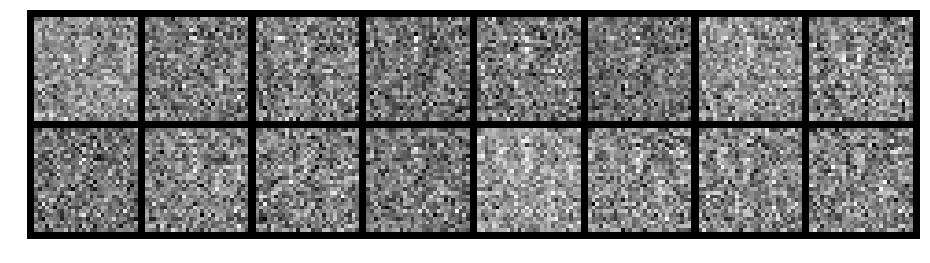

Epoch: [0/200], Batch Num: [0/600]
Discriminator Loss: 1.3781, Generator Loss: 0.6683
D(x): 0.5168, D(G(z)): 0.5121


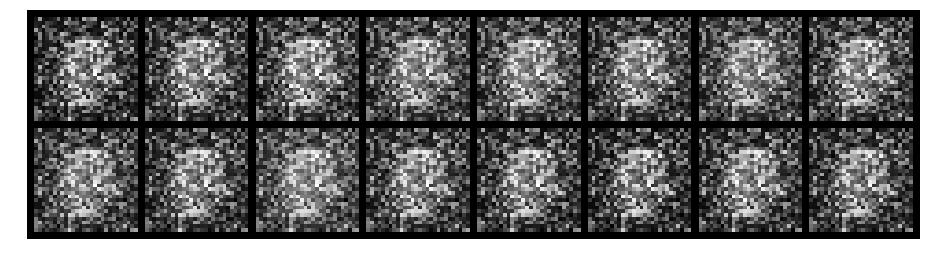

Epoch: [0/200], Batch Num: [100/600]
Discriminator Loss: 1.4217, Generator Loss: 1.2111
D(x): 0.6527, D(G(z)): 0.5119


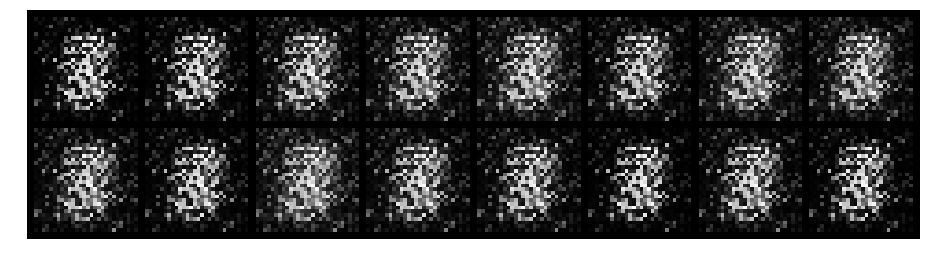

Epoch: [0/200], Batch Num: [200/600]
Discriminator Loss: 1.0990, Generator Loss: 1.8625
D(x): 0.6667, D(G(z)): 0.4232


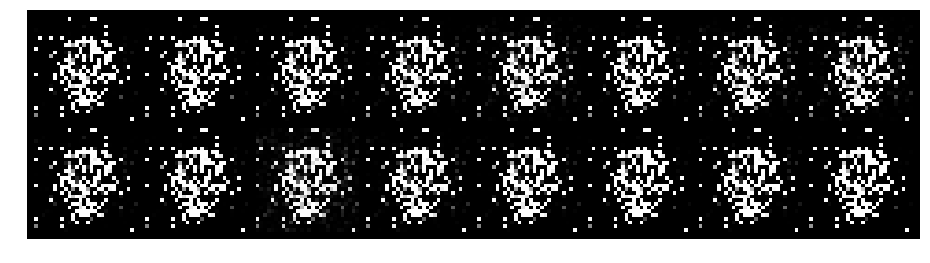

Epoch: [0/200], Batch Num: [300/600]
Discriminator Loss: 0.0457, Generator Loss: 7.5706
D(x): 0.9861, D(G(z)): 0.0284


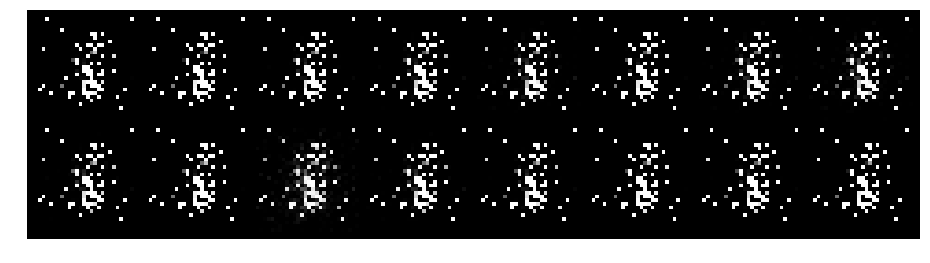

Epoch: [0/200], Batch Num: [400/600]
Discriminator Loss: 0.0309, Generator Loss: 8.7655
D(x): 0.9834, D(G(z)): 0.0046


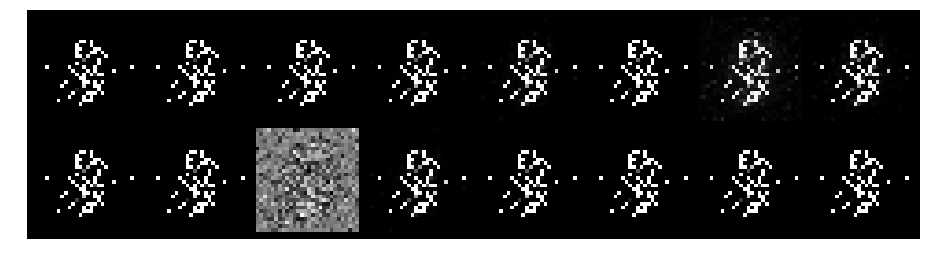

Epoch: [0/200], Batch Num: [500/600]
Discriminator Loss: 0.0448, Generator Loss: 16.4947
D(x): 0.9930, D(G(z)): 0.0181


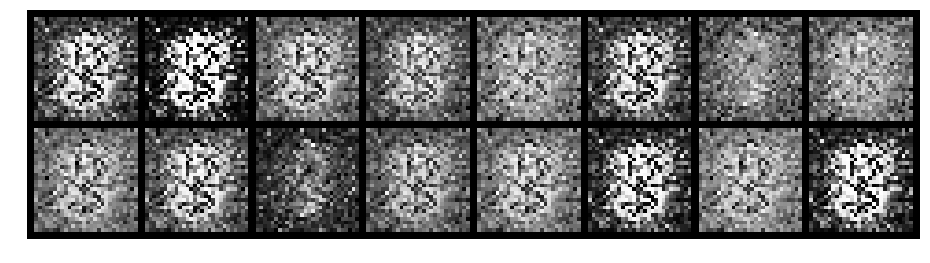

Epoch: [1/200], Batch Num: [0/600]
Discriminator Loss: 0.1585, Generator Loss: 6.5585
D(x): 0.9796, D(G(z)): 0.0890


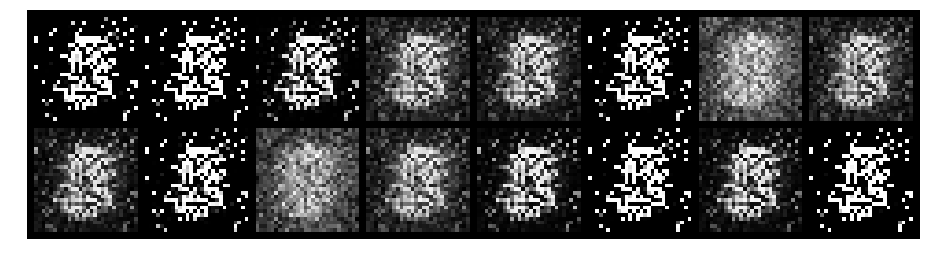

Epoch: [1/200], Batch Num: [100/600]
Discriminator Loss: 0.2012, Generator Loss: 8.6978
D(x): 0.9272, D(G(z)): 0.0811


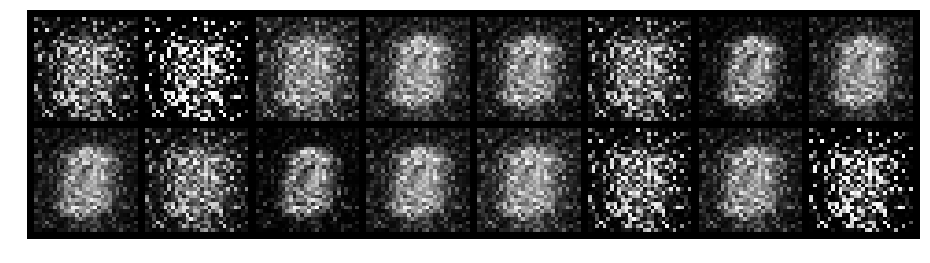

Epoch: [1/200], Batch Num: [200/600]
Discriminator Loss: 0.5741, Generator Loss: 6.6462
D(x): 0.8277, D(G(z)): 0.1896


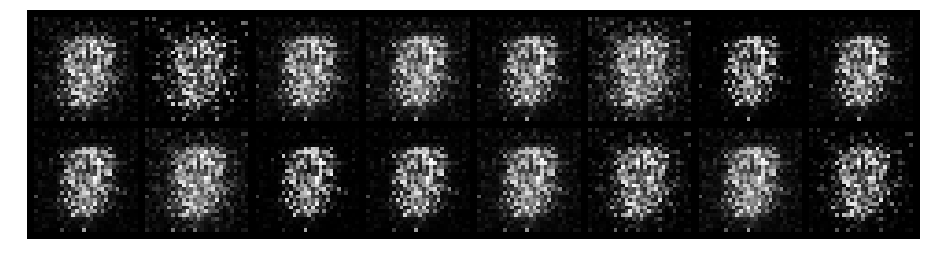

Epoch: [1/200], Batch Num: [300/600]
Discriminator Loss: 0.6523, Generator Loss: 3.2426
D(x): 0.7680, D(G(z)): 0.1967


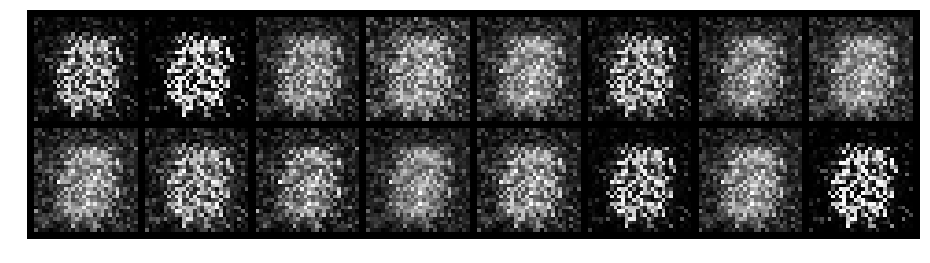

Epoch: [1/200], Batch Num: [400/600]
Discriminator Loss: 0.9156, Generator Loss: 4.7025
D(x): 0.8173, D(G(z)): 0.3144


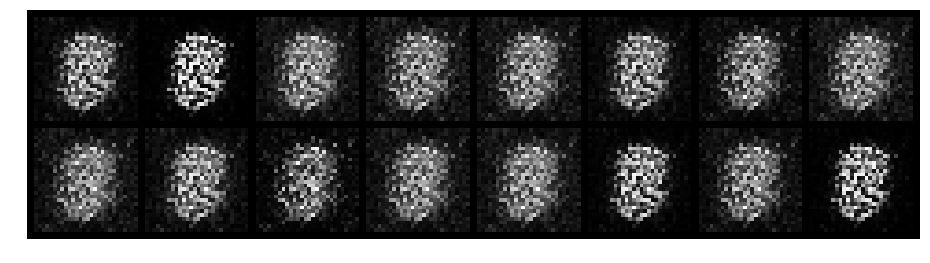

Epoch: [1/200], Batch Num: [500/600]
Discriminator Loss: 1.1209, Generator Loss: 4.4120
D(x): 0.7342, D(G(z)): 0.3189


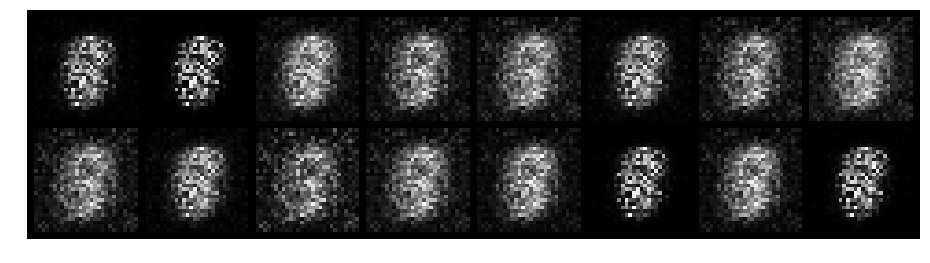

Epoch: [2/200], Batch Num: [0/600]
Discriminator Loss: 1.0319, Generator Loss: 1.8015
D(x): 0.6934, D(G(z)): 0.3513


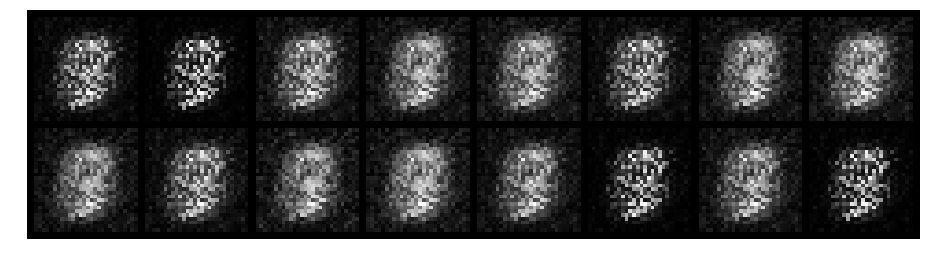

Epoch: [2/200], Batch Num: [100/600]
Discriminator Loss: 0.7336, Generator Loss: 3.0085
D(x): 0.7672, D(G(z)): 0.2130


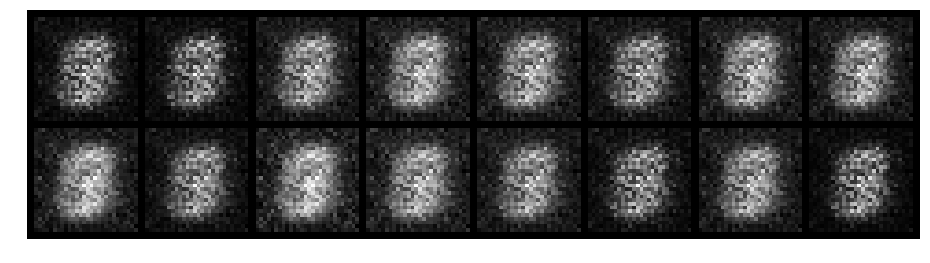

Epoch: [2/200], Batch Num: [200/600]
Discriminator Loss: 0.8737, Generator Loss: 1.6183
D(x): 0.6760, D(G(z)): 0.2924


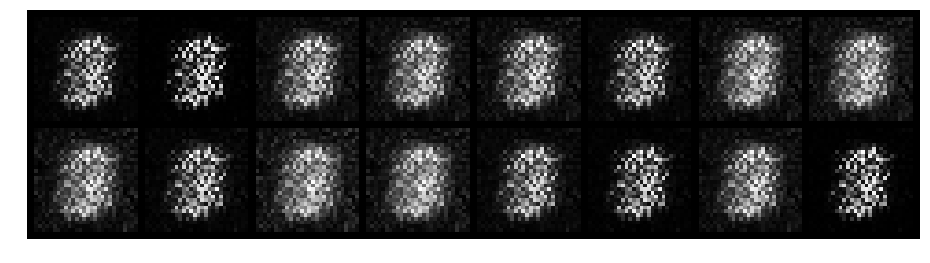

Epoch: [2/200], Batch Num: [300/600]
Discriminator Loss: 0.5395, Generator Loss: 3.3092
D(x): 0.7924, D(G(z)): 0.1562


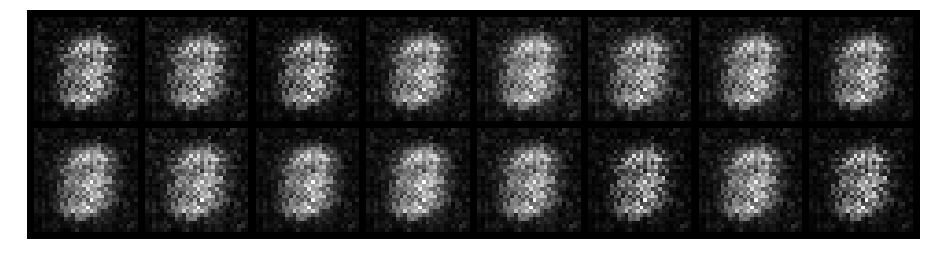

Epoch: [2/200], Batch Num: [400/600]
Discriminator Loss: 0.4467, Generator Loss: 2.8095
D(x): 0.8555, D(G(z)): 0.1332


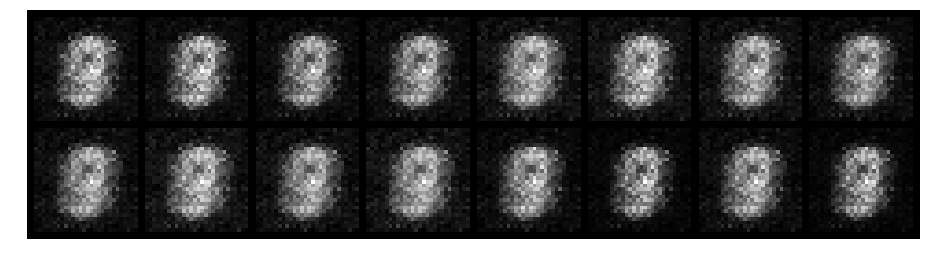

Epoch: [2/200], Batch Num: [500/600]
Discriminator Loss: 1.0183, Generator Loss: 1.5726
D(x): 0.7673, D(G(z)): 0.4005


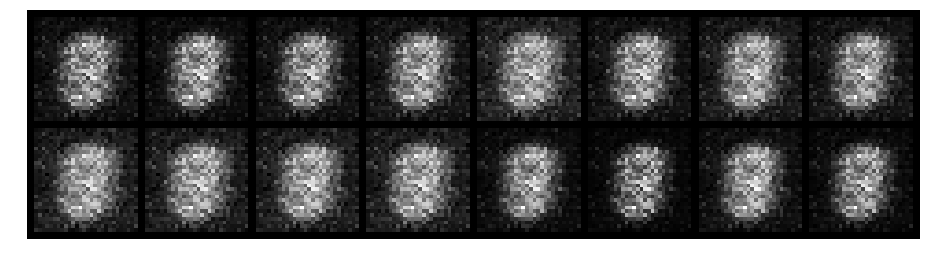

Epoch: [3/200], Batch Num: [0/600]
Discriminator Loss: 0.2306, Generator Loss: 3.1888
D(x): 0.9221, D(G(z)): 0.1077


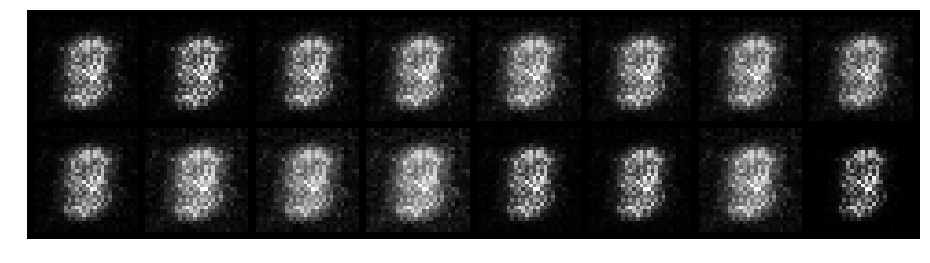

Epoch: [3/200], Batch Num: [100/600]
Discriminator Loss: 0.4127, Generator Loss: 5.5711
D(x): 0.8628, D(G(z)): 0.1210


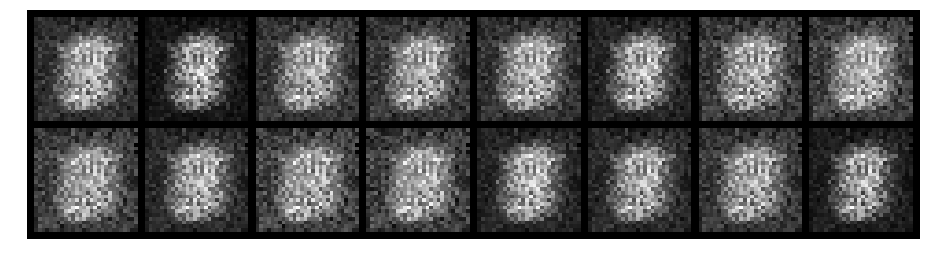

Epoch: [3/200], Batch Num: [200/600]
Discriminator Loss: 0.7409, Generator Loss: 2.5545
D(x): 0.8258, D(G(z)): 0.2155


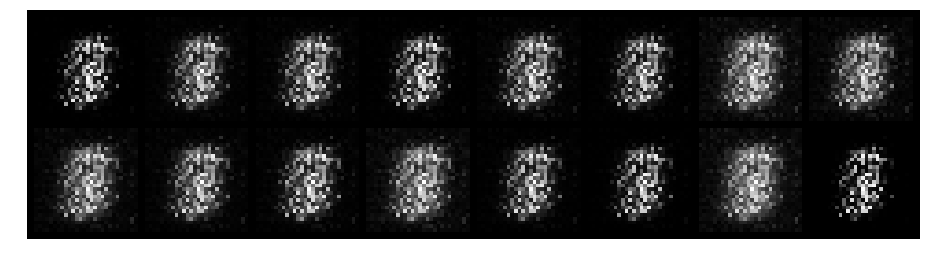

Epoch: [3/200], Batch Num: [300/600]
Discriminator Loss: 0.1612, Generator Loss: 4.2335
D(x): 0.9210, D(G(z)): 0.0559


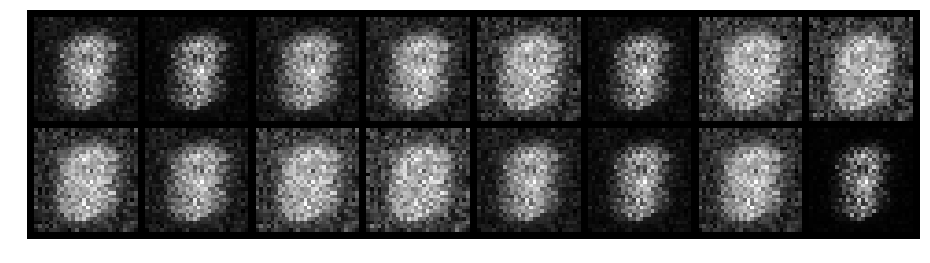

Epoch: [3/200], Batch Num: [400/600]
Discriminator Loss: 0.3156, Generator Loss: 4.0905
D(x): 0.9351, D(G(z)): 0.1408


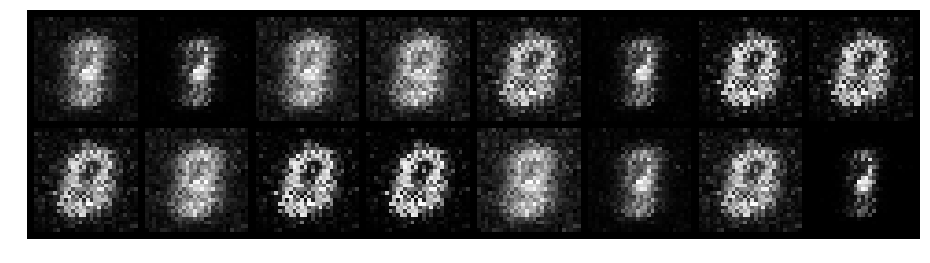

Epoch: [3/200], Batch Num: [500/600]
Discriminator Loss: 0.7586, Generator Loss: 3.0993
D(x): 0.8326, D(G(z)): 0.2047


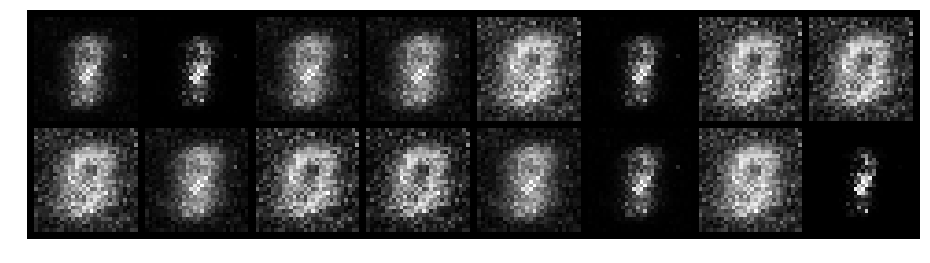

Epoch: [4/200], Batch Num: [0/600]
Discriminator Loss: 0.4195, Generator Loss: 2.7998
D(x): 0.9087, D(G(z)): 0.1691


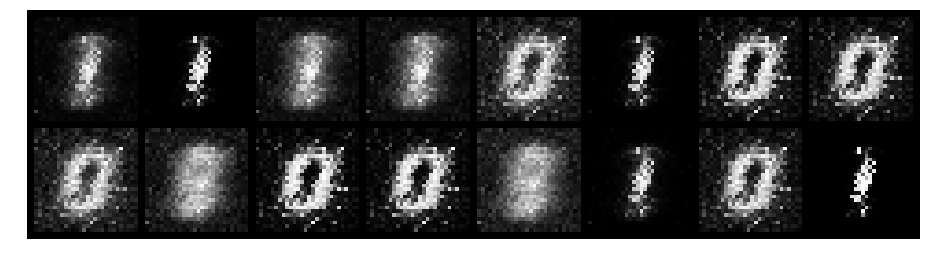

Epoch: [4/200], Batch Num: [100/600]
Discriminator Loss: 0.4963, Generator Loss: 3.0656
D(x): 0.8903, D(G(z)): 0.1674


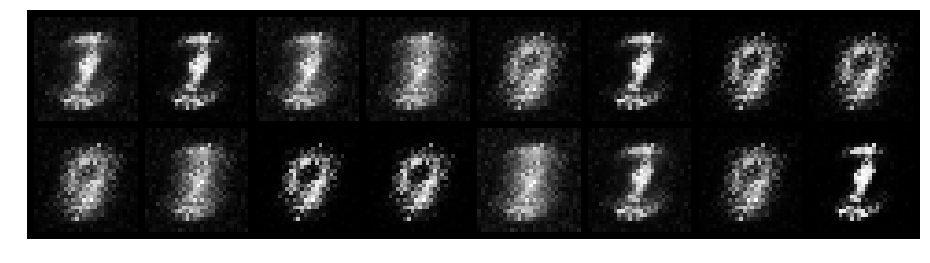

Epoch: [4/200], Batch Num: [200/600]
Discriminator Loss: 0.3828, Generator Loss: 3.5294
D(x): 0.8918, D(G(z)): 0.0960


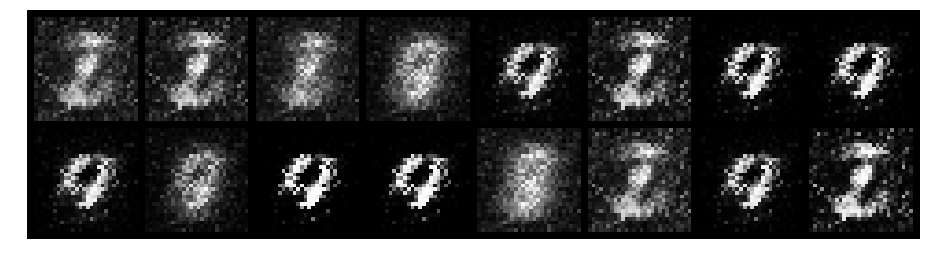

Epoch: [4/200], Batch Num: [300/600]
Discriminator Loss: 0.3288, Generator Loss: 4.9177
D(x): 0.9143, D(G(z)): 0.1143


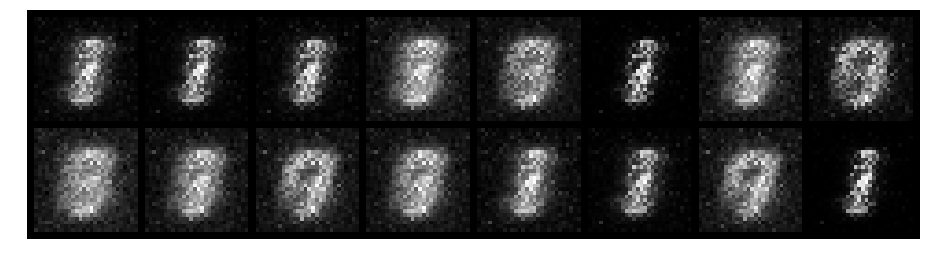

Epoch: [4/200], Batch Num: [400/600]
Discriminator Loss: 0.4471, Generator Loss: 3.7183
D(x): 0.8665, D(G(z)): 0.0666


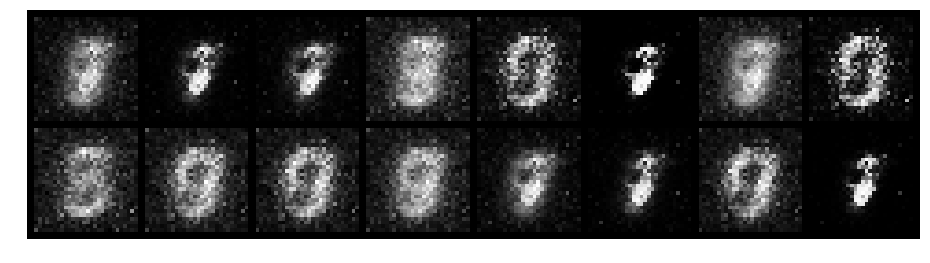

Epoch: [4/200], Batch Num: [500/600]
Discriminator Loss: 0.4079, Generator Loss: 2.7128
D(x): 0.9374, D(G(z)): 0.2176


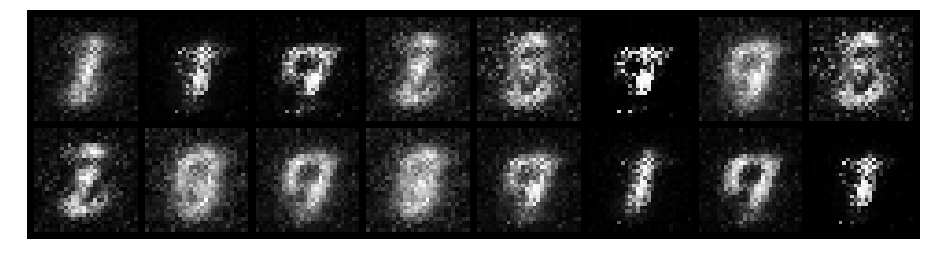

Epoch: [5/200], Batch Num: [0/600]
Discriminator Loss: 0.2480, Generator Loss: 3.5737
D(x): 0.9142, D(G(z)): 0.0706


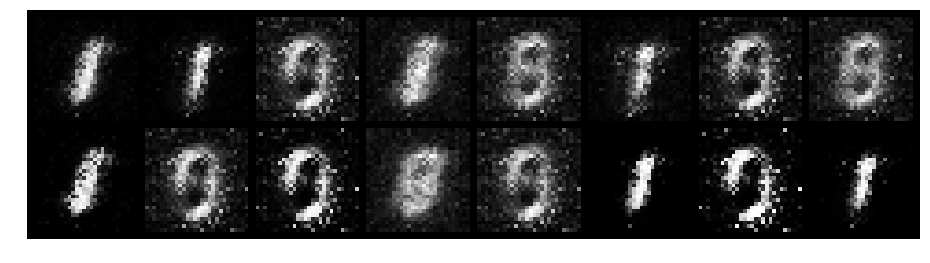

Epoch: [5/200], Batch Num: [100/600]
Discriminator Loss: 0.3925, Generator Loss: 3.3931
D(x): 0.9303, D(G(z)): 0.1570


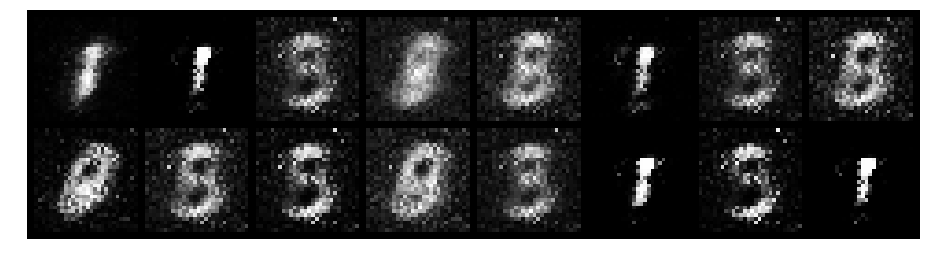

Epoch: [5/200], Batch Num: [200/600]
Discriminator Loss: 0.4011, Generator Loss: 3.2221
D(x): 0.8635, D(G(z)): 0.1297


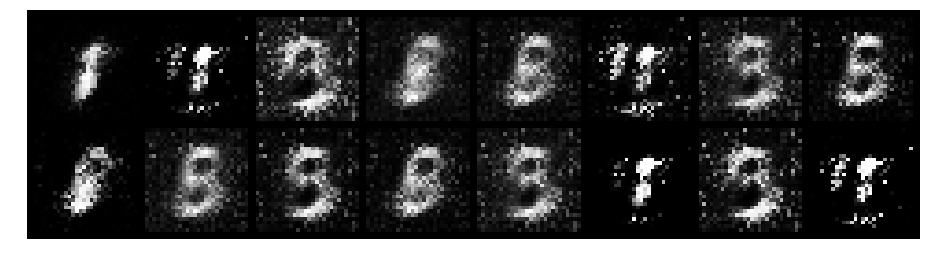

Epoch: [5/200], Batch Num: [300/600]
Discriminator Loss: 0.2306, Generator Loss: 4.3218
D(x): 0.9265, D(G(z)): 0.0630


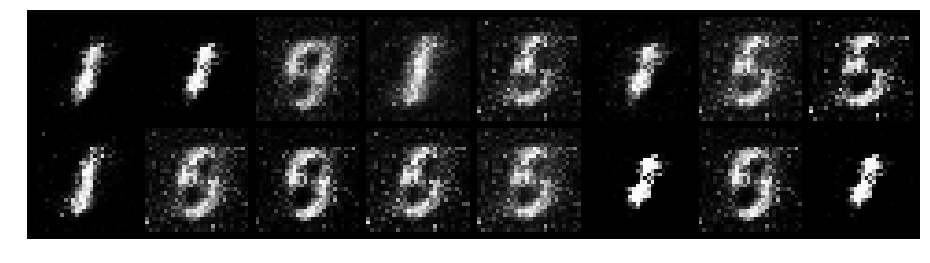

Epoch: [5/200], Batch Num: [400/600]
Discriminator Loss: 0.1767, Generator Loss: 4.0870
D(x): 0.9702, D(G(z)): 0.0811


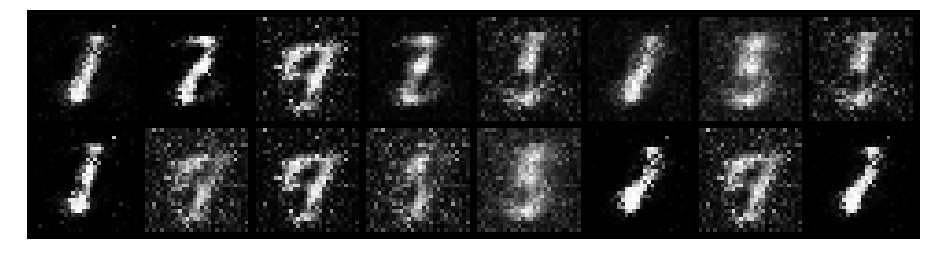

Epoch: [5/200], Batch Num: [500/600]
Discriminator Loss: 0.5820, Generator Loss: 4.8902
D(x): 0.8414, D(G(z)): 0.1072


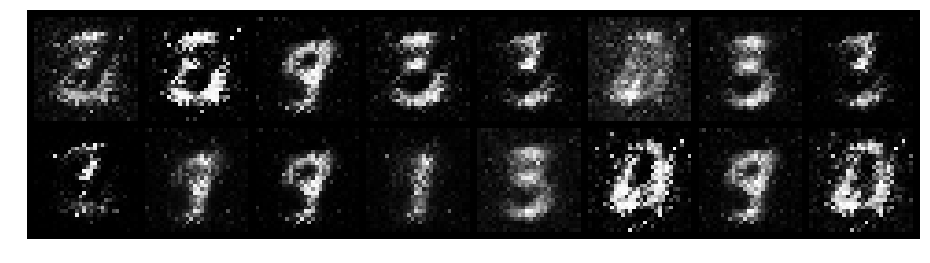

Epoch: [6/200], Batch Num: [0/600]
Discriminator Loss: 0.4671, Generator Loss: 3.7729
D(x): 0.8369, D(G(z)): 0.0823


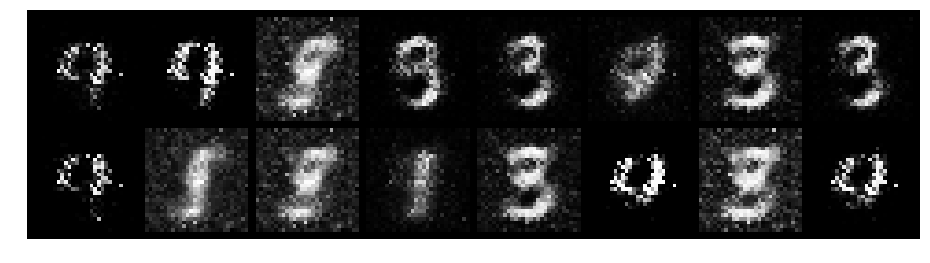

Epoch: [6/200], Batch Num: [100/600]
Discriminator Loss: 0.4386, Generator Loss: 3.0093
D(x): 0.9257, D(G(z)): 0.1903


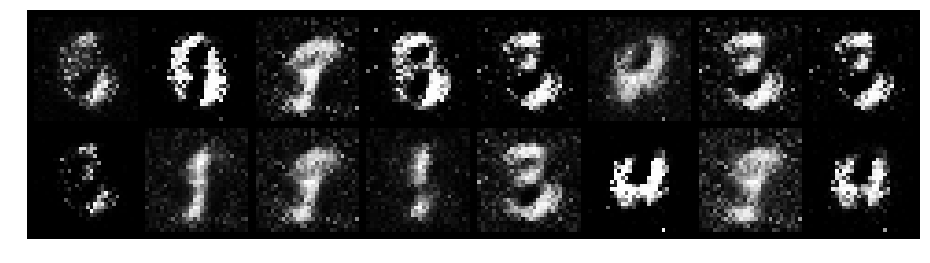

Epoch: [6/200], Batch Num: [200/600]
Discriminator Loss: 0.6524, Generator Loss: 2.0918
D(x): 0.8460, D(G(z)): 0.2345


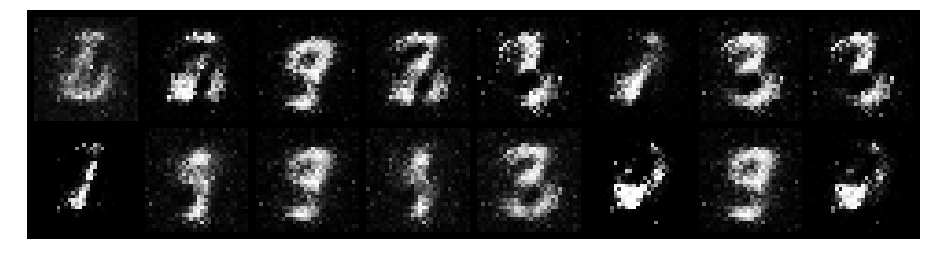

Epoch: [6/200], Batch Num: [300/600]
Discriminator Loss: 0.5182, Generator Loss: 2.9302
D(x): 0.8083, D(G(z)): 0.1133


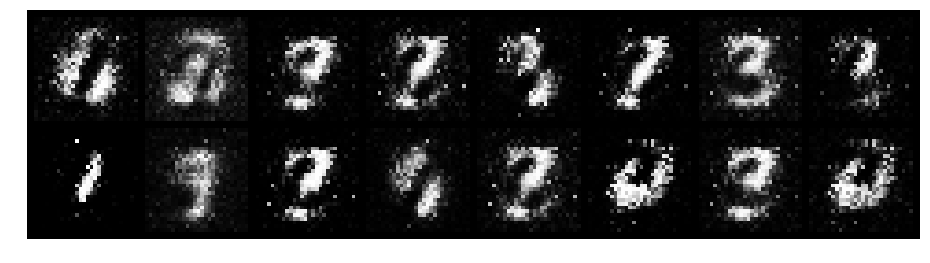

Epoch: [6/200], Batch Num: [400/600]
Discriminator Loss: 0.2591, Generator Loss: 3.5289
D(x): 0.9220, D(G(z)): 0.1053


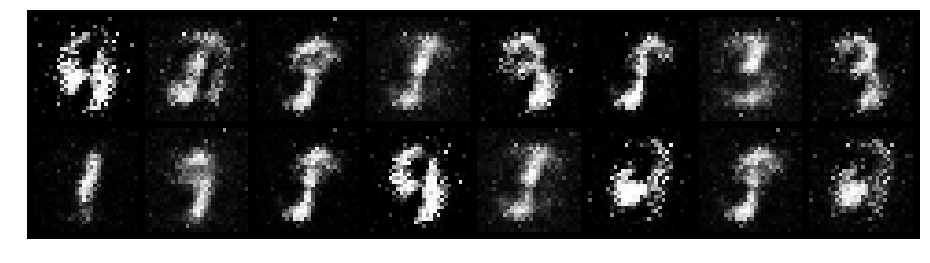

Epoch: [6/200], Batch Num: [500/600]
Discriminator Loss: 0.6500, Generator Loss: 2.9385
D(x): 0.8355, D(G(z)): 0.1954


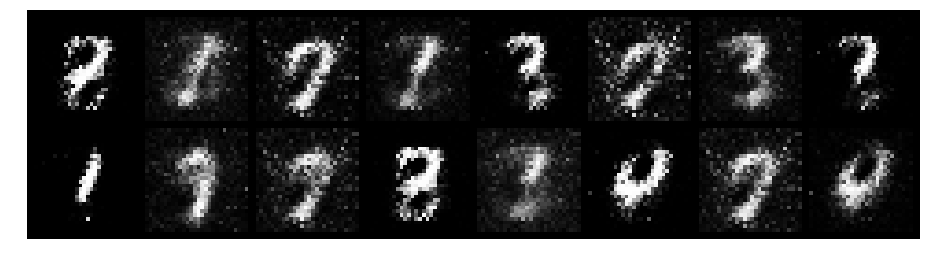

Epoch: [7/200], Batch Num: [0/600]
Discriminator Loss: 0.2198, Generator Loss: 2.6270
D(x): 0.9532, D(G(z)): 0.1282


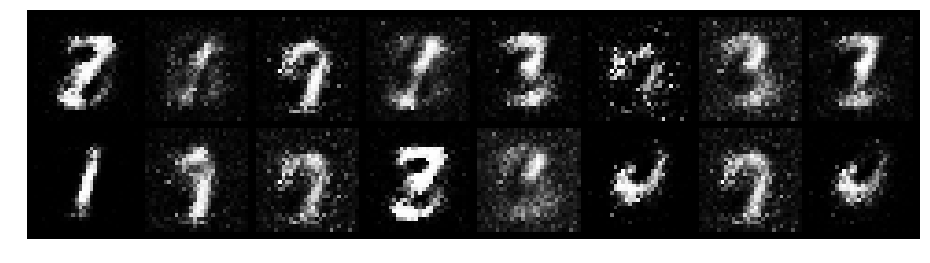

Epoch: [7/200], Batch Num: [100/600]
Discriminator Loss: 0.7786, Generator Loss: 2.1035
D(x): 0.8168, D(G(z)): 0.2757


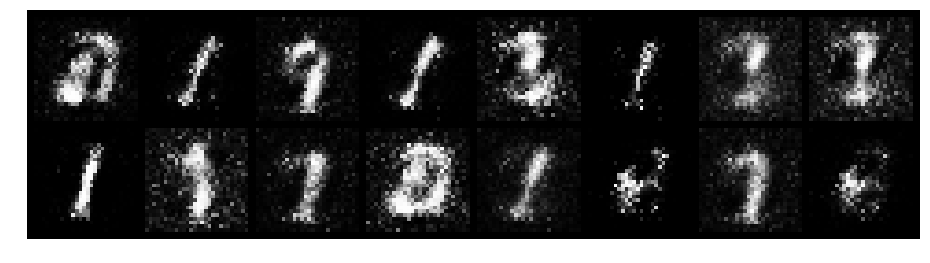

Epoch: [7/200], Batch Num: [200/600]
Discriminator Loss: 0.3616, Generator Loss: 2.8502
D(x): 0.8623, D(G(z)): 0.1002


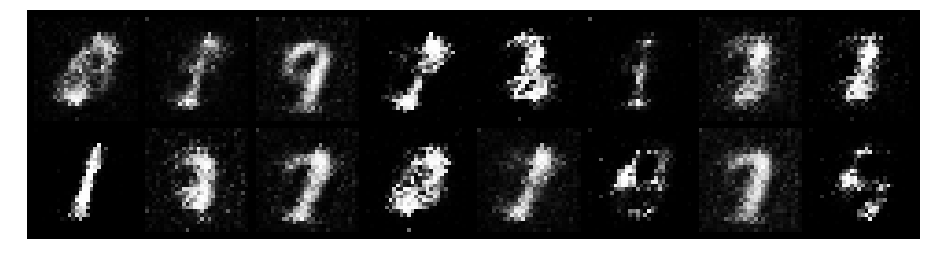

Epoch: [7/200], Batch Num: [300/600]
Discriminator Loss: 0.7807, Generator Loss: 2.4437
D(x): 0.8170, D(G(z)): 0.2759


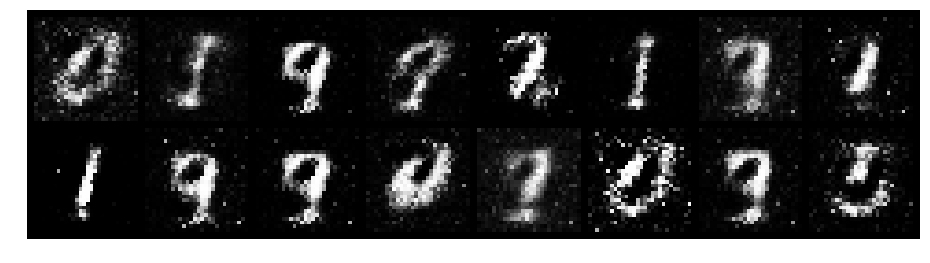

Epoch: [7/200], Batch Num: [400/600]
Discriminator Loss: 0.6254, Generator Loss: 1.9524
D(x): 0.8666, D(G(z)): 0.2587


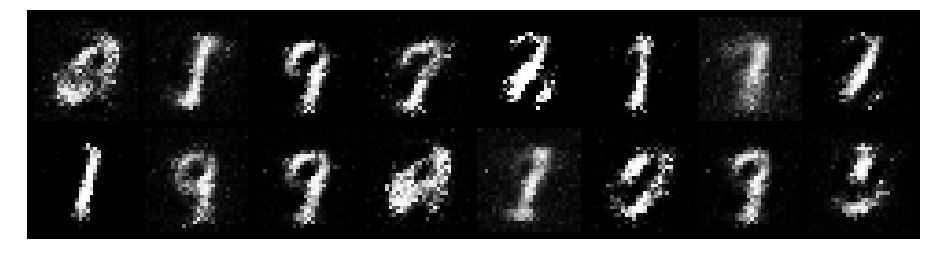

Epoch: [7/200], Batch Num: [500/600]
Discriminator Loss: 0.2552, Generator Loss: 2.0468
D(x): 0.9385, D(G(z)): 0.1242


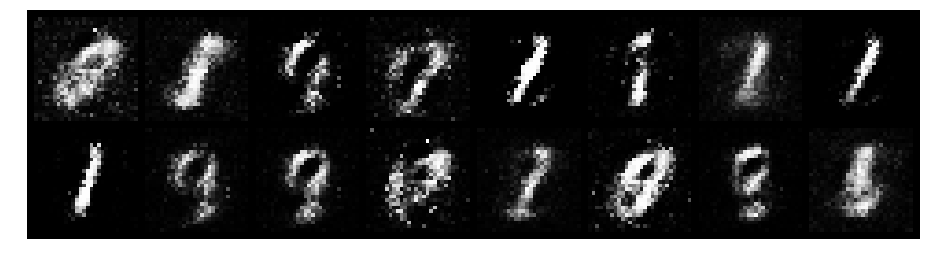

Epoch: [8/200], Batch Num: [0/600]
Discriminator Loss: 0.5084, Generator Loss: 2.8531
D(x): 0.8692, D(G(z)): 0.1631


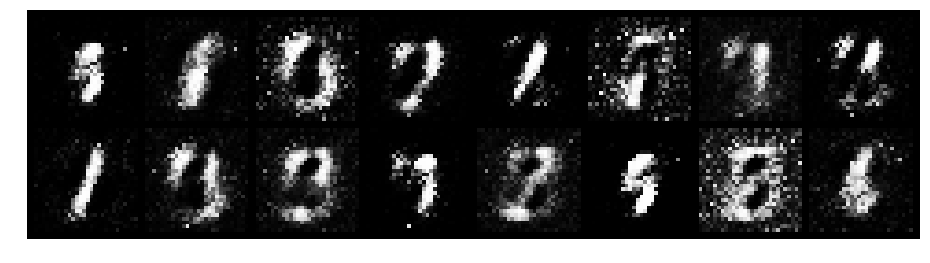

Epoch: [8/200], Batch Num: [100/600]
Discriminator Loss: 0.4868, Generator Loss: 2.8011
D(x): 0.9205, D(G(z)): 0.2318


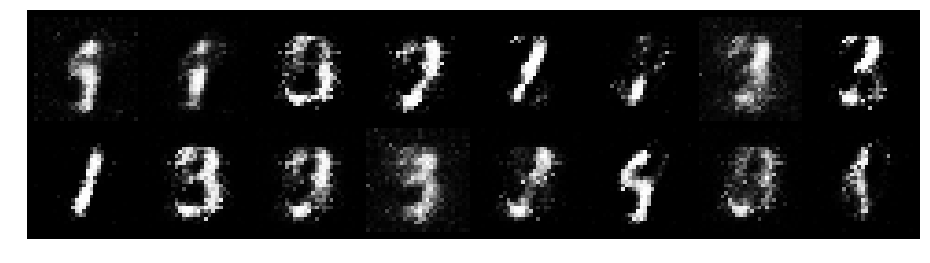

Epoch: [8/200], Batch Num: [200/600]
Discriminator Loss: 0.3861, Generator Loss: 2.4388
D(x): 0.8803, D(G(z)): 0.1643


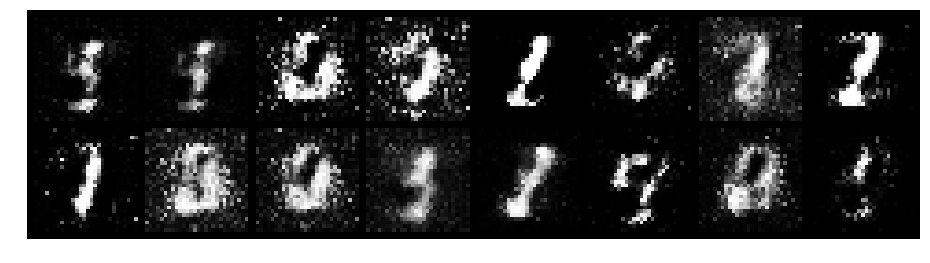

Epoch: [8/200], Batch Num: [300/600]
Discriminator Loss: 0.6974, Generator Loss: 2.4509
D(x): 0.8212, D(G(z)): 0.2724


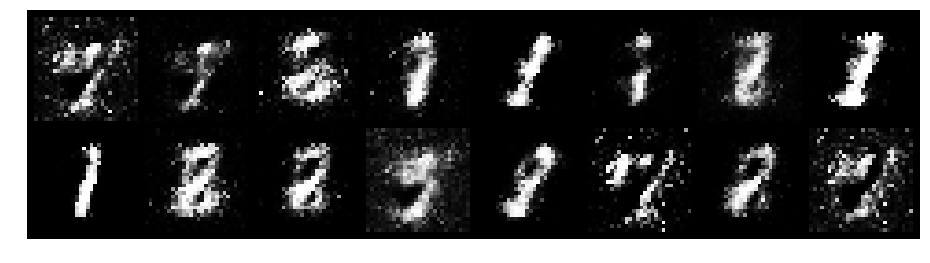

Epoch: [8/200], Batch Num: [400/600]
Discriminator Loss: 0.5810, Generator Loss: 2.8612
D(x): 0.8108, D(G(z)): 0.1541


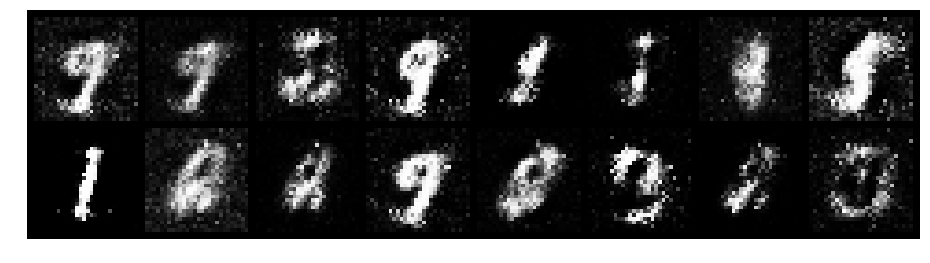

Epoch: [8/200], Batch Num: [500/600]
Discriminator Loss: 0.8649, Generator Loss: 1.8445
D(x): 0.8112, D(G(z)): 0.3234


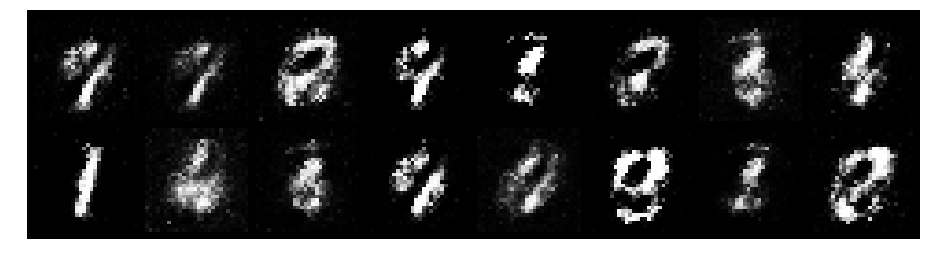

Epoch: [9/200], Batch Num: [0/600]
Discriminator Loss: 0.6283, Generator Loss: 2.5737
D(x): 0.7937, D(G(z)): 0.1748


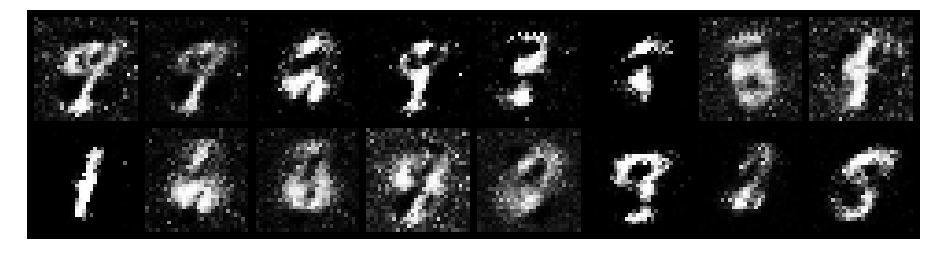

Epoch: [9/200], Batch Num: [100/600]
Discriminator Loss: 0.8452, Generator Loss: 1.9455
D(x): 0.7820, D(G(z)): 0.2389


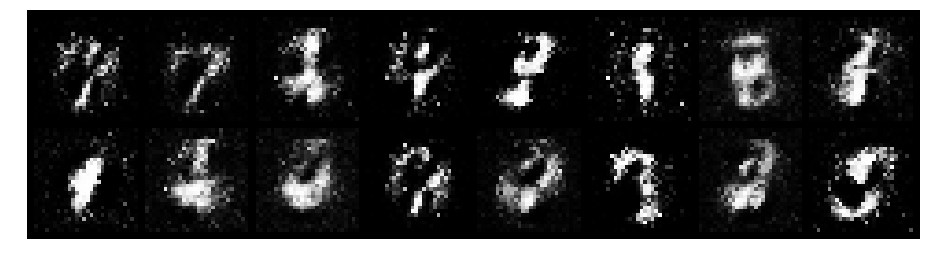

Epoch: [9/200], Batch Num: [200/600]
Discriminator Loss: 0.6201, Generator Loss: 2.4603
D(x): 0.8909, D(G(z)): 0.2479


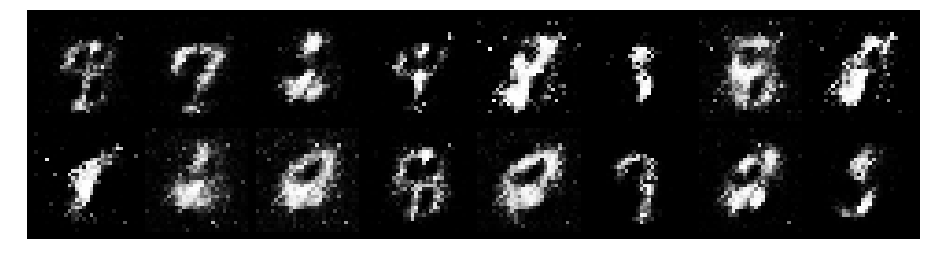

Epoch: [9/200], Batch Num: [300/600]
Discriminator Loss: 0.4234, Generator Loss: 3.2120
D(x): 0.8606, D(G(z)): 0.1539


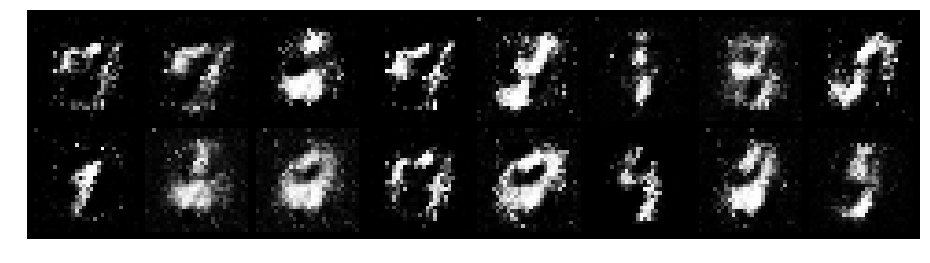

Epoch: [9/200], Batch Num: [400/600]
Discriminator Loss: 0.5939, Generator Loss: 2.2043
D(x): 0.9016, D(G(z)): 0.2888


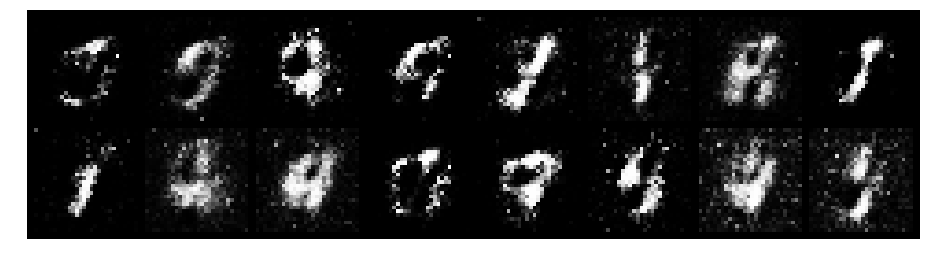

Epoch: [9/200], Batch Num: [500/600]
Discriminator Loss: 0.5008, Generator Loss: 2.4439
D(x): 0.8319, D(G(z)): 0.1689


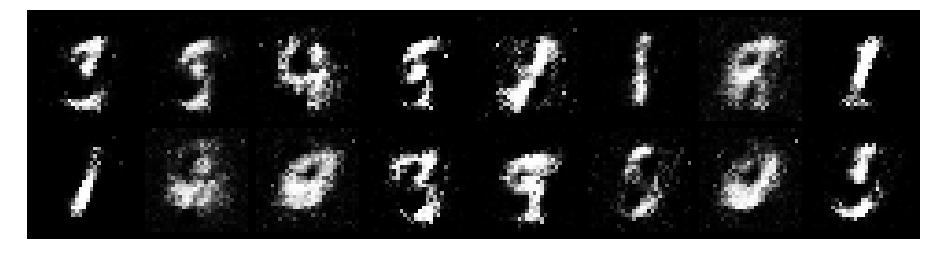

Epoch: [10/200], Batch Num: [0/600]
Discriminator Loss: 0.6422, Generator Loss: 2.2693
D(x): 0.7976, D(G(z)): 0.1857


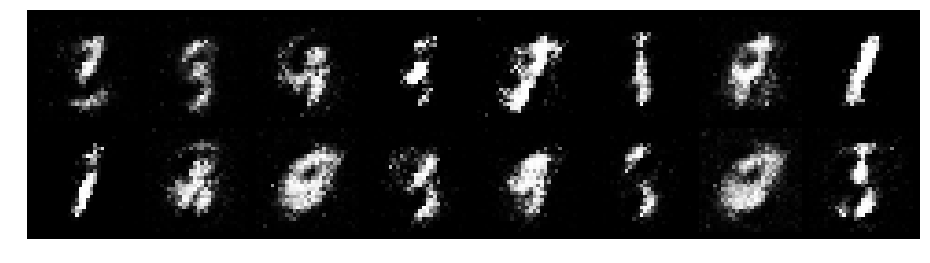

Epoch: [10/200], Batch Num: [100/600]
Discriminator Loss: 0.5407, Generator Loss: 2.2663
D(x): 0.8560, D(G(z)): 0.1851


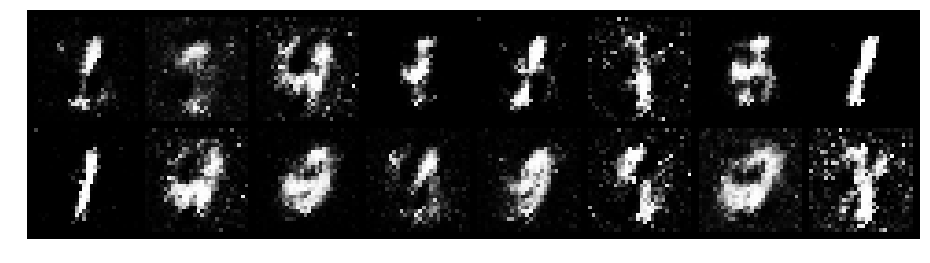

Epoch: [10/200], Batch Num: [200/600]
Discriminator Loss: 0.6807, Generator Loss: 2.6035
D(x): 0.7747, D(G(z)): 0.2109


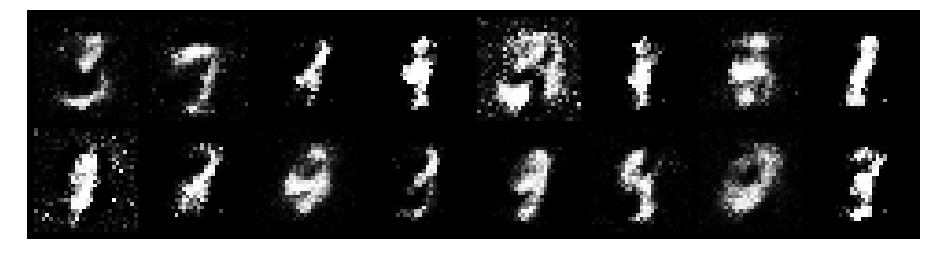

Epoch: [10/200], Batch Num: [300/600]
Discriminator Loss: 0.6988, Generator Loss: 1.5344
D(x): 0.7606, D(G(z)): 0.2734


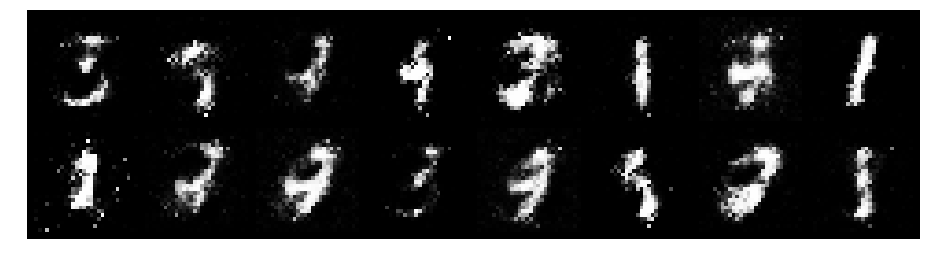

Epoch: [10/200], Batch Num: [400/600]
Discriminator Loss: 0.7189, Generator Loss: 2.2988
D(x): 0.7967, D(G(z)): 0.2387


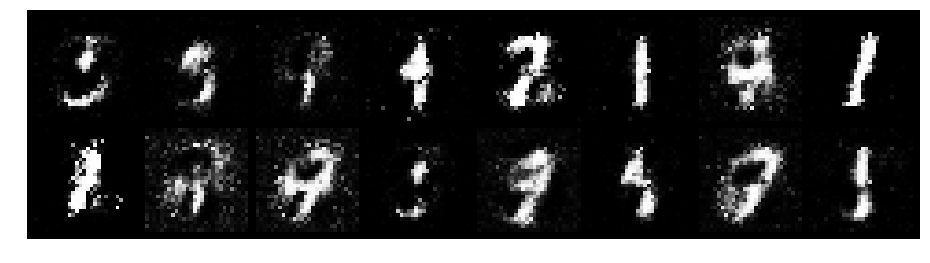

Epoch: [10/200], Batch Num: [500/600]
Discriminator Loss: 0.6069, Generator Loss: 2.3147
D(x): 0.8763, D(G(z)): 0.2005


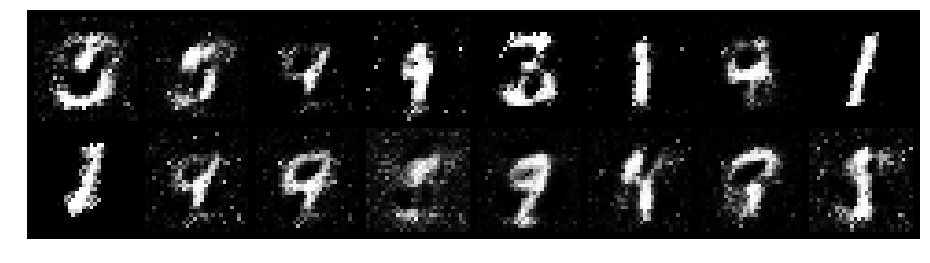

Epoch: [11/200], Batch Num: [0/600]
Discriminator Loss: 0.8348, Generator Loss: 2.1185
D(x): 0.7325, D(G(z)): 0.2431


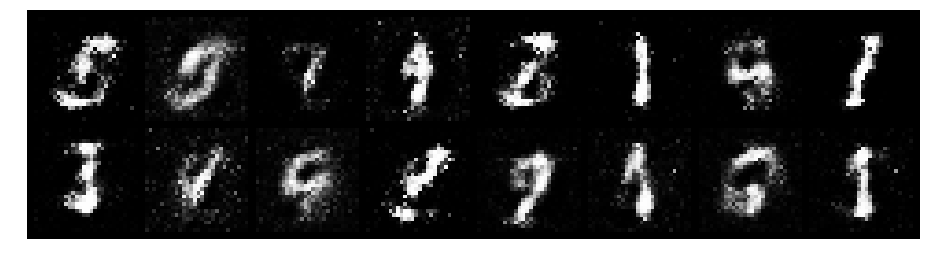

Epoch: [11/200], Batch Num: [100/600]
Discriminator Loss: 0.7078, Generator Loss: 2.2265
D(x): 0.7724, D(G(z)): 0.2292


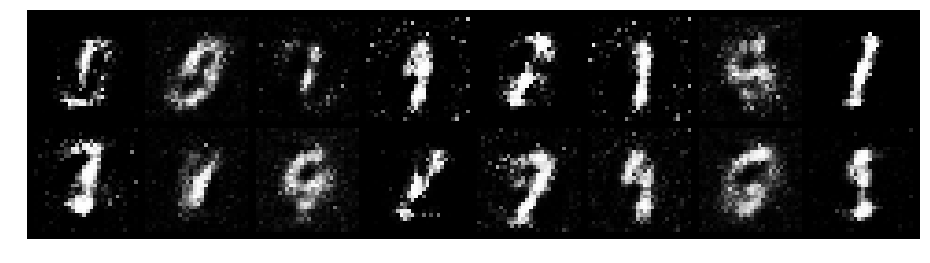

Epoch: [11/200], Batch Num: [200/600]
Discriminator Loss: 0.5174, Generator Loss: 2.9049
D(x): 0.8449, D(G(z)): 0.1827


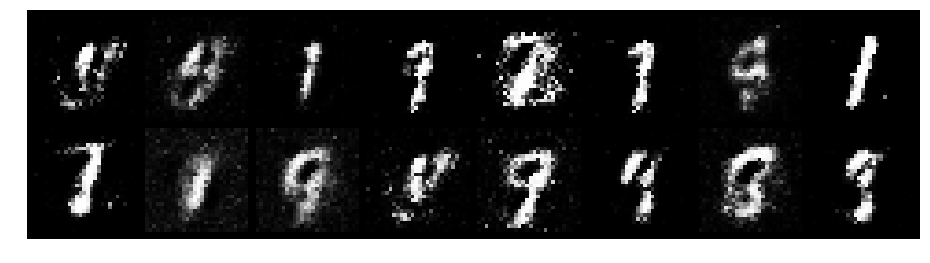

Epoch: [11/200], Batch Num: [300/600]
Discriminator Loss: 0.6225, Generator Loss: 1.8280
D(x): 0.8078, D(G(z)): 0.2388


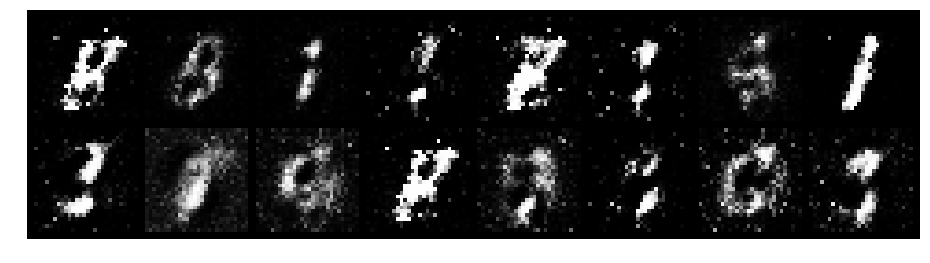

Epoch: [11/200], Batch Num: [400/600]
Discriminator Loss: 0.9268, Generator Loss: 1.8420
D(x): 0.7418, D(G(z)): 0.3129


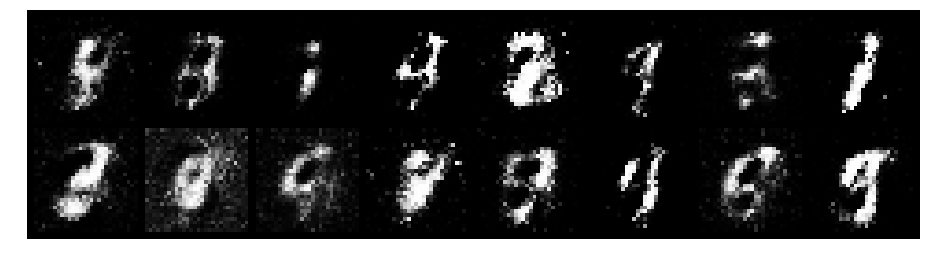

Epoch: [11/200], Batch Num: [500/600]
Discriminator Loss: 0.7246, Generator Loss: 1.8716
D(x): 0.7100, D(G(z)): 0.1936


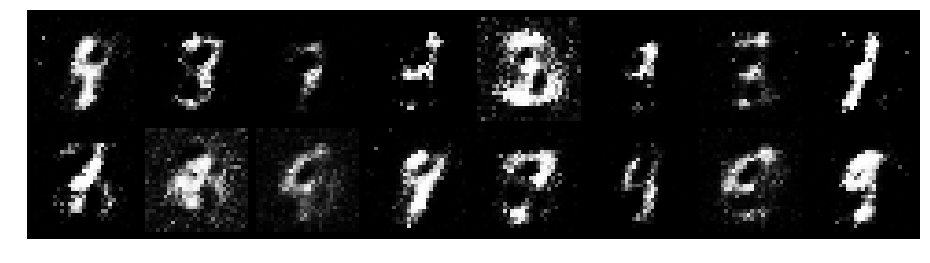

Epoch: [12/200], Batch Num: [0/600]
Discriminator Loss: 0.9128, Generator Loss: 1.3801
D(x): 0.7738, D(G(z)): 0.3419


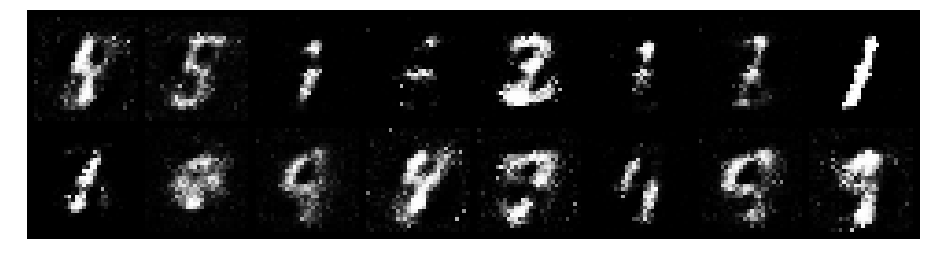

Epoch: [12/200], Batch Num: [100/600]
Discriminator Loss: 0.6083, Generator Loss: 2.0263
D(x): 0.8214, D(G(z)): 0.2228


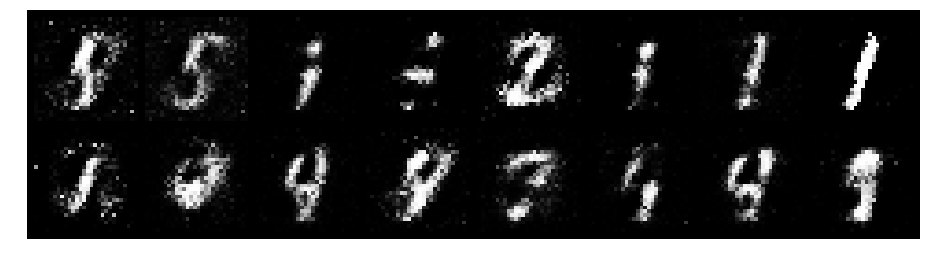

Epoch: [12/200], Batch Num: [200/600]
Discriminator Loss: 0.7556, Generator Loss: 1.9969
D(x): 0.7790, D(G(z)): 0.2028


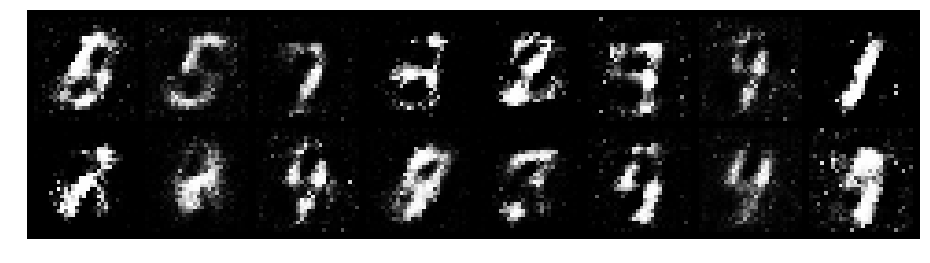

Epoch: [12/200], Batch Num: [300/600]
Discriminator Loss: 0.7036, Generator Loss: 2.1342
D(x): 0.7802, D(G(z)): 0.2314


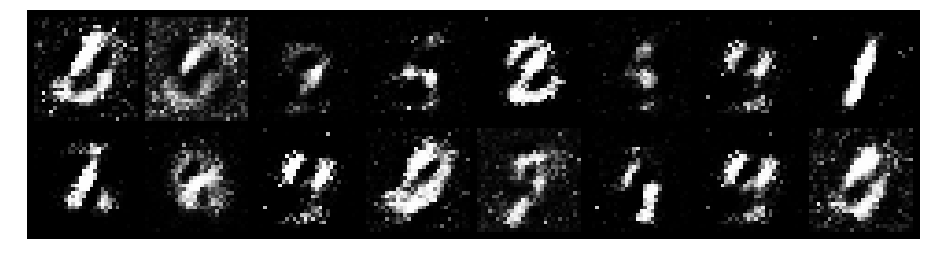

Epoch: [12/200], Batch Num: [400/600]
Discriminator Loss: 0.9198, Generator Loss: 2.2085
D(x): 0.6949, D(G(z)): 0.2615


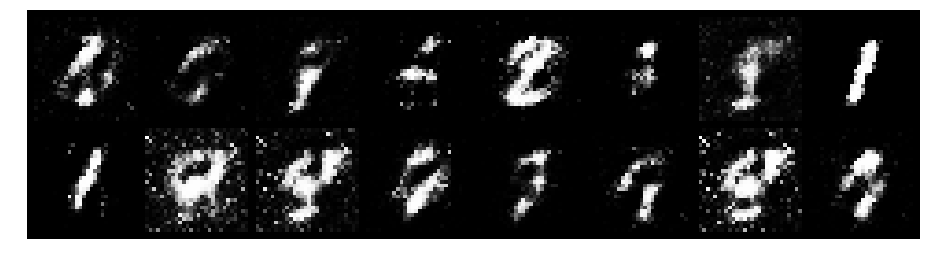

Epoch: [12/200], Batch Num: [500/600]
Discriminator Loss: 0.8199, Generator Loss: 1.7014
D(x): 0.7856, D(G(z)): 0.3373


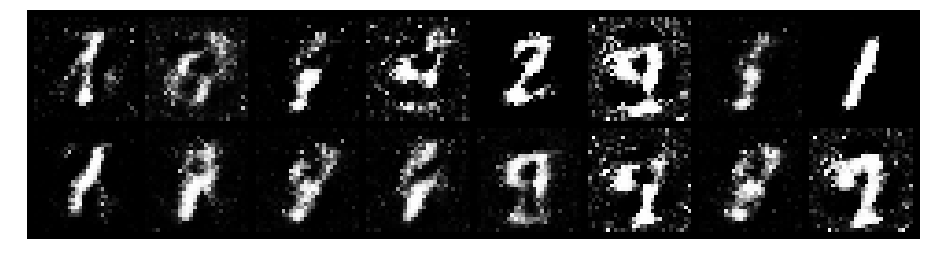

Epoch: [13/200], Batch Num: [0/600]
Discriminator Loss: 0.8615, Generator Loss: 2.2407
D(x): 0.7449, D(G(z)): 0.2460


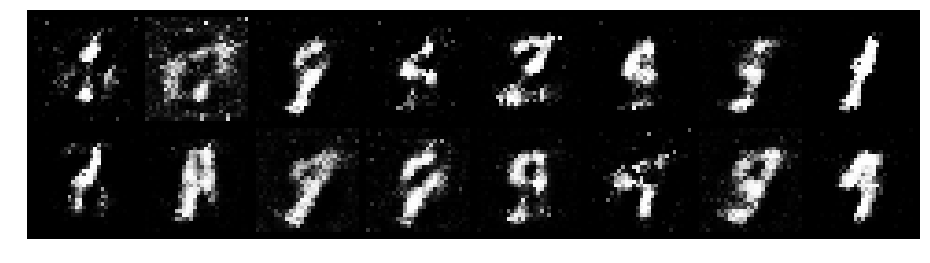

Epoch: [13/200], Batch Num: [100/600]
Discriminator Loss: 0.9059, Generator Loss: 1.9869
D(x): 0.8550, D(G(z)): 0.3703


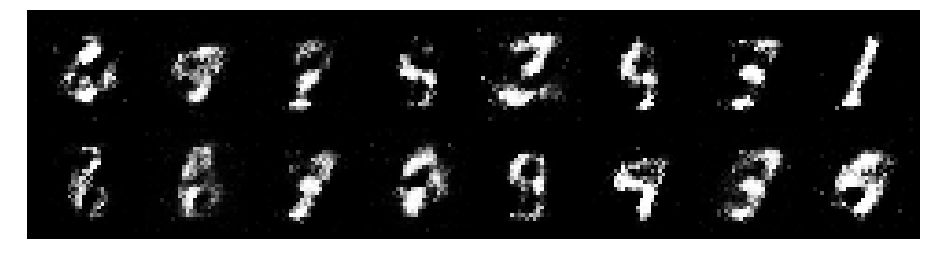

Epoch: [13/200], Batch Num: [200/600]
Discriminator Loss: 0.8192, Generator Loss: 2.2295
D(x): 0.7293, D(G(z)): 0.2430


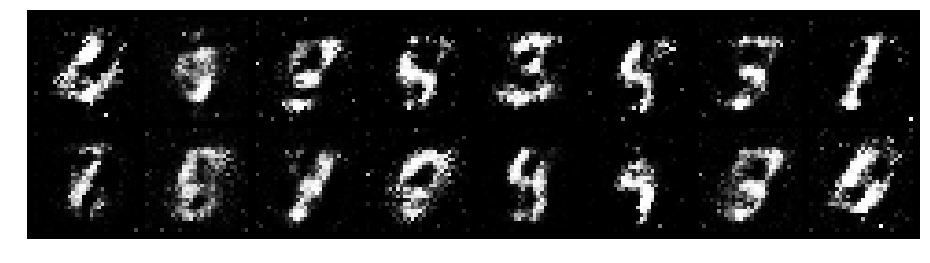

Epoch: [13/200], Batch Num: [300/600]
Discriminator Loss: 0.9300, Generator Loss: 2.0638
D(x): 0.6313, D(G(z)): 0.1693


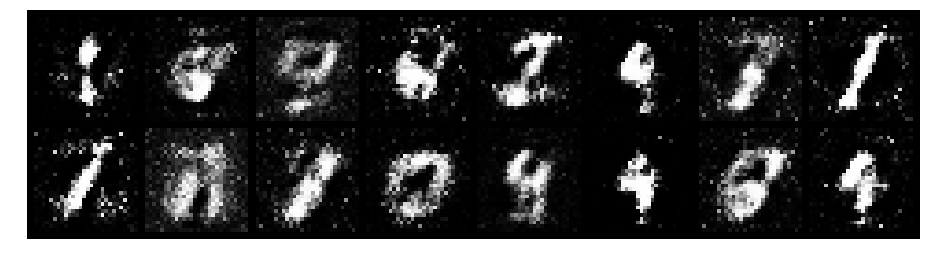

Epoch: [13/200], Batch Num: [400/600]
Discriminator Loss: 0.8972, Generator Loss: 1.3210
D(x): 0.6975, D(G(z)): 0.2966


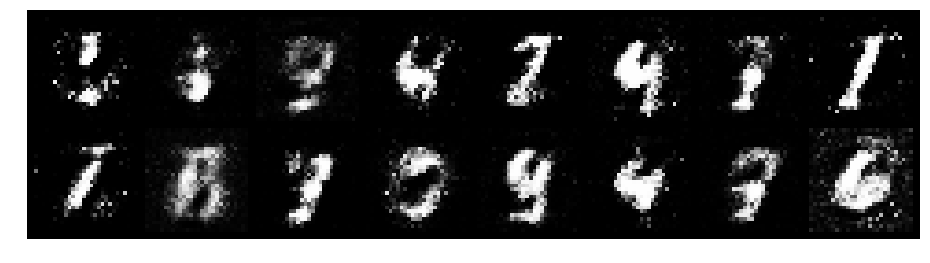

Epoch: [13/200], Batch Num: [500/600]
Discriminator Loss: 0.6852, Generator Loss: 2.0552
D(x): 0.8122, D(G(z)): 0.2445


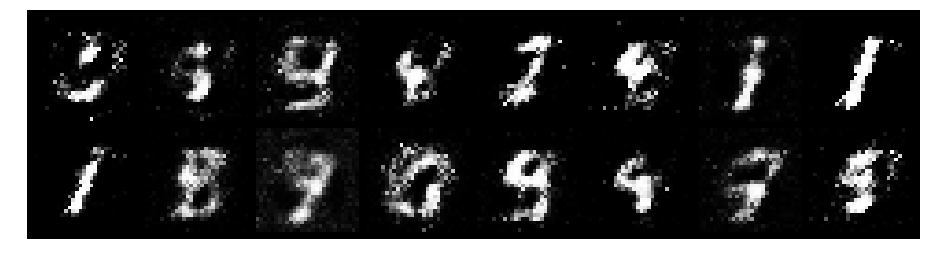

Epoch: [14/200], Batch Num: [0/600]
Discriminator Loss: 0.7483, Generator Loss: 2.5898
D(x): 0.7812, D(G(z)): 0.1787


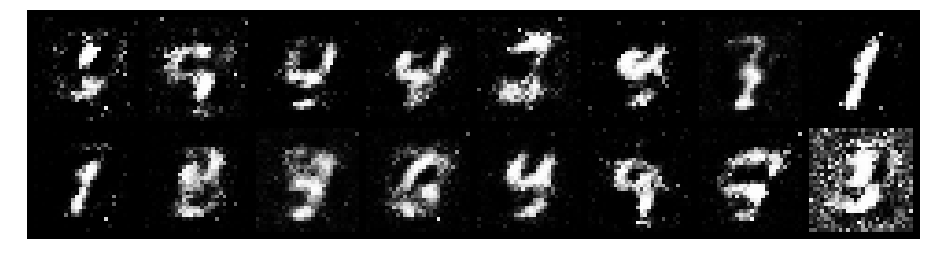

Epoch: [14/200], Batch Num: [100/600]
Discriminator Loss: 0.6773, Generator Loss: 1.8867
D(x): 0.7798, D(G(z)): 0.2363


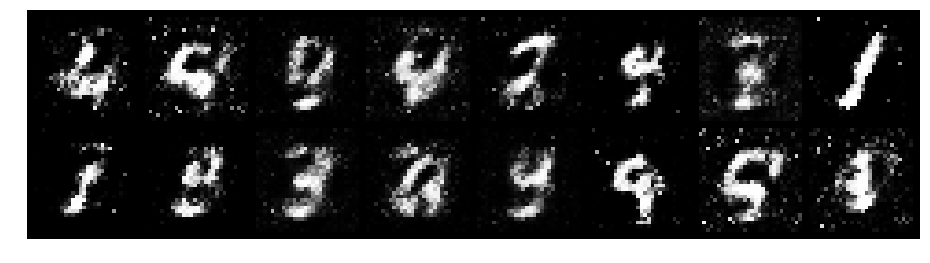

Epoch: [14/200], Batch Num: [200/600]
Discriminator Loss: 0.5201, Generator Loss: 2.2334
D(x): 0.8425, D(G(z)): 0.2177


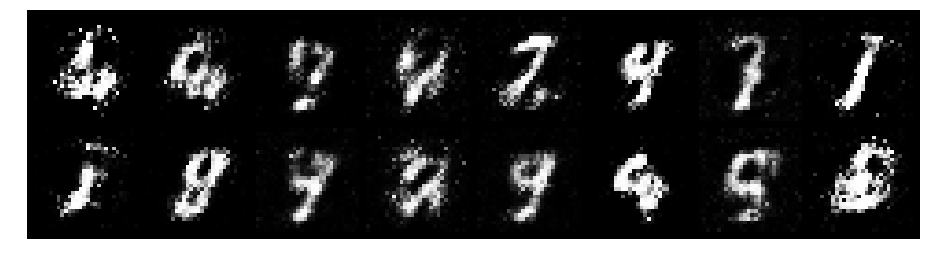

Epoch: [14/200], Batch Num: [300/600]
Discriminator Loss: 0.6887, Generator Loss: 2.7215
D(x): 0.7110, D(G(z)): 0.1123


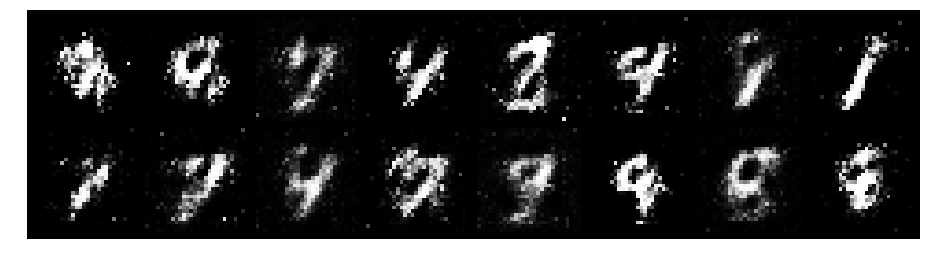

Epoch: [14/200], Batch Num: [400/600]
Discriminator Loss: 0.6348, Generator Loss: 2.1259
D(x): 0.8033, D(G(z)): 0.2459


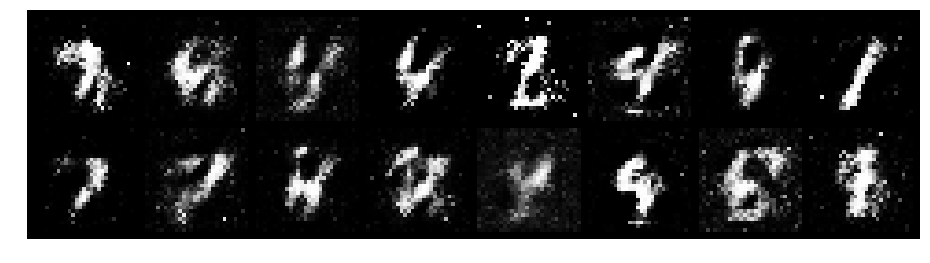

Epoch: [14/200], Batch Num: [500/600]
Discriminator Loss: 0.7314, Generator Loss: 1.6787
D(x): 0.7425, D(G(z)): 0.2439


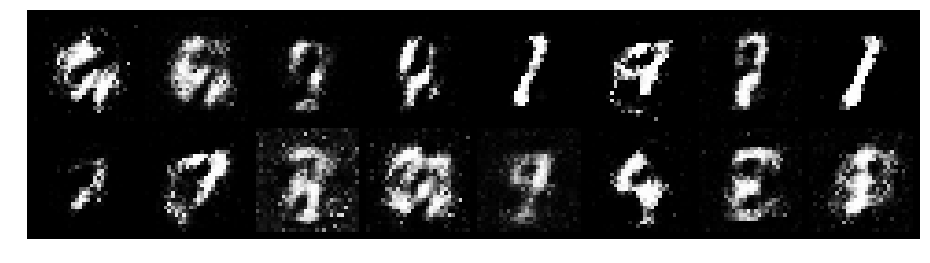

Epoch: [15/200], Batch Num: [0/600]
Discriminator Loss: 0.8601, Generator Loss: 1.5997
D(x): 0.6676, D(G(z)): 0.2330


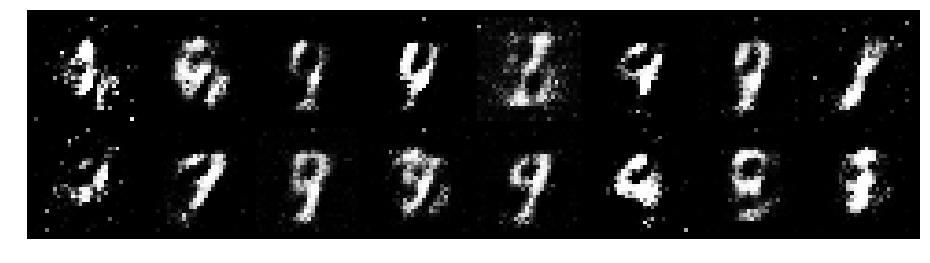

Epoch: [15/200], Batch Num: [100/600]
Discriminator Loss: 0.7567, Generator Loss: 2.1388
D(x): 0.8020, D(G(z)): 0.2715


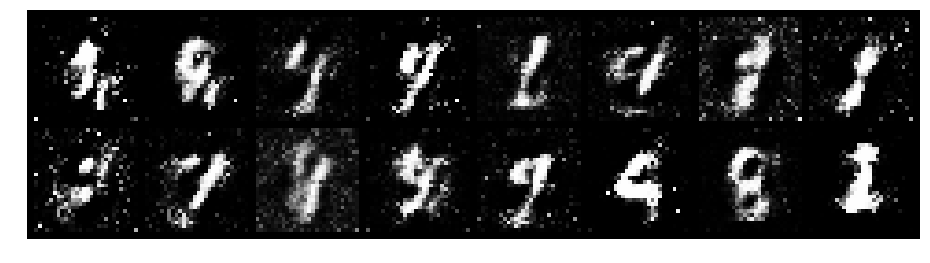

Epoch: [15/200], Batch Num: [200/600]
Discriminator Loss: 0.6363, Generator Loss: 2.3145
D(x): 0.7403, D(G(z)): 0.1621


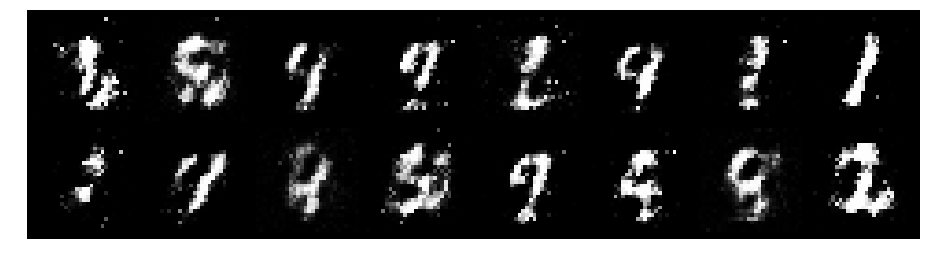

Epoch: [15/200], Batch Num: [300/600]
Discriminator Loss: 0.6485, Generator Loss: 2.3226
D(x): 0.7892, D(G(z)): 0.2156


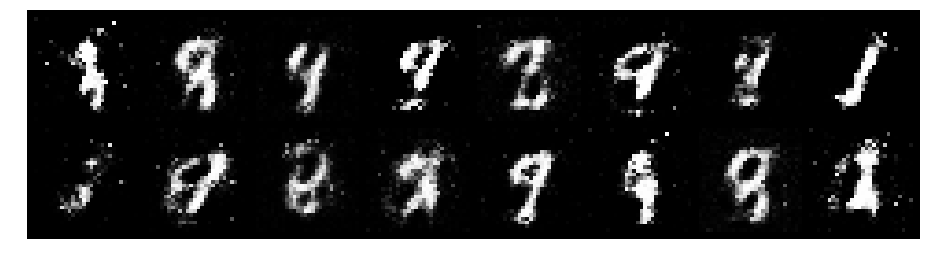

Epoch: [15/200], Batch Num: [400/600]
Discriminator Loss: 0.7337, Generator Loss: 2.0170
D(x): 0.7619, D(G(z)): 0.2656


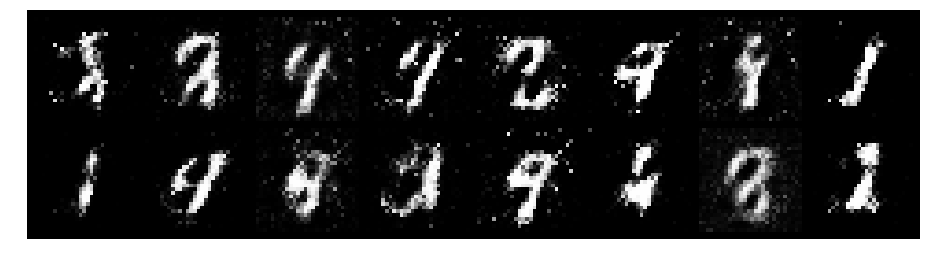

Epoch: [15/200], Batch Num: [500/600]
Discriminator Loss: 0.9297, Generator Loss: 1.7246
D(x): 0.6813, D(G(z)): 0.2844


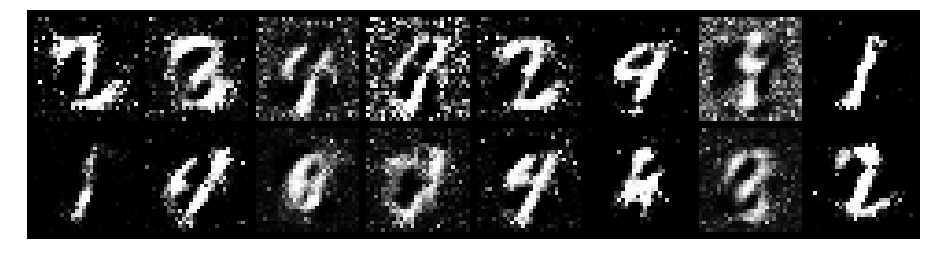

Epoch: [16/200], Batch Num: [0/600]
Discriminator Loss: 0.8585, Generator Loss: 2.3148
D(x): 0.7556, D(G(z)): 0.2574


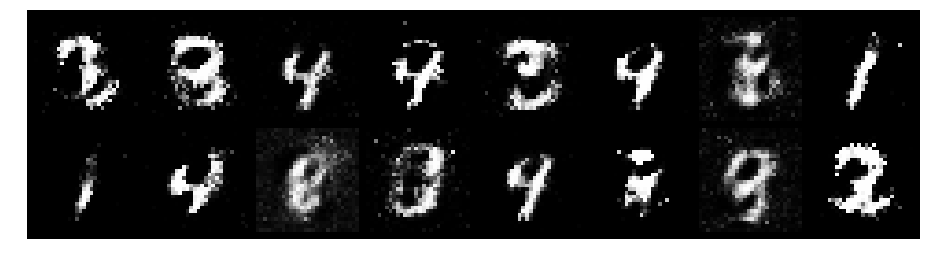

Epoch: [16/200], Batch Num: [100/600]
Discriminator Loss: 0.7885, Generator Loss: 1.6022
D(x): 0.8451, D(G(z)): 0.3663


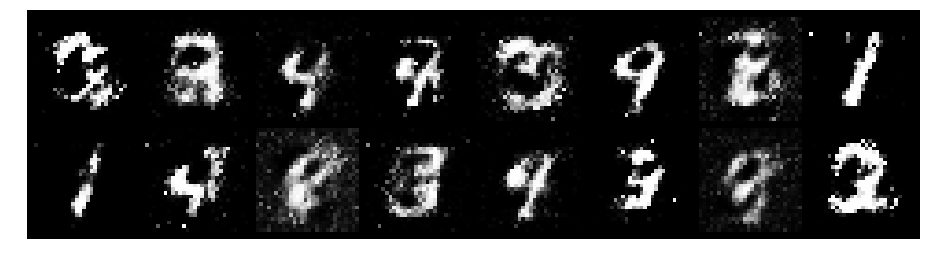

Epoch: [16/200], Batch Num: [200/600]
Discriminator Loss: 0.6399, Generator Loss: 1.8840
D(x): 0.7961, D(G(z)): 0.2437


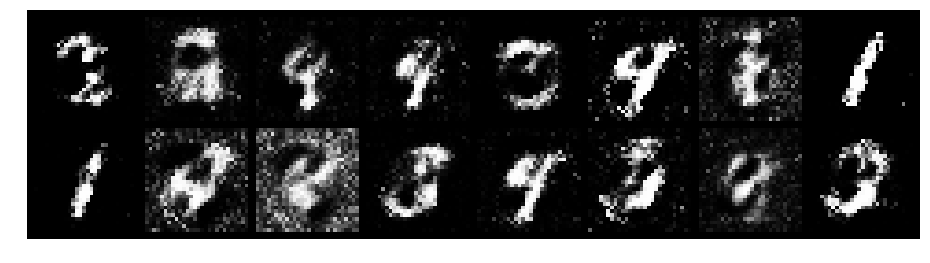

Epoch: [16/200], Batch Num: [300/600]
Discriminator Loss: 0.7781, Generator Loss: 2.4547
D(x): 0.7621, D(G(z)): 0.2235


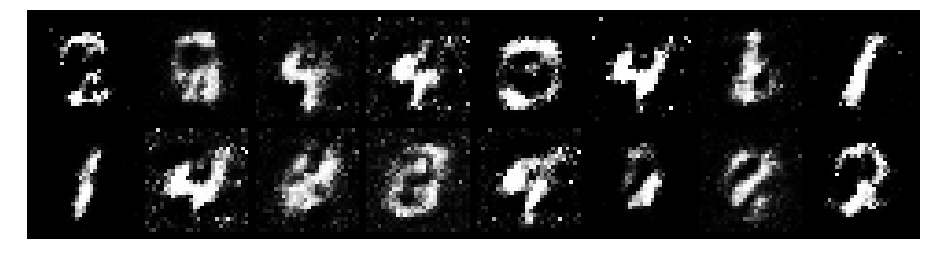

Epoch: [16/200], Batch Num: [400/600]
Discriminator Loss: 1.0242, Generator Loss: 2.2291
D(x): 0.6676, D(G(z)): 0.2399


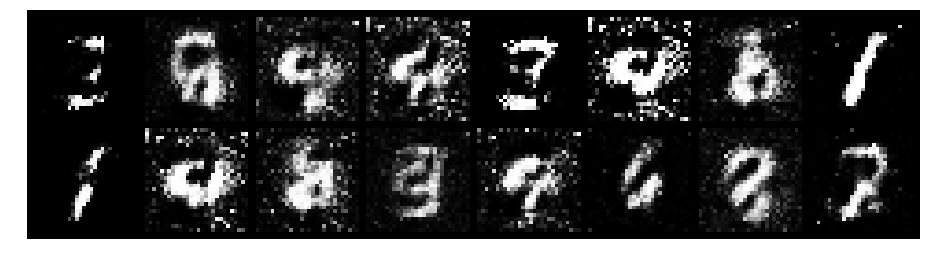

Epoch: [16/200], Batch Num: [500/600]
Discriminator Loss: 0.6437, Generator Loss: 2.0033
D(x): 0.8460, D(G(z)): 0.2949


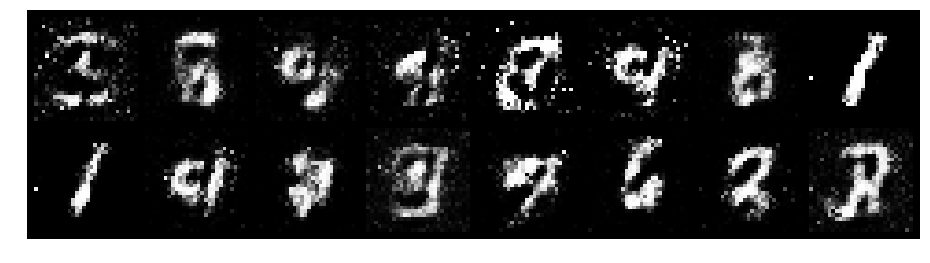

Epoch: [17/200], Batch Num: [0/600]
Discriminator Loss: 1.0280, Generator Loss: 1.4100
D(x): 0.6611, D(G(z)): 0.3270


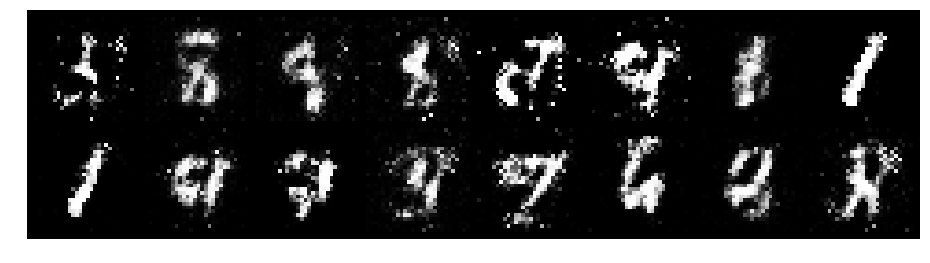

Epoch: [17/200], Batch Num: [100/600]
Discriminator Loss: 0.8667, Generator Loss: 1.6803
D(x): 0.7192, D(G(z)): 0.2735


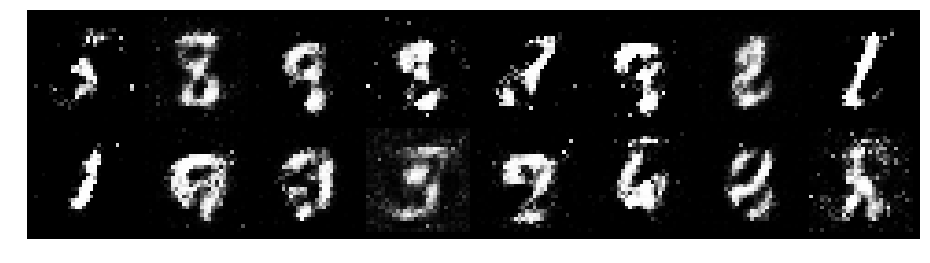

Epoch: [17/200], Batch Num: [200/600]
Discriminator Loss: 0.8814, Generator Loss: 1.8405
D(x): 0.7692, D(G(z)): 0.3173


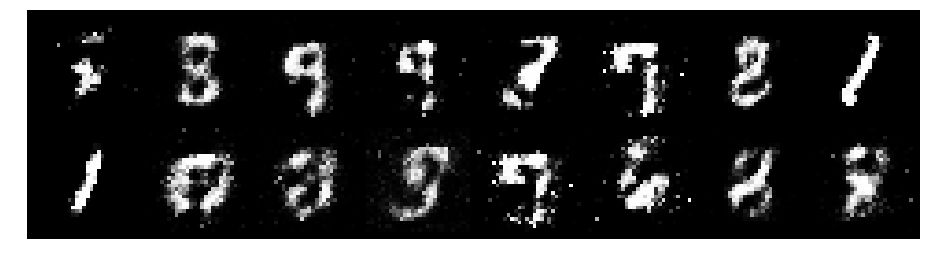

Epoch: [17/200], Batch Num: [300/600]
Discriminator Loss: 0.9029, Generator Loss: 1.4678
D(x): 0.7485, D(G(z)): 0.3904


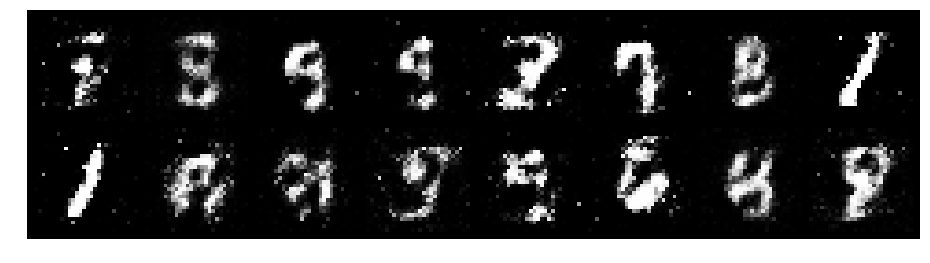

Epoch: [17/200], Batch Num: [400/600]
Discriminator Loss: 1.0079, Generator Loss: 1.1314
D(x): 0.7570, D(G(z)): 0.4188


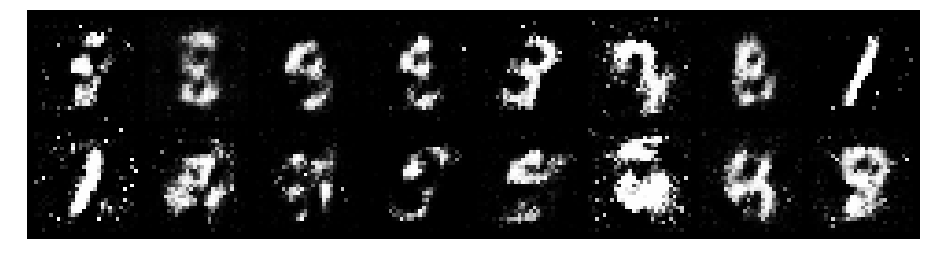

Epoch: [17/200], Batch Num: [500/600]
Discriminator Loss: 1.1584, Generator Loss: 1.7476
D(x): 0.6162, D(G(z)): 0.2731


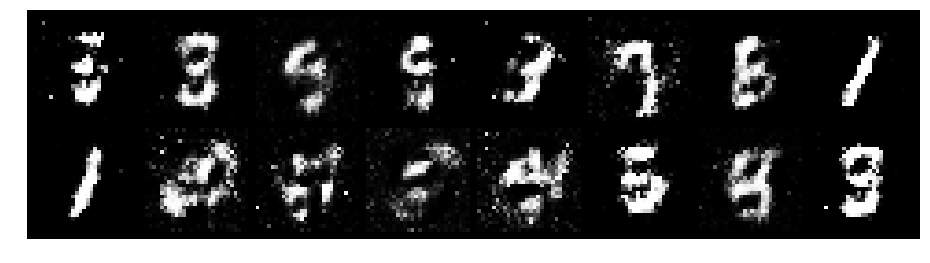

Epoch: [18/200], Batch Num: [0/600]
Discriminator Loss: 0.9534, Generator Loss: 1.9243
D(x): 0.6715, D(G(z)): 0.2829


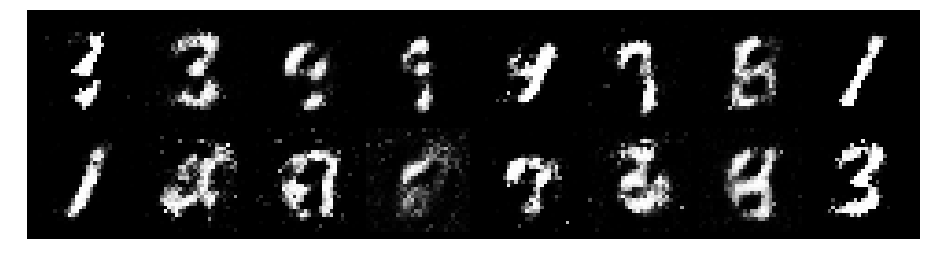

Epoch: [18/200], Batch Num: [100/600]
Discriminator Loss: 1.0753, Generator Loss: 1.6563
D(x): 0.7128, D(G(z)): 0.3533


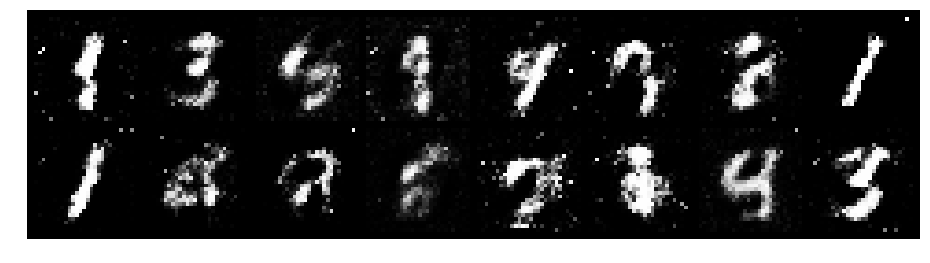

Epoch: [18/200], Batch Num: [200/600]
Discriminator Loss: 1.3240, Generator Loss: 1.6418
D(x): 0.5569, D(G(z)): 0.3051


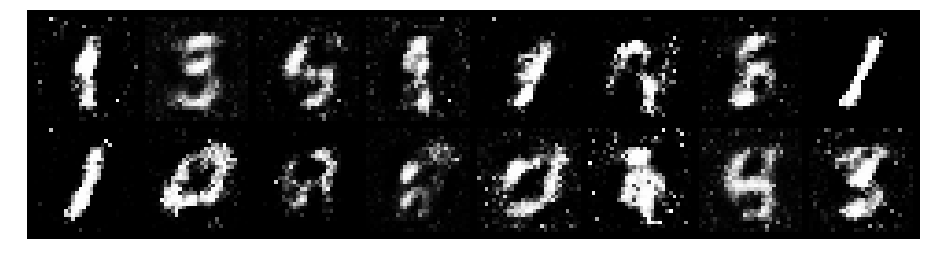

Epoch: [18/200], Batch Num: [300/600]
Discriminator Loss: 0.9482, Generator Loss: 2.1105
D(x): 0.6822, D(G(z)): 0.2647


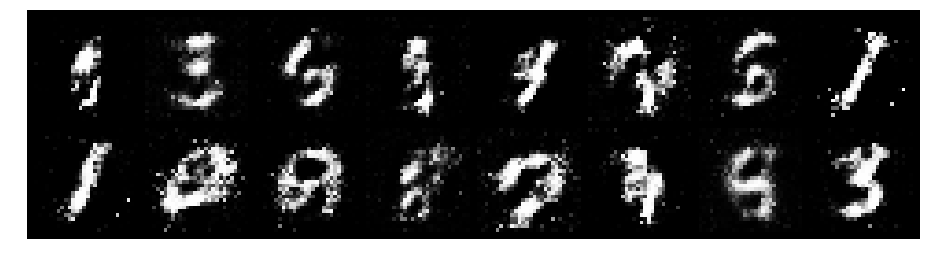

Epoch: [18/200], Batch Num: [400/600]
Discriminator Loss: 0.5872, Generator Loss: 2.0691
D(x): 0.8378, D(G(z)): 0.2326


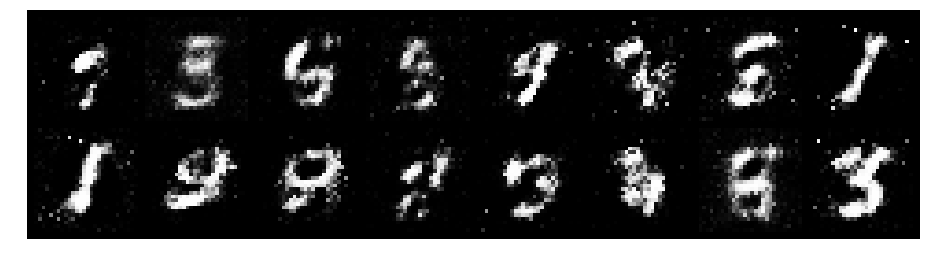

Epoch: [18/200], Batch Num: [500/600]
Discriminator Loss: 0.6099, Generator Loss: 2.4256
D(x): 0.8010, D(G(z)): 0.1976


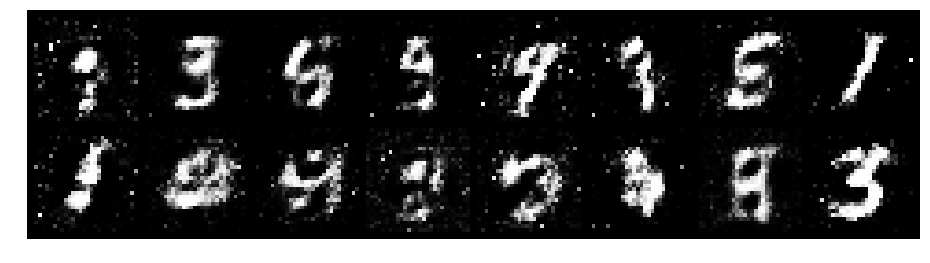

Epoch: [19/200], Batch Num: [0/600]
Discriminator Loss: 0.5509, Generator Loss: 2.4559
D(x): 0.8401, D(G(z)): 0.2091


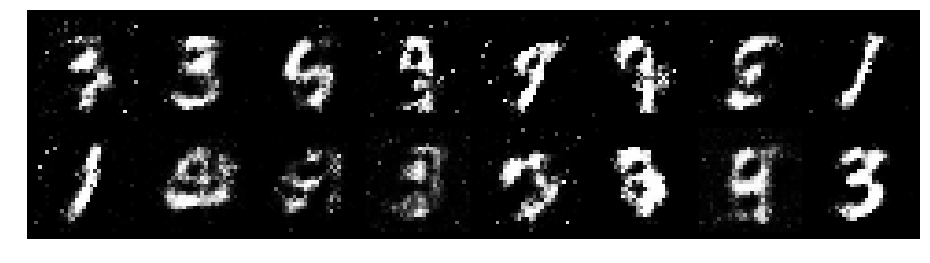

Epoch: [19/200], Batch Num: [100/600]
Discriminator Loss: 0.6588, Generator Loss: 2.3057
D(x): 0.8250, D(G(z)): 0.2632


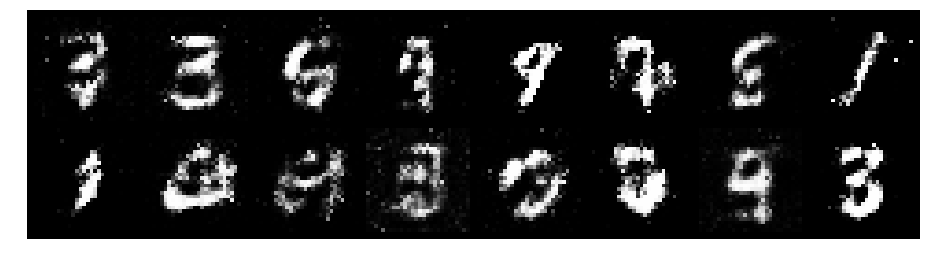

Epoch: [19/200], Batch Num: [200/600]
Discriminator Loss: 0.8447, Generator Loss: 1.8296
D(x): 0.7107, D(G(z)): 0.2720


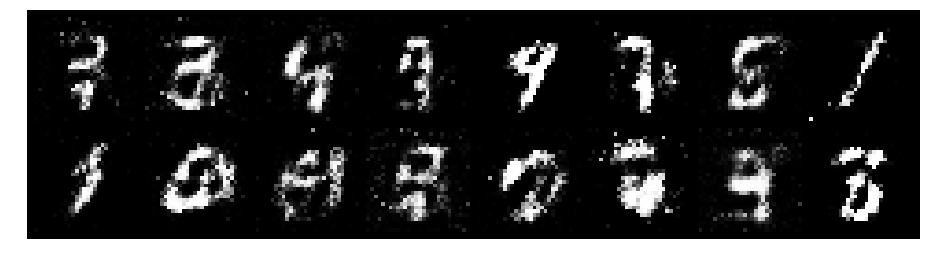

Epoch: [19/200], Batch Num: [300/600]
Discriminator Loss: 0.8750, Generator Loss: 1.4451
D(x): 0.7194, D(G(z)): 0.2867


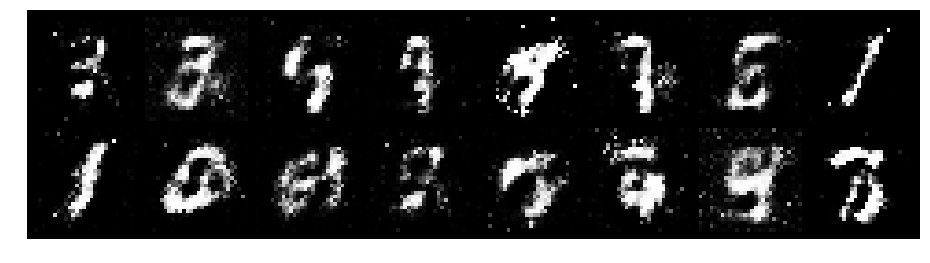

Epoch: [19/200], Batch Num: [400/600]
Discriminator Loss: 0.8013, Generator Loss: 1.4460
D(x): 0.7178, D(G(z)): 0.2662


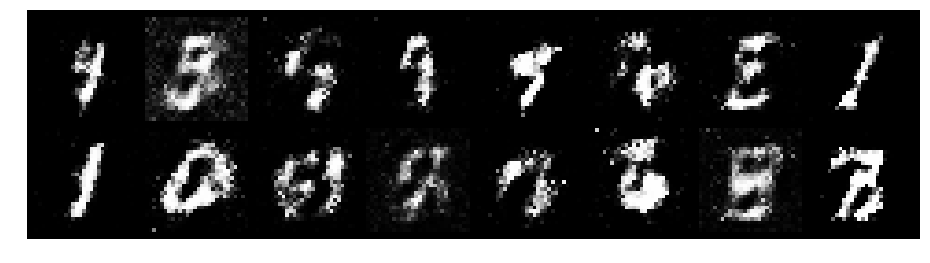

Epoch: [19/200], Batch Num: [500/600]
Discriminator Loss: 1.1287, Generator Loss: 1.4540
D(x): 0.7594, D(G(z)): 0.3655


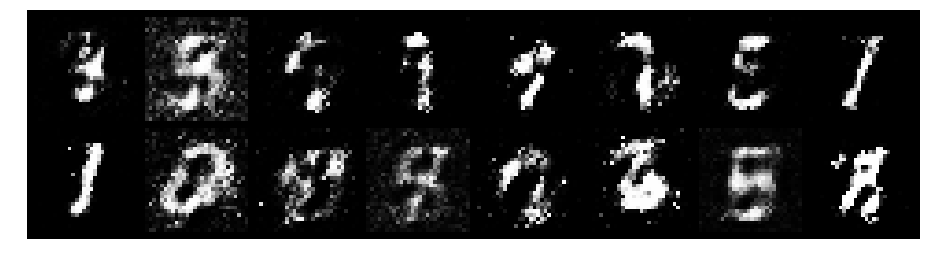

Epoch: [20/200], Batch Num: [0/600]
Discriminator Loss: 1.2211, Generator Loss: 1.3586
D(x): 0.6117, D(G(z)): 0.3126


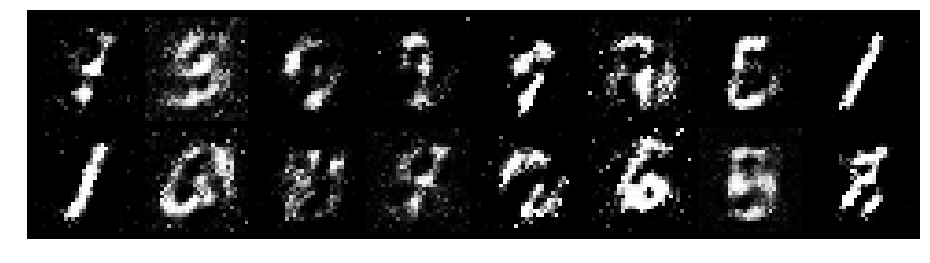

Epoch: [20/200], Batch Num: [100/600]
Discriminator Loss: 0.9904, Generator Loss: 1.3991
D(x): 0.6343, D(G(z)): 0.2734


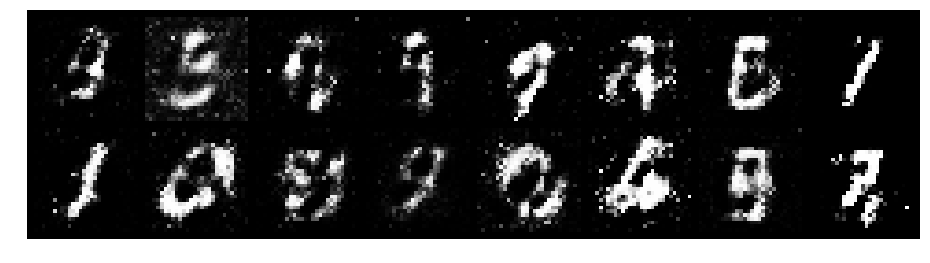

Epoch: [20/200], Batch Num: [200/600]
Discriminator Loss: 0.9229, Generator Loss: 1.3320
D(x): 0.6852, D(G(z)): 0.2975


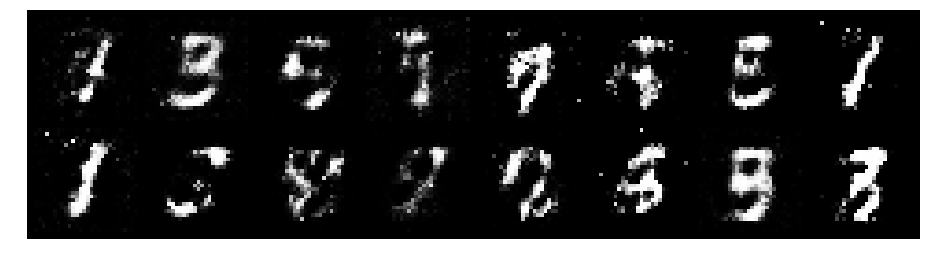

Epoch: [20/200], Batch Num: [300/600]
Discriminator Loss: 1.0543, Generator Loss: 1.6300
D(x): 0.6063, D(G(z)): 0.2537


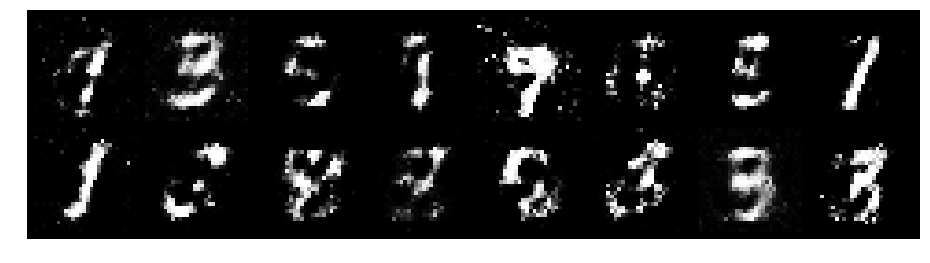

Epoch: [20/200], Batch Num: [400/600]
Discriminator Loss: 0.8653, Generator Loss: 1.8683
D(x): 0.7166, D(G(z)): 0.2680


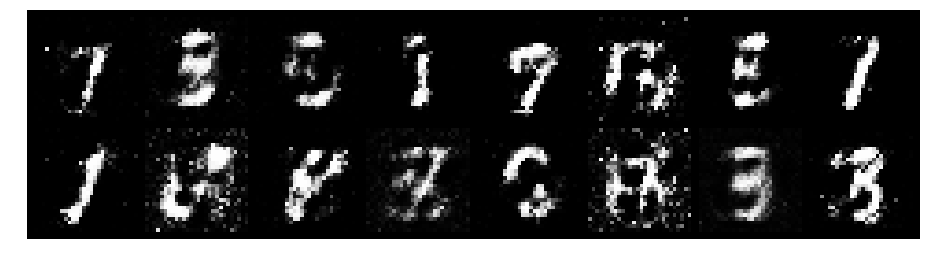

Epoch: [20/200], Batch Num: [500/600]
Discriminator Loss: 0.8653, Generator Loss: 1.7339
D(x): 0.6958, D(G(z)): 0.2714


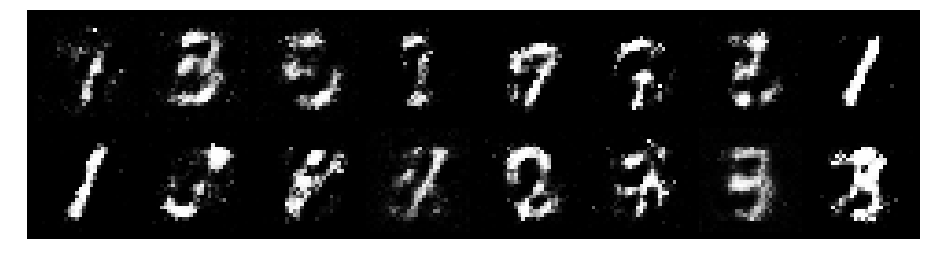

Epoch: [21/200], Batch Num: [0/600]
Discriminator Loss: 0.8579, Generator Loss: 1.3795
D(x): 0.7573, D(G(z)): 0.3194


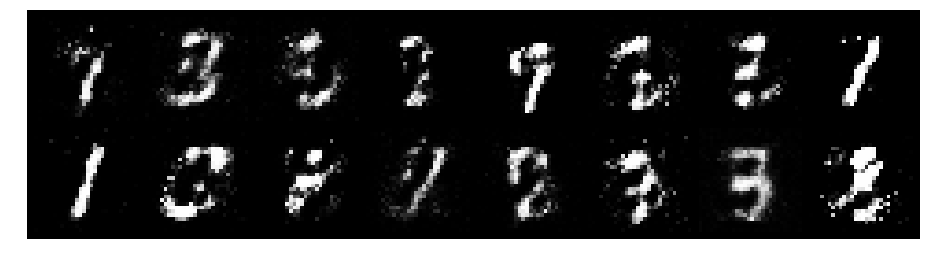

Epoch: [21/200], Batch Num: [100/600]
Discriminator Loss: 0.8142, Generator Loss: 1.8086
D(x): 0.7717, D(G(z)): 0.3217


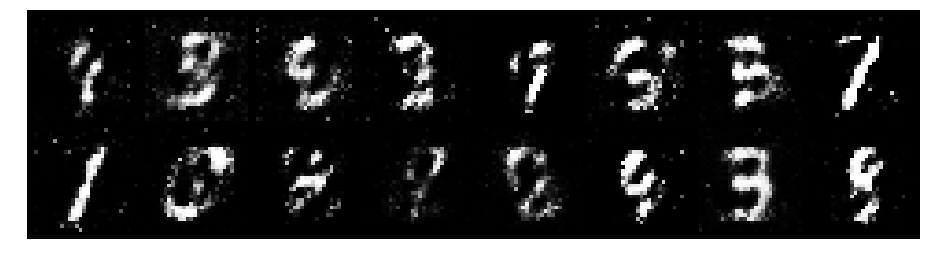

Epoch: [21/200], Batch Num: [200/600]
Discriminator Loss: 0.8039, Generator Loss: 1.4121
D(x): 0.7190, D(G(z)): 0.2943


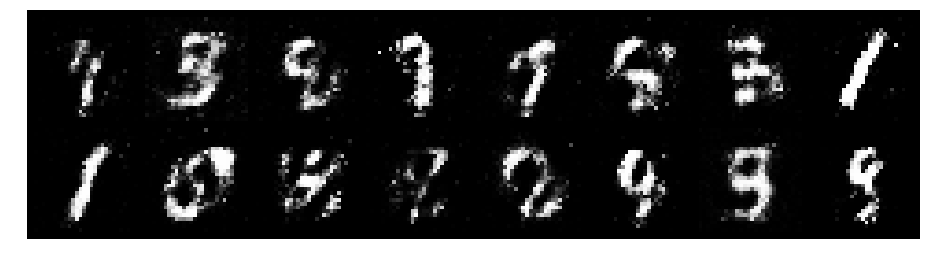

Epoch: [21/200], Batch Num: [300/600]
Discriminator Loss: 0.8475, Generator Loss: 1.8406
D(x): 0.7112, D(G(z)): 0.2729


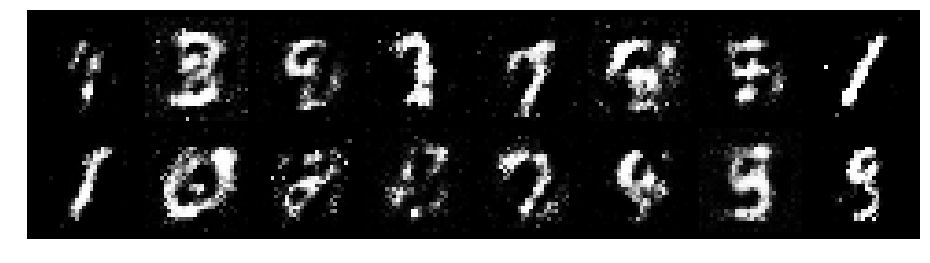

Epoch: [21/200], Batch Num: [400/600]
Discriminator Loss: 0.7630, Generator Loss: 1.7747
D(x): 0.7417, D(G(z)): 0.2563


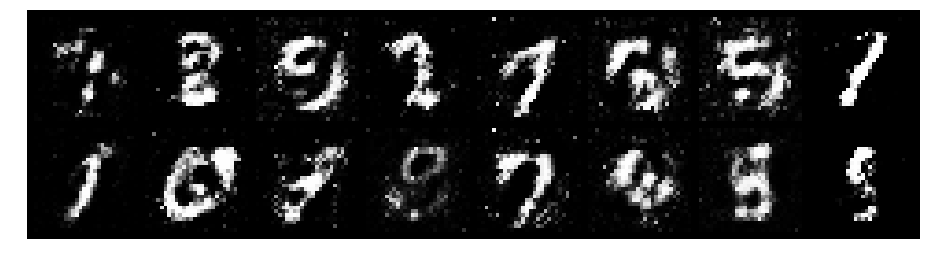

Epoch: [21/200], Batch Num: [500/600]
Discriminator Loss: 0.7433, Generator Loss: 1.6228
D(x): 0.7568, D(G(z)): 0.2656


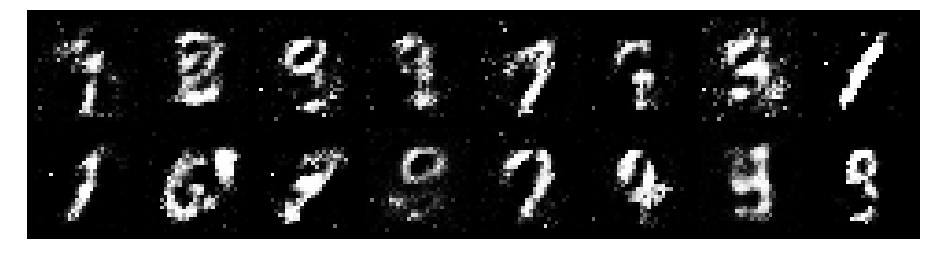

Epoch: [22/200], Batch Num: [0/600]
Discriminator Loss: 0.8026, Generator Loss: 1.4876
D(x): 0.7134, D(G(z)): 0.2530


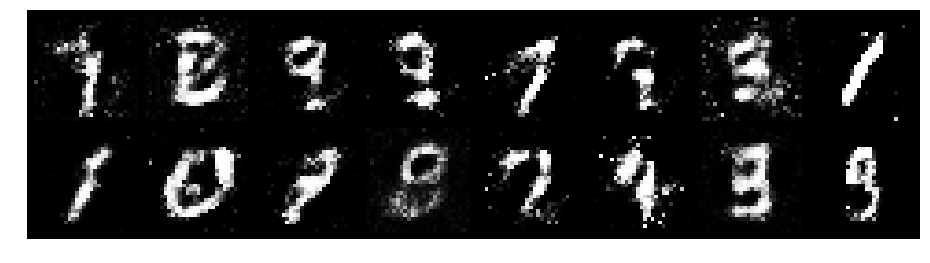

Epoch: [22/200], Batch Num: [100/600]
Discriminator Loss: 0.9979, Generator Loss: 1.8071
D(x): 0.6404, D(G(z)): 0.2683


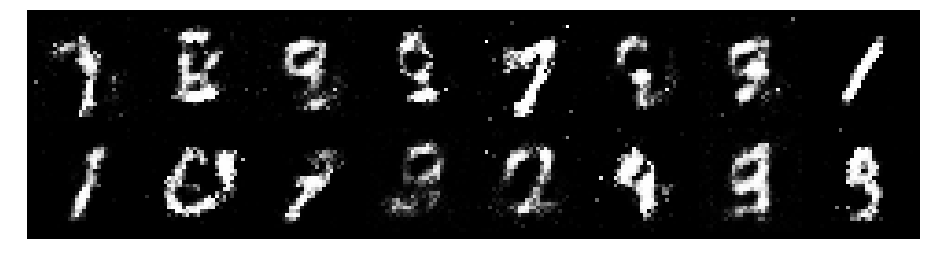

Epoch: [22/200], Batch Num: [200/600]
Discriminator Loss: 0.7362, Generator Loss: 1.7786
D(x): 0.7997, D(G(z)): 0.2896


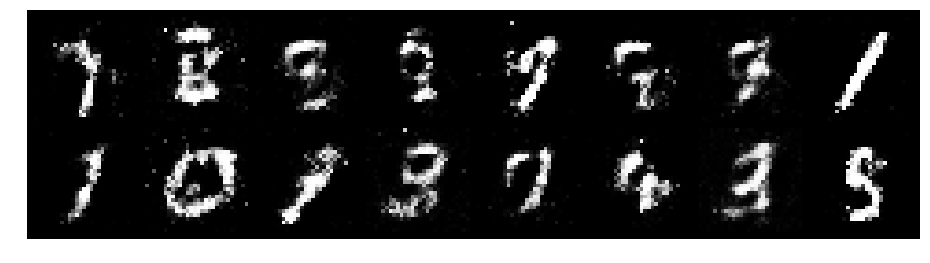

Epoch: [22/200], Batch Num: [300/600]
Discriminator Loss: 0.7783, Generator Loss: 1.7036
D(x): 0.7796, D(G(z)): 0.3082


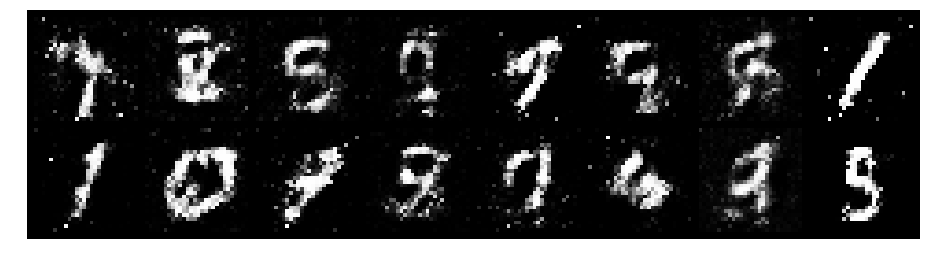

Epoch: [22/200], Batch Num: [400/600]
Discriminator Loss: 0.9560, Generator Loss: 1.8151
D(x): 0.6728, D(G(z)): 0.2852


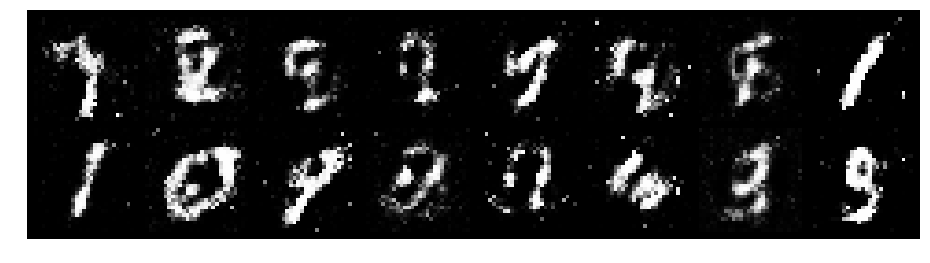

Epoch: [22/200], Batch Num: [500/600]
Discriminator Loss: 1.1341, Generator Loss: 1.0102
D(x): 0.5798, D(G(z)): 0.3479


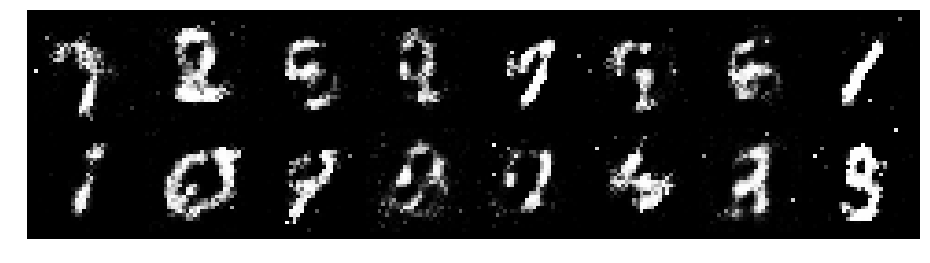

Epoch: [23/200], Batch Num: [0/600]
Discriminator Loss: 1.1544, Generator Loss: 1.1073
D(x): 0.6618, D(G(z)): 0.4283


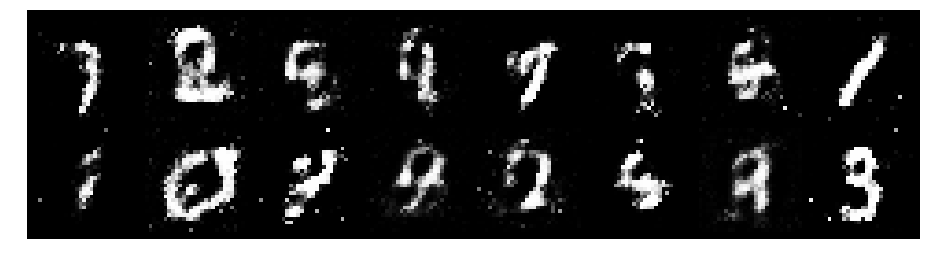

Epoch: [23/200], Batch Num: [100/600]
Discriminator Loss: 1.2260, Generator Loss: 1.2191
D(x): 0.6184, D(G(z)): 0.3777


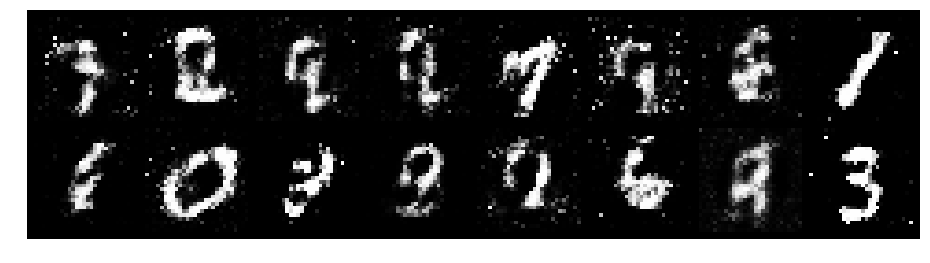

Epoch: [23/200], Batch Num: [200/600]
Discriminator Loss: 0.9729, Generator Loss: 1.2458
D(x): 0.7032, D(G(z)): 0.3393


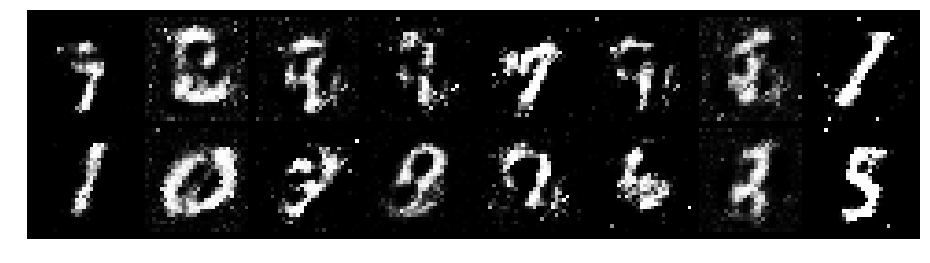

Epoch: [23/200], Batch Num: [300/600]
Discriminator Loss: 0.9912, Generator Loss: 1.8217
D(x): 0.6778, D(G(z)): 0.2859


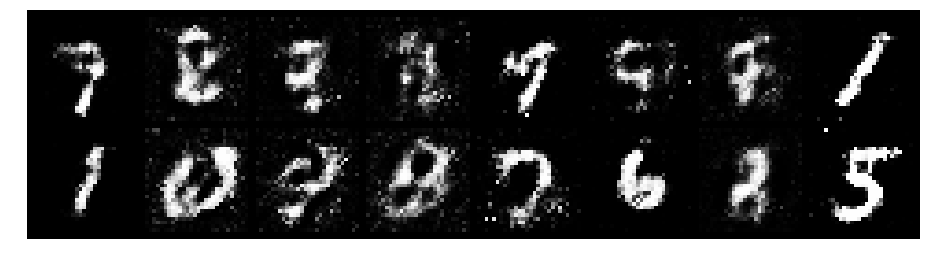

Epoch: [23/200], Batch Num: [400/600]
Discriminator Loss: 1.1013, Generator Loss: 1.6087
D(x): 0.6102, D(G(z)): 0.2731


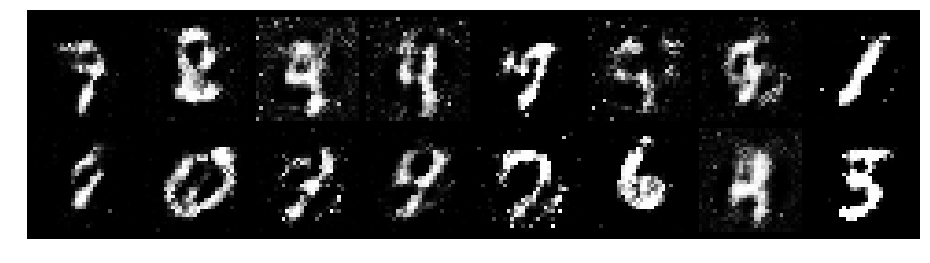

Epoch: [23/200], Batch Num: [500/600]
Discriminator Loss: 0.9492, Generator Loss: 1.8074
D(x): 0.6441, D(G(z)): 0.2612


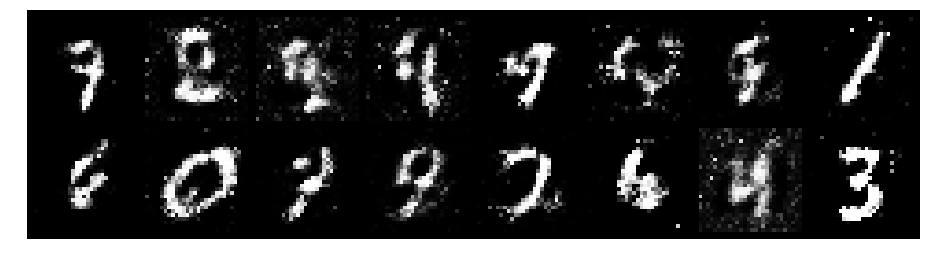

Epoch: [24/200], Batch Num: [0/600]
Discriminator Loss: 0.7431, Generator Loss: 1.4418
D(x): 0.7600, D(G(z)): 0.3016


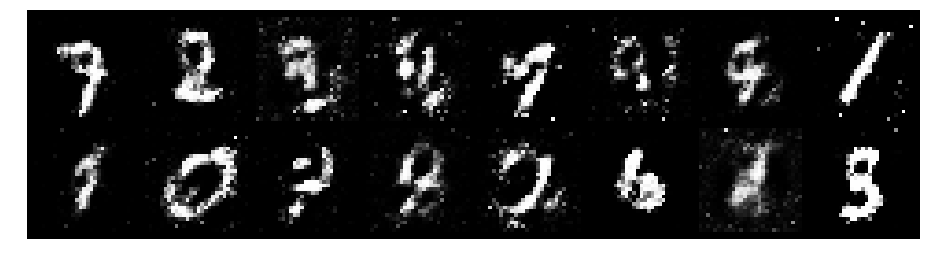

Epoch: [24/200], Batch Num: [100/600]
Discriminator Loss: 0.5792, Generator Loss: 1.9639
D(x): 0.7649, D(G(z)): 0.1909


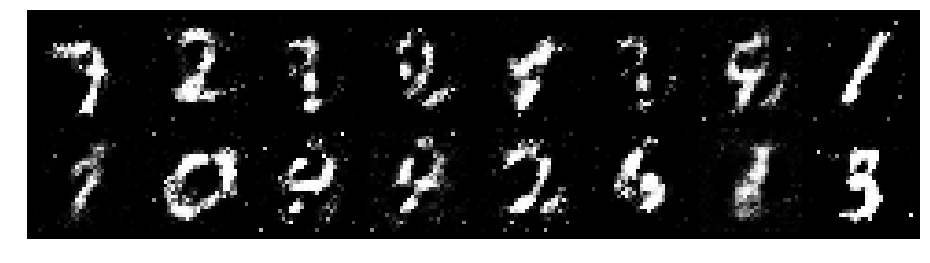

Epoch: [24/200], Batch Num: [200/600]
Discriminator Loss: 0.9478, Generator Loss: 1.2162
D(x): 0.6866, D(G(z)): 0.3595


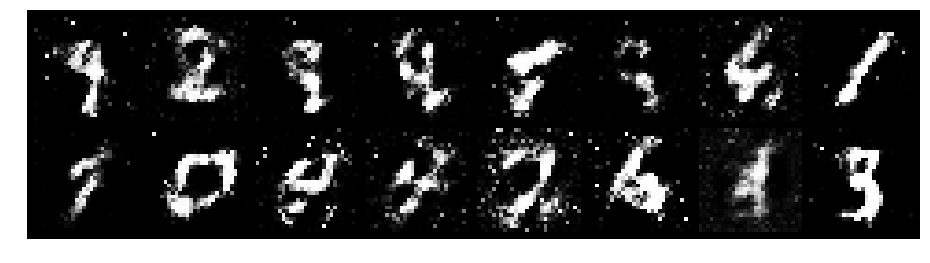

Epoch: [24/200], Batch Num: [300/600]
Discriminator Loss: 1.0995, Generator Loss: 1.4867
D(x): 0.5552, D(G(z)): 0.2762


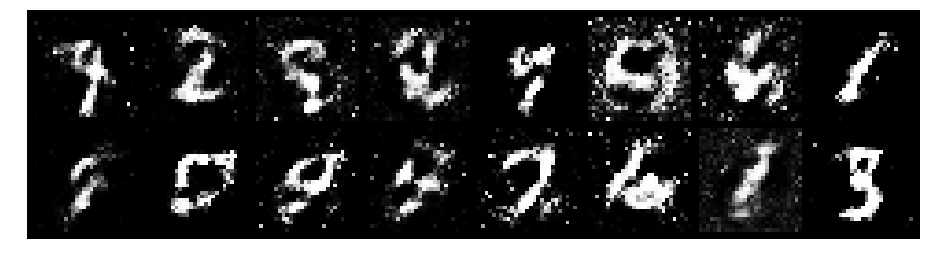

Epoch: [24/200], Batch Num: [400/600]
Discriminator Loss: 1.1238, Generator Loss: 1.4320
D(x): 0.6157, D(G(z)): 0.3461


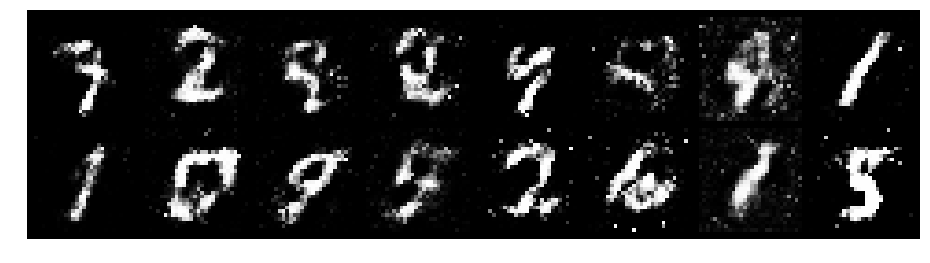

Epoch: [24/200], Batch Num: [500/600]
Discriminator Loss: 1.1264, Generator Loss: 1.1864
D(x): 0.6246, D(G(z)): 0.3728


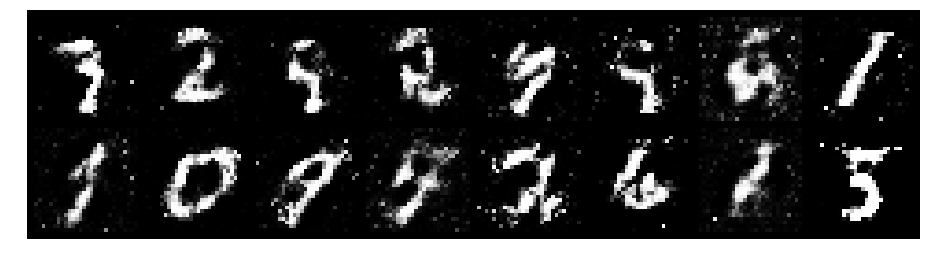

Epoch: [25/200], Batch Num: [0/600]
Discriminator Loss: 1.1367, Generator Loss: 1.1354
D(x): 0.6502, D(G(z)): 0.3679


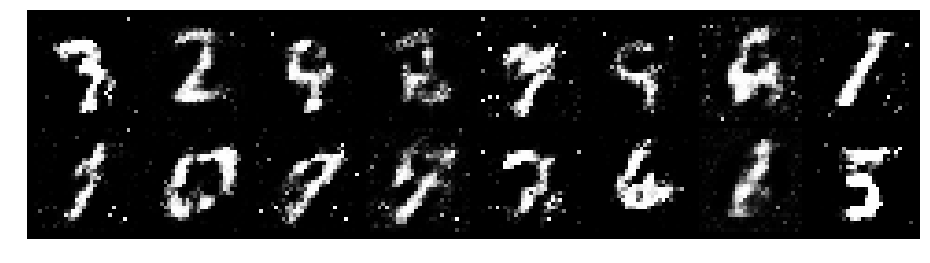

Epoch: [25/200], Batch Num: [100/600]
Discriminator Loss: 0.8695, Generator Loss: 1.6473
D(x): 0.6922, D(G(z)): 0.3087


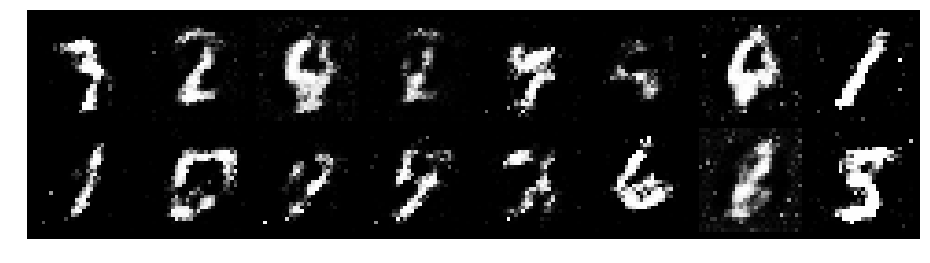

Epoch: [25/200], Batch Num: [200/600]
Discriminator Loss: 0.9240, Generator Loss: 1.5883
D(x): 0.7124, D(G(z)): 0.3020


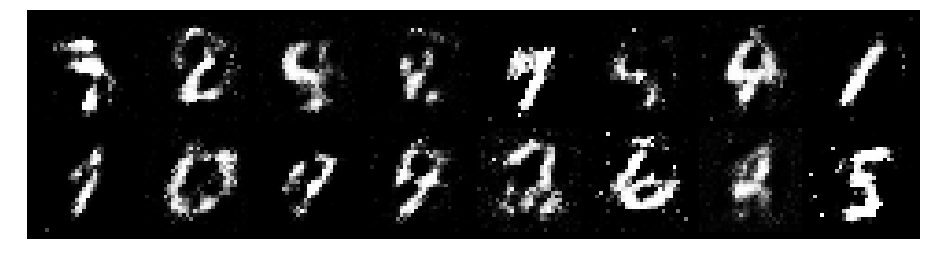

Epoch: [25/200], Batch Num: [300/600]
Discriminator Loss: 1.0241, Generator Loss: 1.4131
D(x): 0.6582, D(G(z)): 0.3444


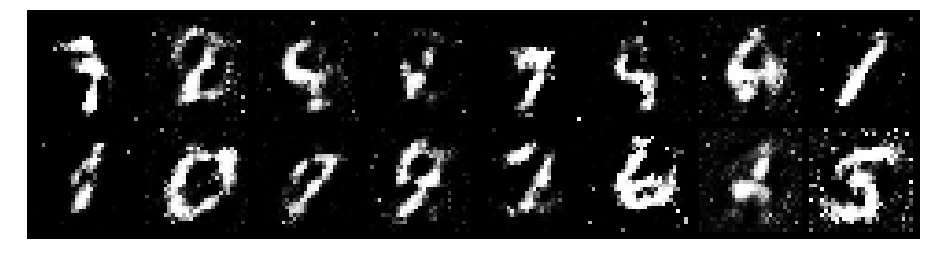

Epoch: [25/200], Batch Num: [400/600]
Discriminator Loss: 1.0085, Generator Loss: 1.5414
D(x): 0.6904, D(G(z)): 0.3220


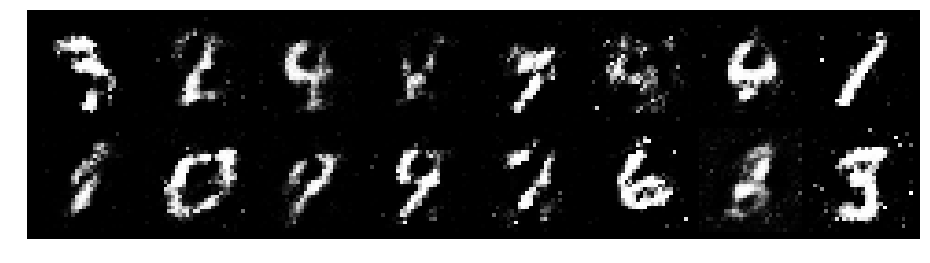

Epoch: [25/200], Batch Num: [500/600]
Discriminator Loss: 1.0857, Generator Loss: 1.1897
D(x): 0.6527, D(G(z)): 0.3679


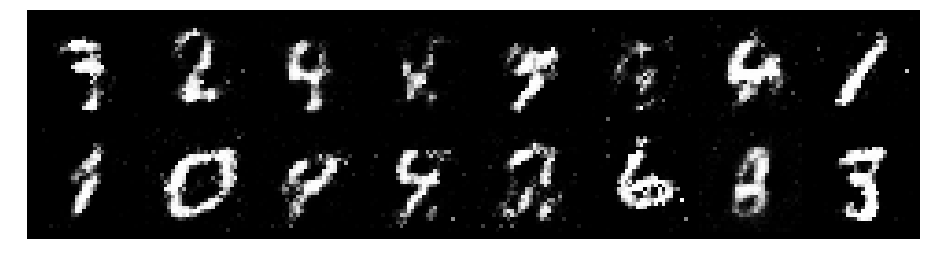

Epoch: [26/200], Batch Num: [0/600]
Discriminator Loss: 1.1355, Generator Loss: 1.4383
D(x): 0.5716, D(G(z)): 0.2550


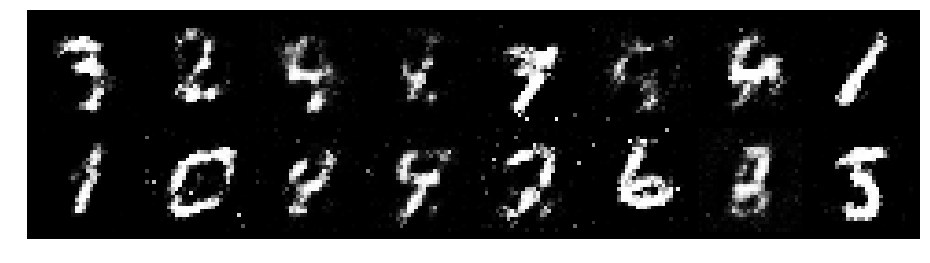

Epoch: [26/200], Batch Num: [100/600]
Discriminator Loss: 0.9423, Generator Loss: 1.4850
D(x): 0.6908, D(G(z)): 0.3128


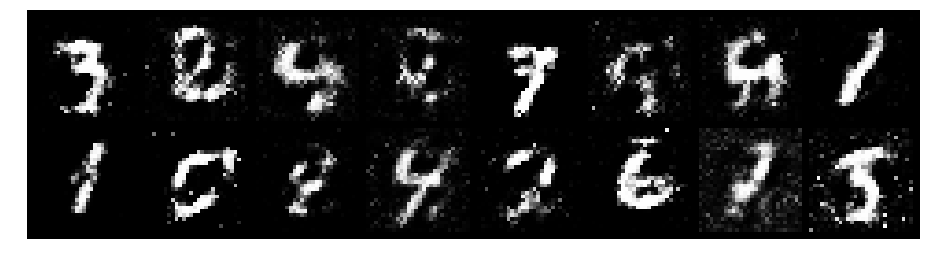

Epoch: [26/200], Batch Num: [200/600]
Discriminator Loss: 0.8525, Generator Loss: 1.5078
D(x): 0.7409, D(G(z)): 0.3240


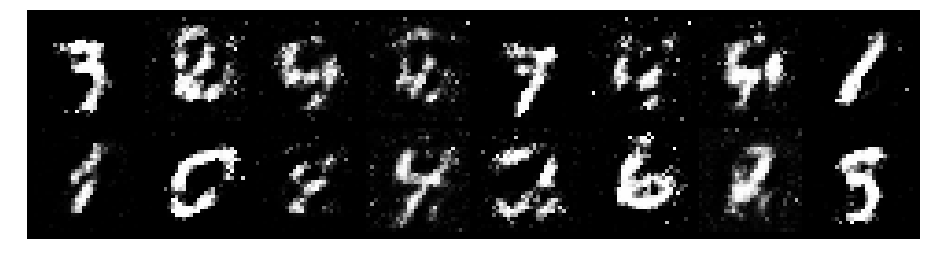

Epoch: [26/200], Batch Num: [300/600]
Discriminator Loss: 1.0261, Generator Loss: 1.3033
D(x): 0.6961, D(G(z)): 0.3422


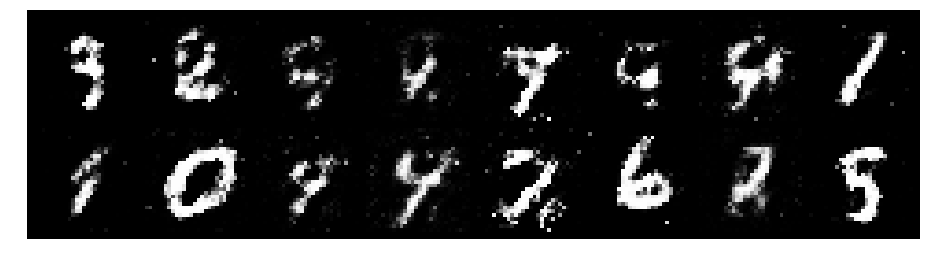

Epoch: [26/200], Batch Num: [400/600]
Discriminator Loss: 0.9543, Generator Loss: 1.3532
D(x): 0.6708, D(G(z)): 0.3166


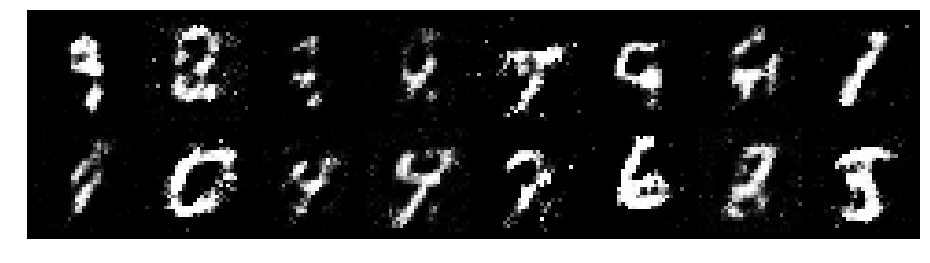

Epoch: [26/200], Batch Num: [500/600]
Discriminator Loss: 1.1910, Generator Loss: 1.1536
D(x): 0.5741, D(G(z)): 0.3752


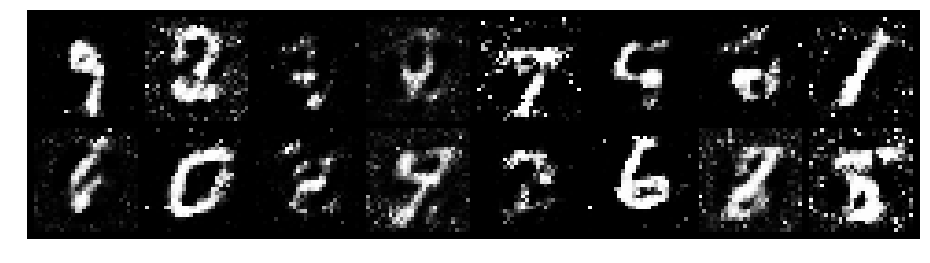

Epoch: [27/200], Batch Num: [0/600]
Discriminator Loss: 1.1846, Generator Loss: 1.5202
D(x): 0.6708, D(G(z)): 0.3862


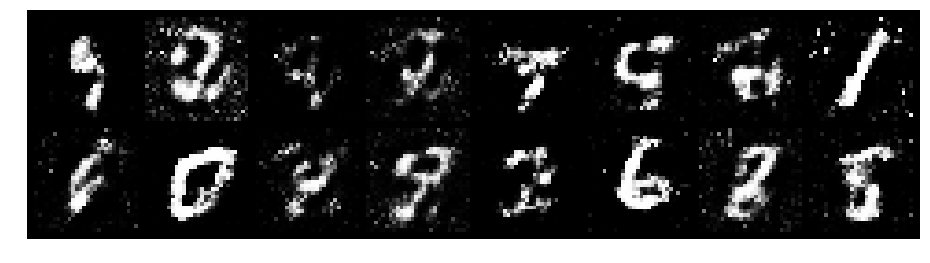

Epoch: [27/200], Batch Num: [100/600]
Discriminator Loss: 1.1525, Generator Loss: 1.2971
D(x): 0.6386, D(G(z)): 0.3804


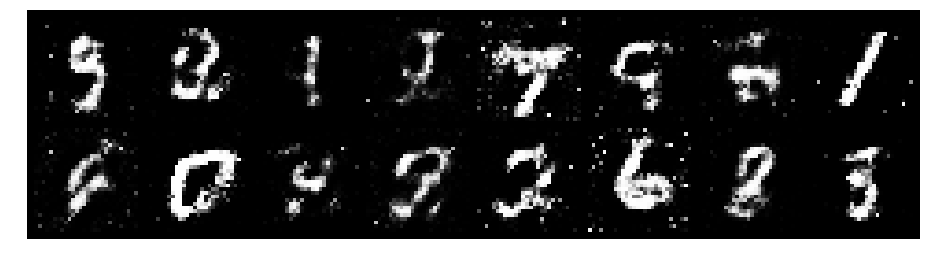

Epoch: [27/200], Batch Num: [200/600]
Discriminator Loss: 1.2562, Generator Loss: 1.3083
D(x): 0.6084, D(G(z)): 0.4023


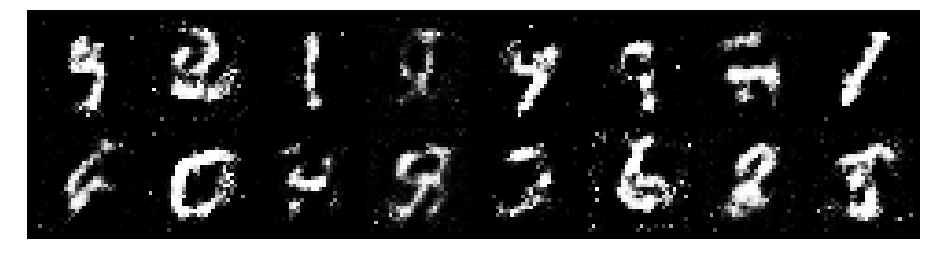

Epoch: [27/200], Batch Num: [300/600]
Discriminator Loss: 1.2086, Generator Loss: 1.1170
D(x): 0.6948, D(G(z)): 0.4587


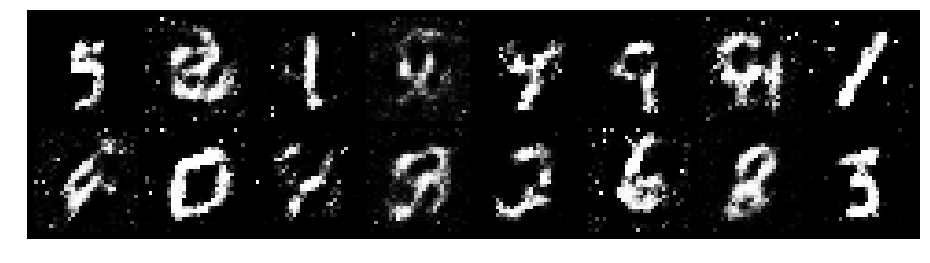

Epoch: [27/200], Batch Num: [400/600]
Discriminator Loss: 1.2647, Generator Loss: 1.0865
D(x): 0.6375, D(G(z)): 0.3942


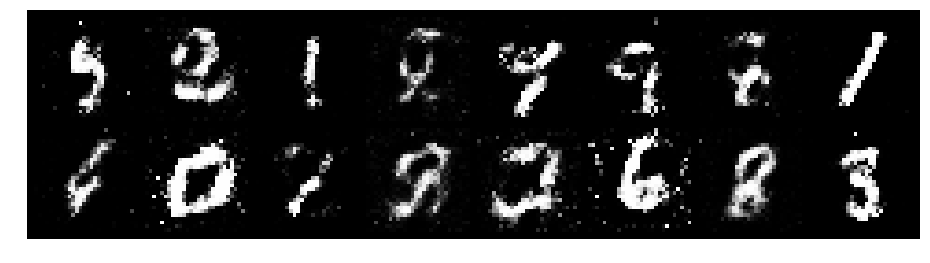

Epoch: [27/200], Batch Num: [500/600]
Discriminator Loss: 0.8805, Generator Loss: 1.5657
D(x): 0.6643, D(G(z)): 0.2670


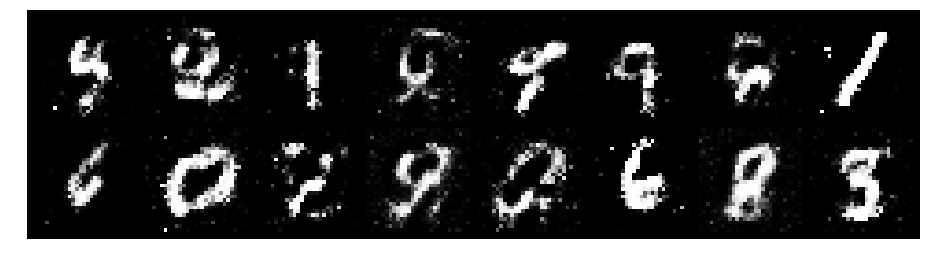

Epoch: [28/200], Batch Num: [0/600]
Discriminator Loss: 0.8949, Generator Loss: 1.5868
D(x): 0.6695, D(G(z)): 0.2902


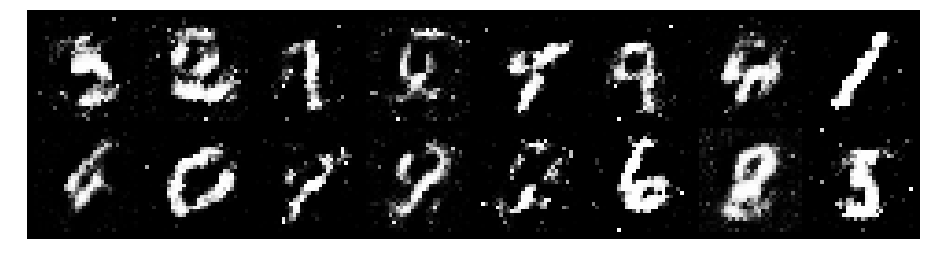

Epoch: [28/200], Batch Num: [100/600]
Discriminator Loss: 0.8581, Generator Loss: 1.4545
D(x): 0.6722, D(G(z)): 0.2879


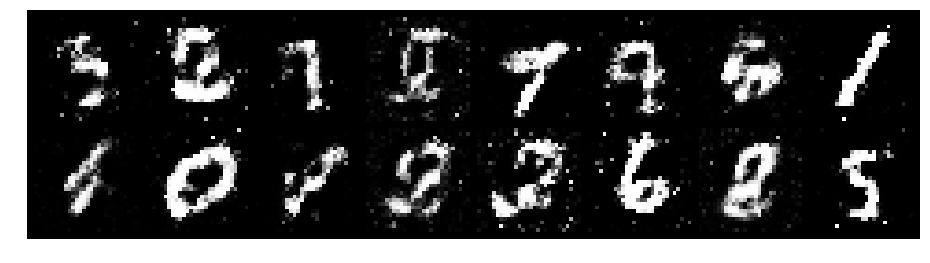

Epoch: [28/200], Batch Num: [200/600]
Discriminator Loss: 0.9555, Generator Loss: 1.1894
D(x): 0.6776, D(G(z)): 0.3337


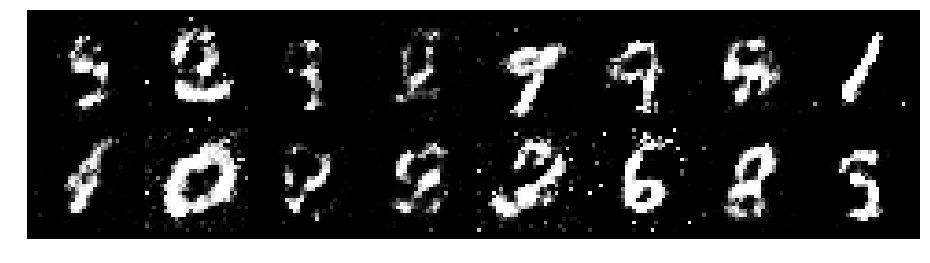

Epoch: [28/200], Batch Num: [300/600]
Discriminator Loss: 0.8865, Generator Loss: 1.6801
D(x): 0.7427, D(G(z)): 0.3145


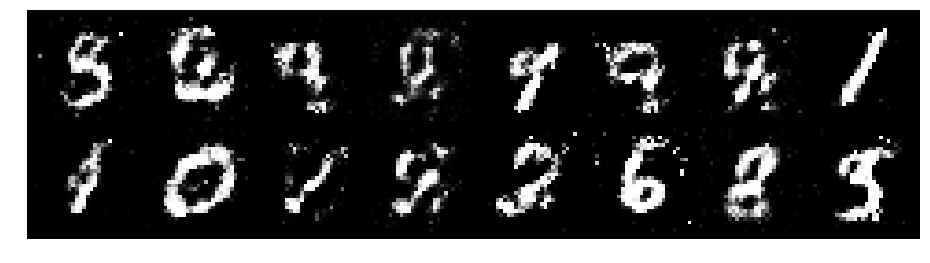

Epoch: [28/200], Batch Num: [400/600]
Discriminator Loss: 0.9325, Generator Loss: 1.3653
D(x): 0.7000, D(G(z)): 0.3551


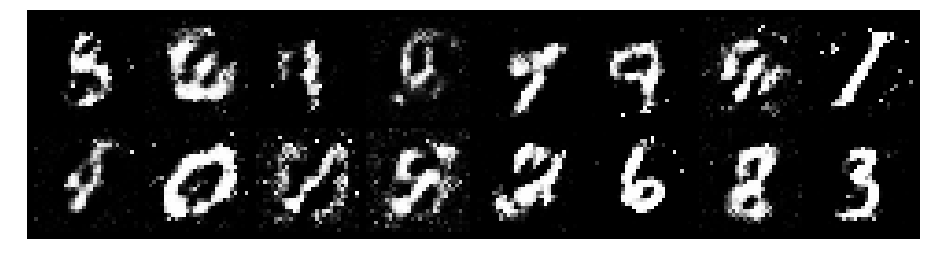

Epoch: [28/200], Batch Num: [500/600]
Discriminator Loss: 0.9701, Generator Loss: 1.3641
D(x): 0.6200, D(G(z)): 0.2958


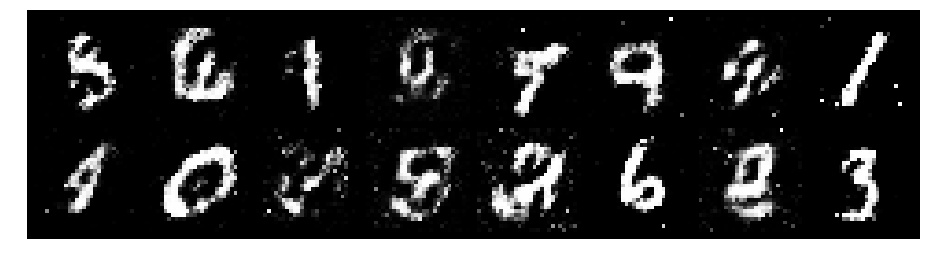

Epoch: [29/200], Batch Num: [0/600]
Discriminator Loss: 0.7894, Generator Loss: 1.6899
D(x): 0.7585, D(G(z)): 0.3117


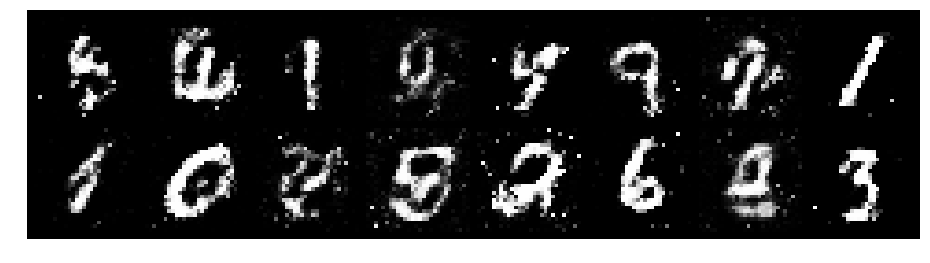

Epoch: [29/200], Batch Num: [100/600]
Discriminator Loss: 0.8859, Generator Loss: 1.7575
D(x): 0.7088, D(G(z)): 0.3038


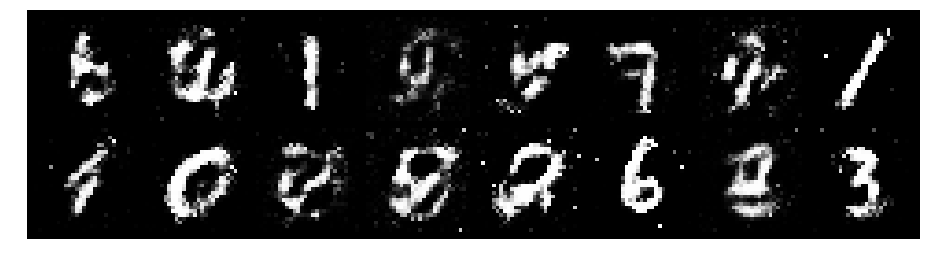

Epoch: [29/200], Batch Num: [200/600]
Discriminator Loss: 0.9713, Generator Loss: 1.4254
D(x): 0.6811, D(G(z)): 0.3481


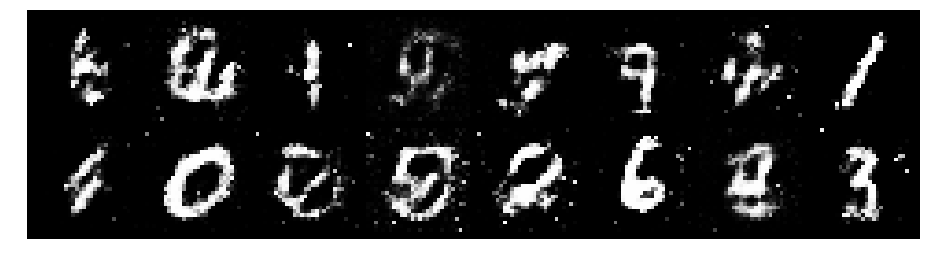

Epoch: [29/200], Batch Num: [300/600]
Discriminator Loss: 0.9242, Generator Loss: 1.6970
D(x): 0.7145, D(G(z)): 0.3518


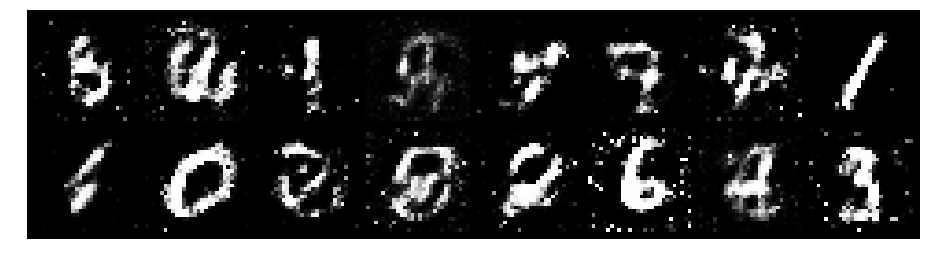

Epoch: [29/200], Batch Num: [400/600]
Discriminator Loss: 1.0908, Generator Loss: 1.3205
D(x): 0.6895, D(G(z)): 0.4216


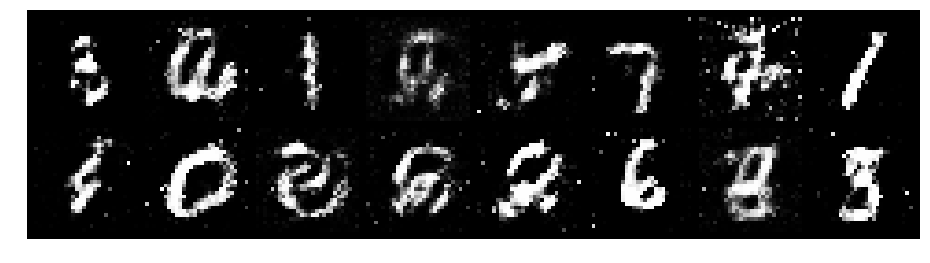

Epoch: [29/200], Batch Num: [500/600]
Discriminator Loss: 0.9563, Generator Loss: 1.5459
D(x): 0.6742, D(G(z)): 0.3292


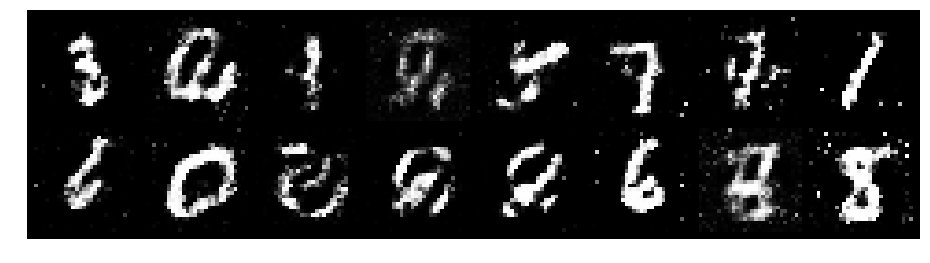

Epoch: [30/200], Batch Num: [0/600]
Discriminator Loss: 1.0129, Generator Loss: 1.1887
D(x): 0.6993, D(G(z)): 0.3918


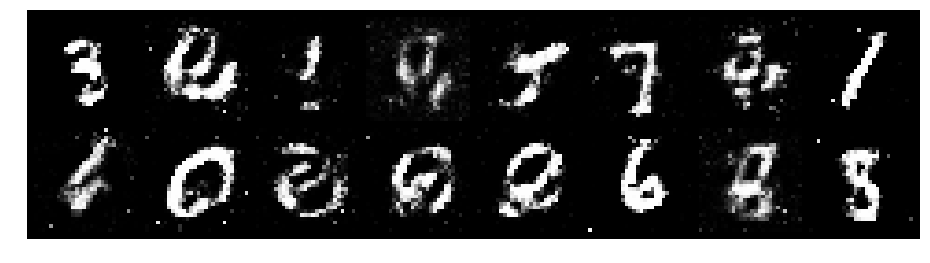

Epoch: [30/200], Batch Num: [100/600]
Discriminator Loss: 0.9505, Generator Loss: 1.4770
D(x): 0.6466, D(G(z)): 0.3048


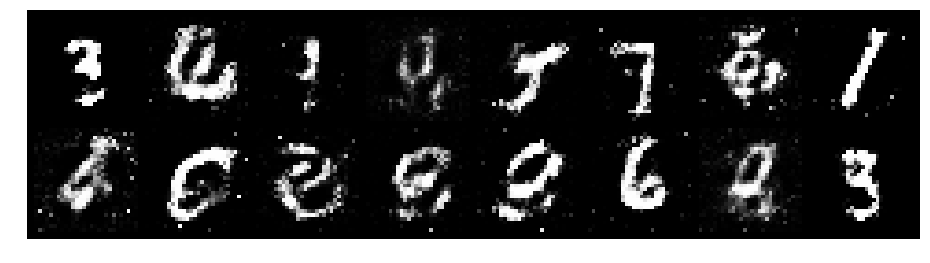

Epoch: [30/200], Batch Num: [200/600]
Discriminator Loss: 1.0400, Generator Loss: 1.1966
D(x): 0.7150, D(G(z)): 0.4049


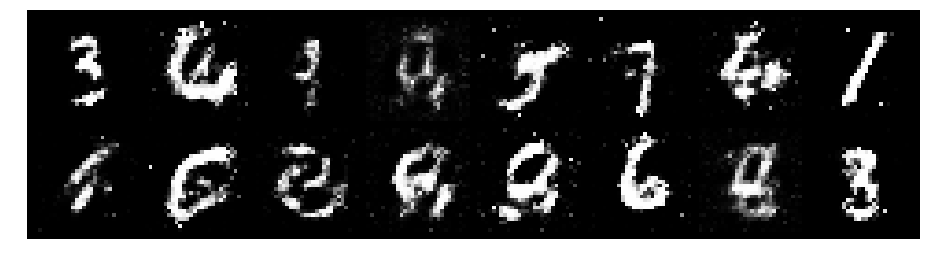

Epoch: [30/200], Batch Num: [300/600]
Discriminator Loss: 1.0993, Generator Loss: 1.3560
D(x): 0.6145, D(G(z)): 0.3545


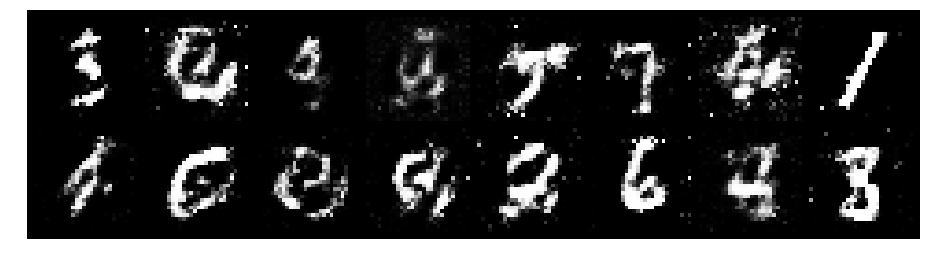

Epoch: [30/200], Batch Num: [400/600]
Discriminator Loss: 0.8941, Generator Loss: 1.4351
D(x): 0.6814, D(G(z)): 0.3148


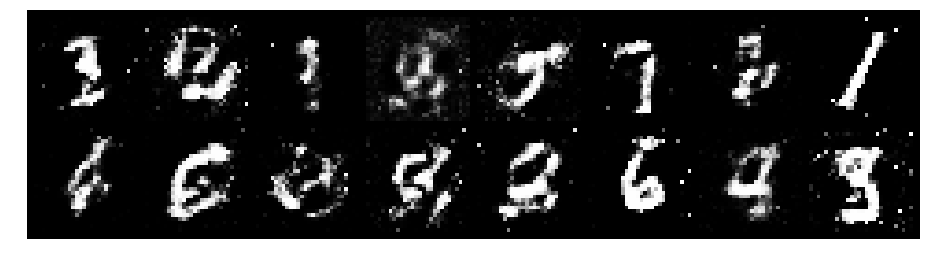

Epoch: [30/200], Batch Num: [500/600]
Discriminator Loss: 0.9862, Generator Loss: 1.5434
D(x): 0.6985, D(G(z)): 0.3585


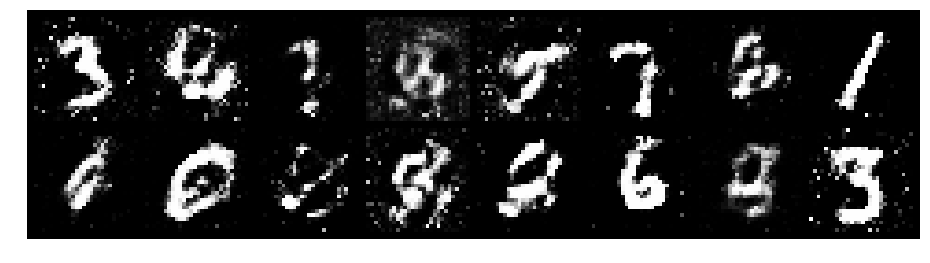

Epoch: [31/200], Batch Num: [0/600]
Discriminator Loss: 1.2813, Generator Loss: 1.2161
D(x): 0.5776, D(G(z)): 0.4062


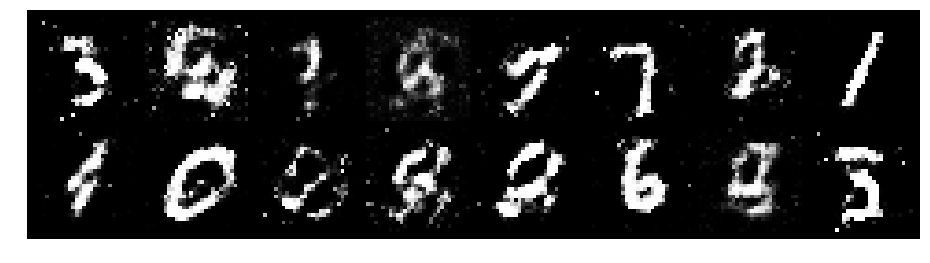

Epoch: [31/200], Batch Num: [100/600]
Discriminator Loss: 1.1760, Generator Loss: 1.0573
D(x): 0.6158, D(G(z)): 0.3996


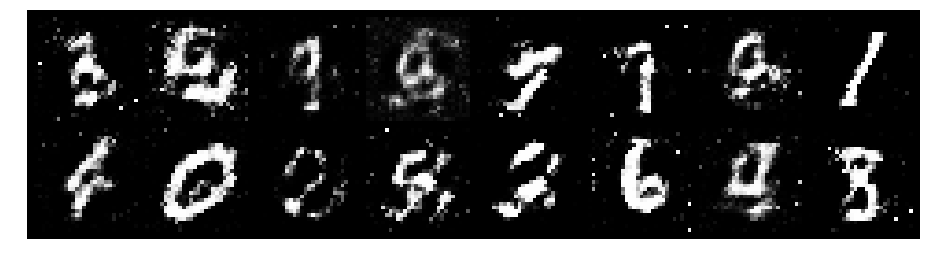

Epoch: [31/200], Batch Num: [200/600]
Discriminator Loss: 1.0930, Generator Loss: 1.3771
D(x): 0.6314, D(G(z)): 0.3672


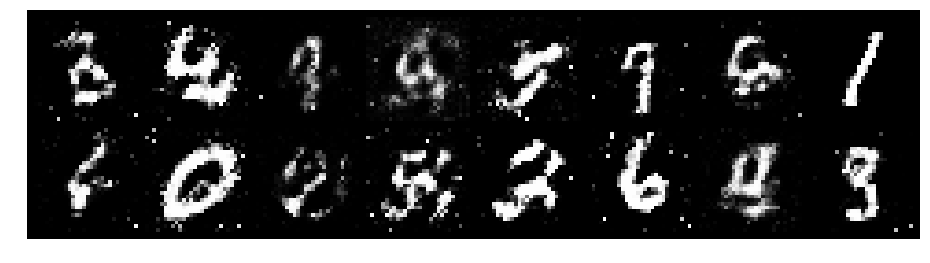

Epoch: [31/200], Batch Num: [300/600]
Discriminator Loss: 1.1310, Generator Loss: 1.3280
D(x): 0.5879, D(G(z)): 0.3533


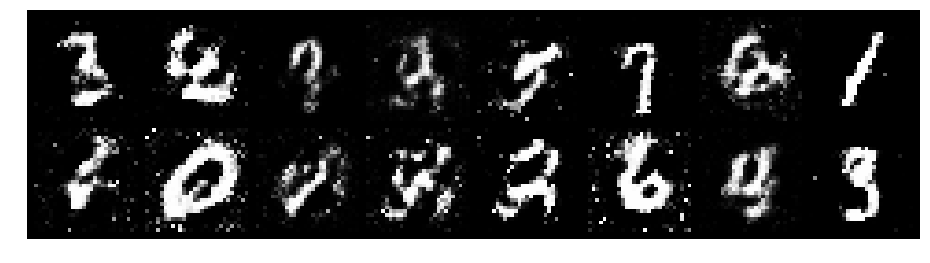

Epoch: [31/200], Batch Num: [400/600]
Discriminator Loss: 1.1254, Generator Loss: 1.3614
D(x): 0.6405, D(G(z)): 0.3676


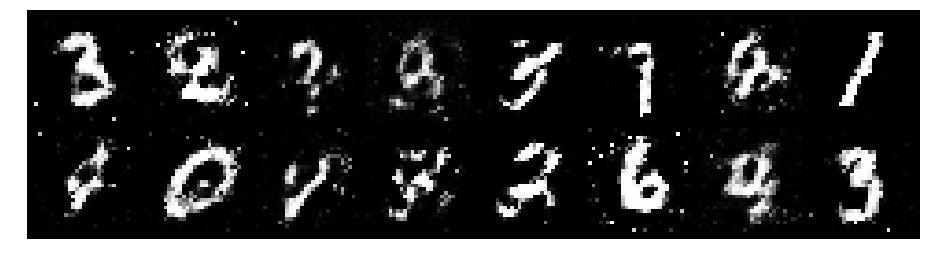

Epoch: [31/200], Batch Num: [500/600]
Discriminator Loss: 1.2829, Generator Loss: 0.9638
D(x): 0.6158, D(G(z)): 0.4685


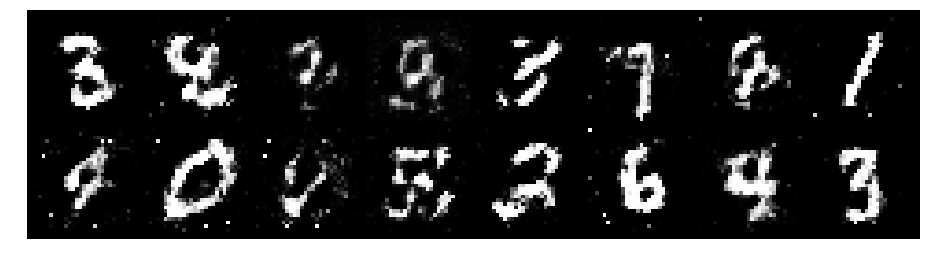

Epoch: [32/200], Batch Num: [0/600]
Discriminator Loss: 1.1777, Generator Loss: 1.3239
D(x): 0.6295, D(G(z)): 0.3426


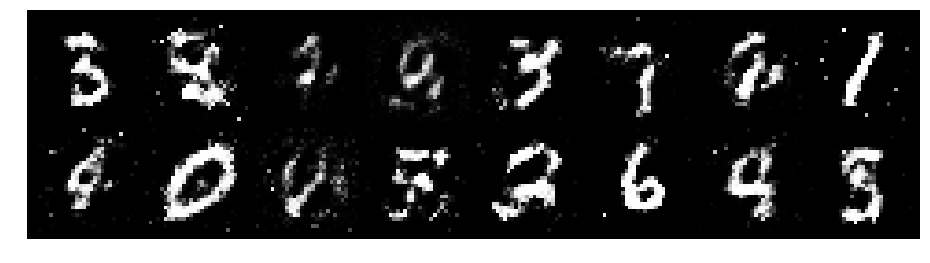

Epoch: [32/200], Batch Num: [100/600]
Discriminator Loss: 0.9756, Generator Loss: 1.4713
D(x): 0.6876, D(G(z)): 0.3558


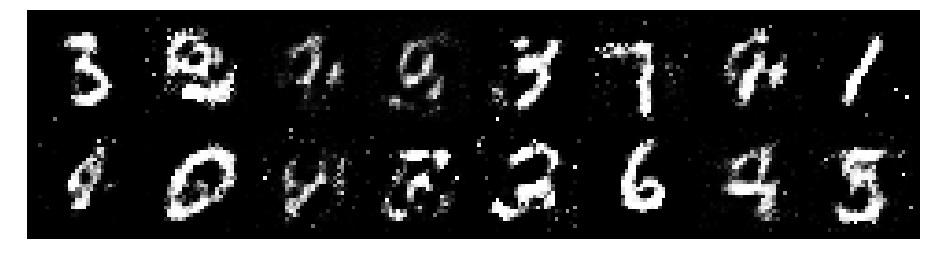

Epoch: [32/200], Batch Num: [200/600]
Discriminator Loss: 1.1240, Generator Loss: 1.4634
D(x): 0.6280, D(G(z)): 0.3653


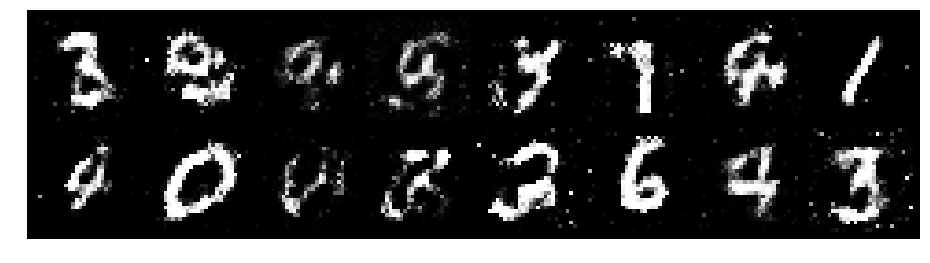

Epoch: [32/200], Batch Num: [300/600]
Discriminator Loss: 0.9443, Generator Loss: 1.2932
D(x): 0.7253, D(G(z)): 0.3588


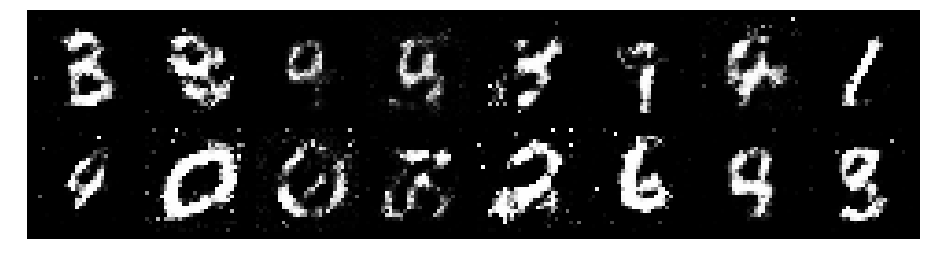

Epoch: [32/200], Batch Num: [400/600]
Discriminator Loss: 1.0029, Generator Loss: 1.1557
D(x): 0.6420, D(G(z)): 0.3372


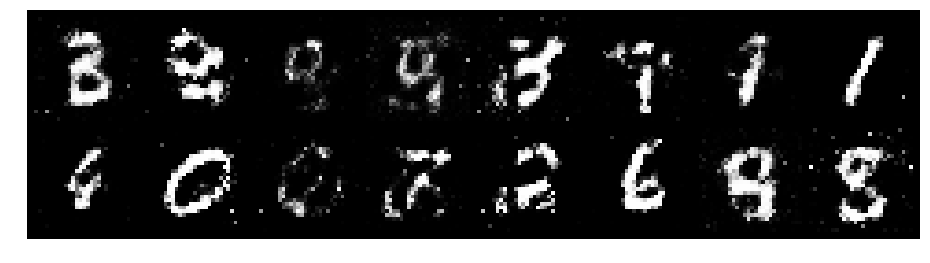

Epoch: [32/200], Batch Num: [500/600]
Discriminator Loss: 0.8798, Generator Loss: 1.2463
D(x): 0.6894, D(G(z)): 0.3184


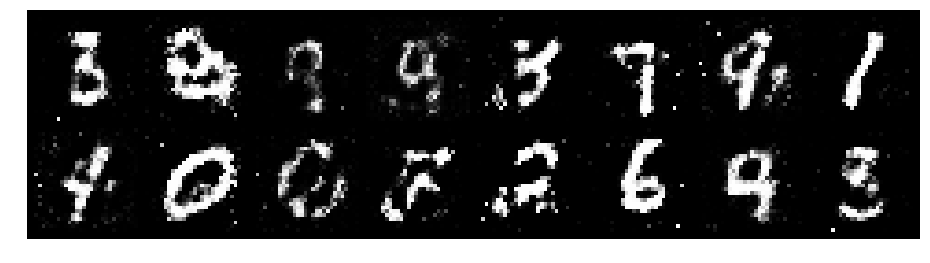

Epoch: [33/200], Batch Num: [0/600]
Discriminator Loss: 1.0736, Generator Loss: 1.0355
D(x): 0.6797, D(G(z)): 0.4296


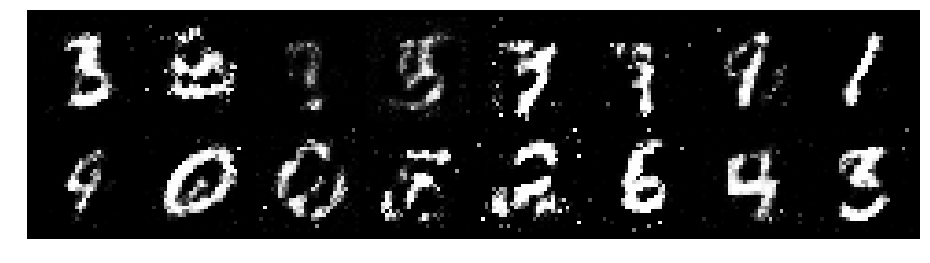

Epoch: [33/200], Batch Num: [100/600]
Discriminator Loss: 1.0550, Generator Loss: 1.1628
D(x): 0.6308, D(G(z)): 0.3685


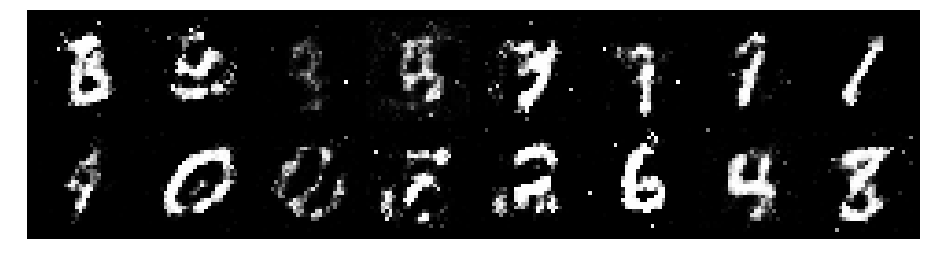

Epoch: [33/200], Batch Num: [200/600]
Discriminator Loss: 1.1196, Generator Loss: 1.0882
D(x): 0.6544, D(G(z)): 0.4000


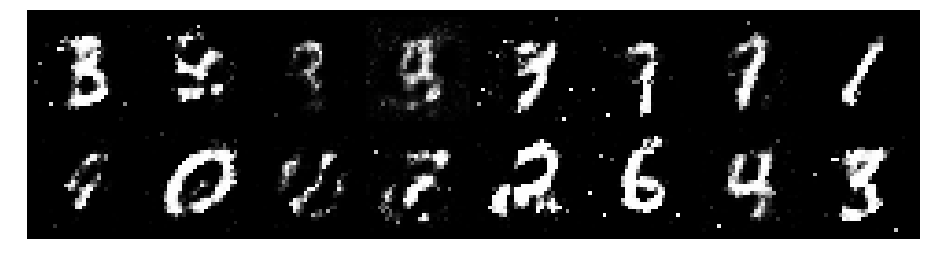

Epoch: [33/200], Batch Num: [300/600]
Discriminator Loss: 1.2742, Generator Loss: 1.1019
D(x): 0.5538, D(G(z)): 0.4244


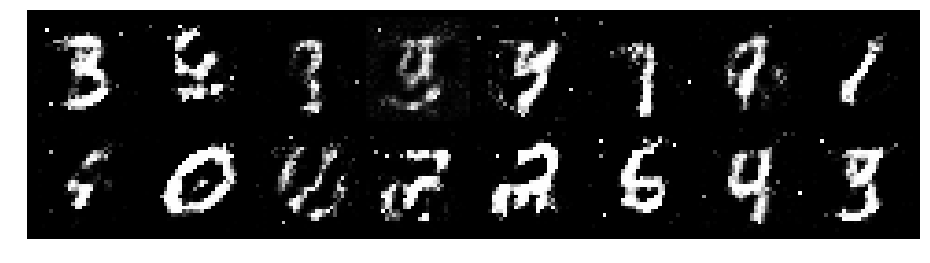

Epoch: [33/200], Batch Num: [400/600]
Discriminator Loss: 1.1064, Generator Loss: 1.0529
D(x): 0.6536, D(G(z)): 0.3991


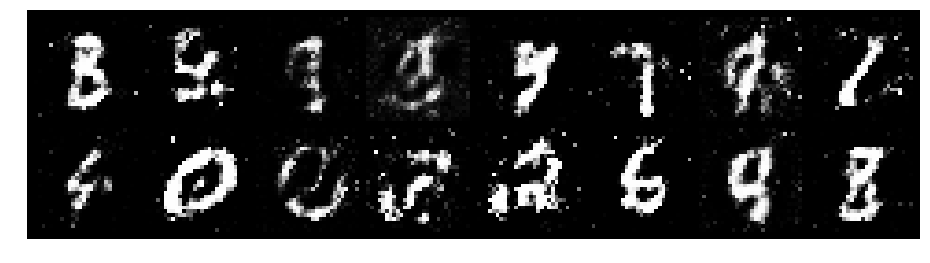

Epoch: [33/200], Batch Num: [500/600]
Discriminator Loss: 1.1672, Generator Loss: 1.0577
D(x): 0.5763, D(G(z)): 0.3728


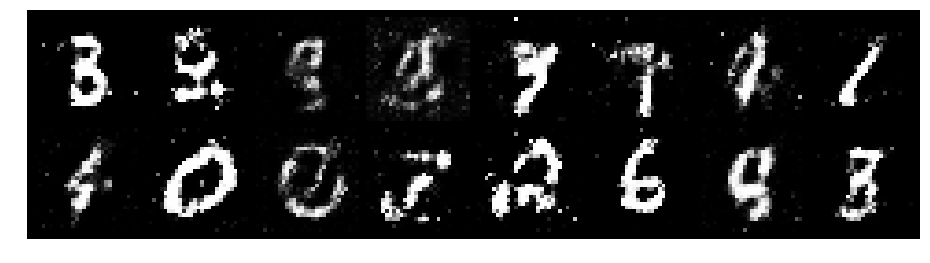

Epoch: [34/200], Batch Num: [0/600]
Discriminator Loss: 1.0091, Generator Loss: 1.2203
D(x): 0.6187, D(G(z)): 0.2975


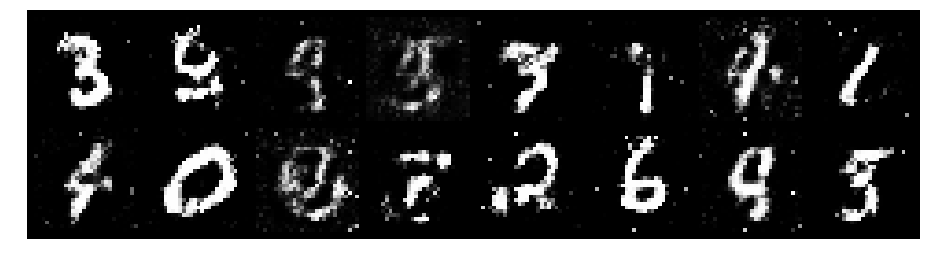

Epoch: [34/200], Batch Num: [100/600]
Discriminator Loss: 1.1840, Generator Loss: 0.9444
D(x): 0.6336, D(G(z)): 0.4416


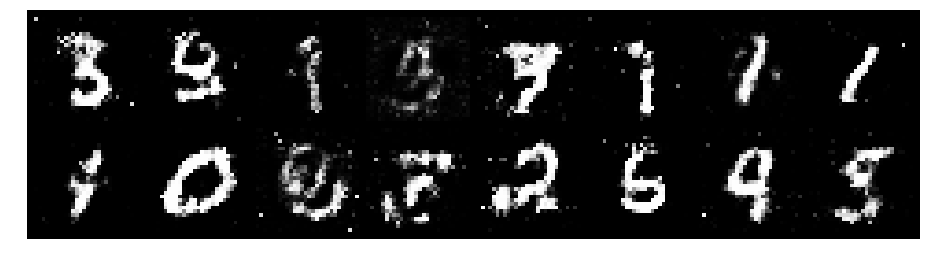

Epoch: [34/200], Batch Num: [200/600]
Discriminator Loss: 1.1077, Generator Loss: 1.1218
D(x): 0.6392, D(G(z)): 0.4035


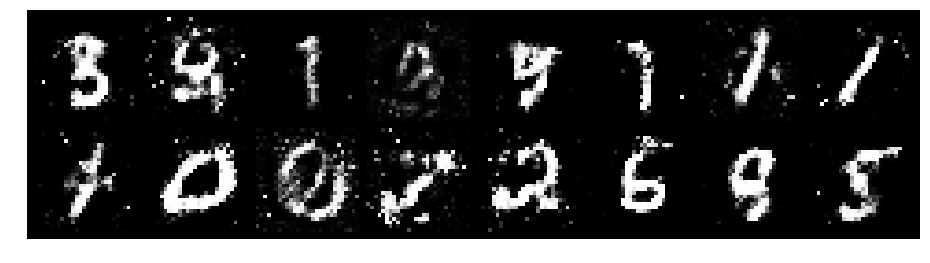

Epoch: [34/200], Batch Num: [300/600]
Discriminator Loss: 1.1121, Generator Loss: 0.9911
D(x): 0.6515, D(G(z)): 0.4338


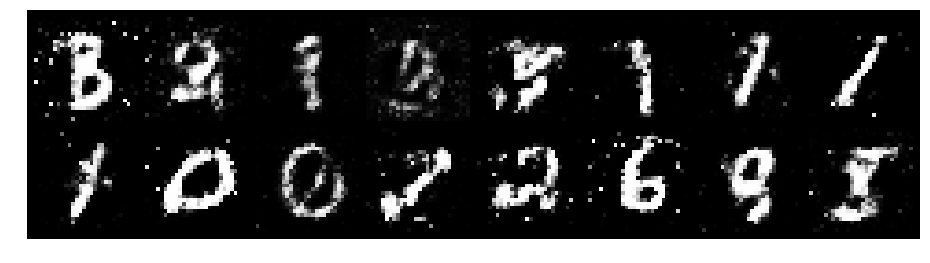

Epoch: [34/200], Batch Num: [400/600]
Discriminator Loss: 1.1024, Generator Loss: 1.3439
D(x): 0.6163, D(G(z)): 0.3412


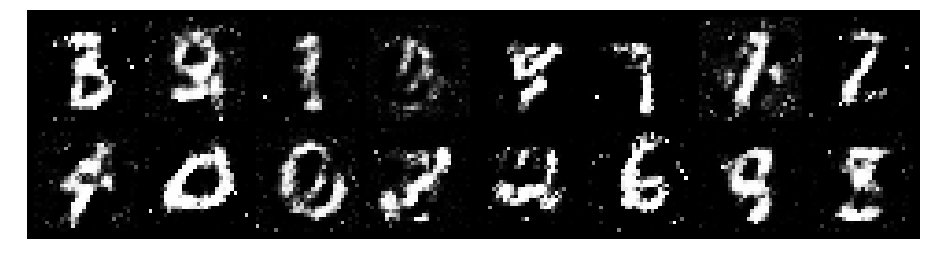

Epoch: [34/200], Batch Num: [500/600]
Discriminator Loss: 1.0738, Generator Loss: 0.9819
D(x): 0.6031, D(G(z)): 0.3808


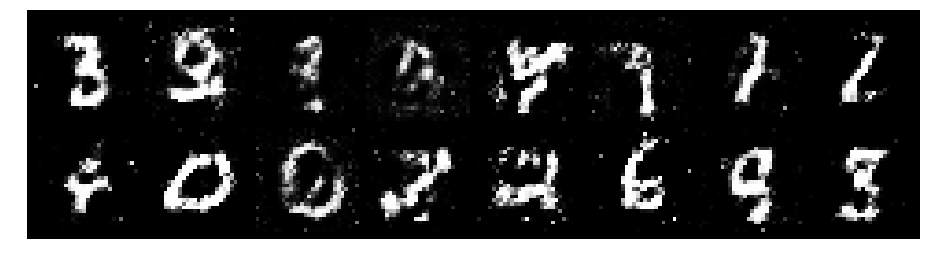

Epoch: [35/200], Batch Num: [0/600]
Discriminator Loss: 0.9702, Generator Loss: 1.2543
D(x): 0.6935, D(G(z)): 0.3624


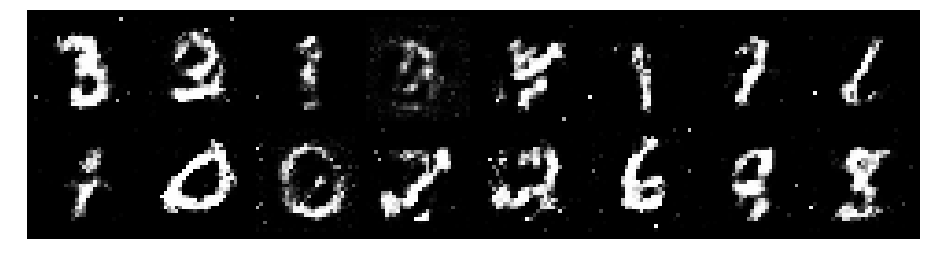

Epoch: [35/200], Batch Num: [100/600]
Discriminator Loss: 0.9958, Generator Loss: 1.4370
D(x): 0.6577, D(G(z)): 0.3265


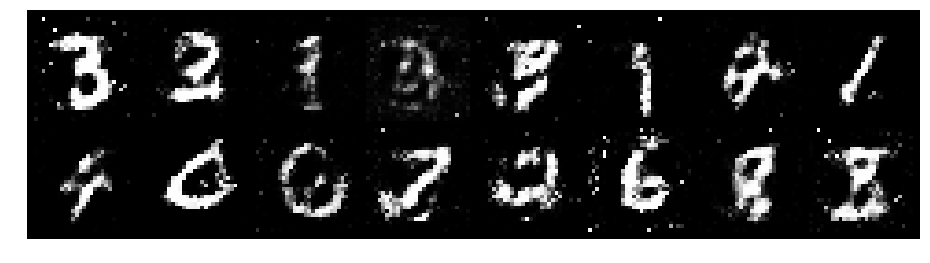

Epoch: [35/200], Batch Num: [200/600]
Discriminator Loss: 0.8948, Generator Loss: 1.1894
D(x): 0.7076, D(G(z)): 0.3501


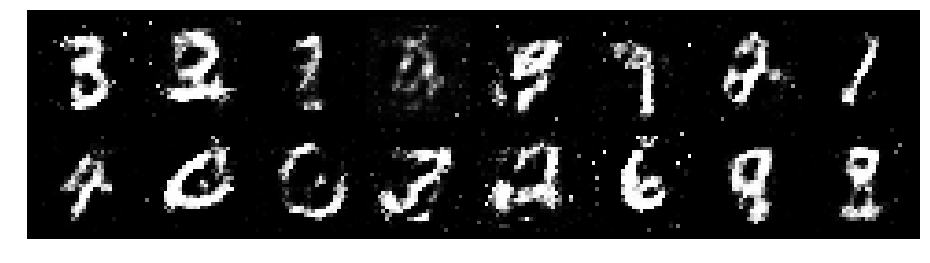

Epoch: [35/200], Batch Num: [300/600]
Discriminator Loss: 0.9529, Generator Loss: 1.3386
D(x): 0.6440, D(G(z)): 0.3119


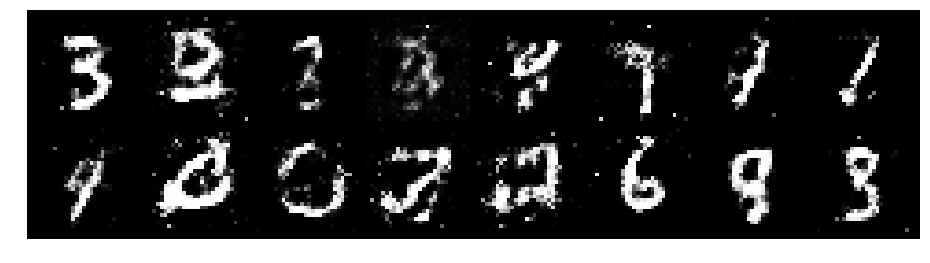

Epoch: [35/200], Batch Num: [400/600]
Discriminator Loss: 1.0109, Generator Loss: 1.2332
D(x): 0.6928, D(G(z)): 0.3863


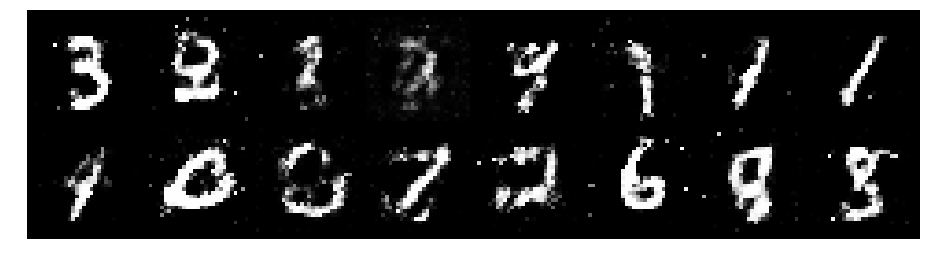

Epoch: [35/200], Batch Num: [500/600]
Discriminator Loss: 1.0568, Generator Loss: 1.3228
D(x): 0.6343, D(G(z)): 0.3439


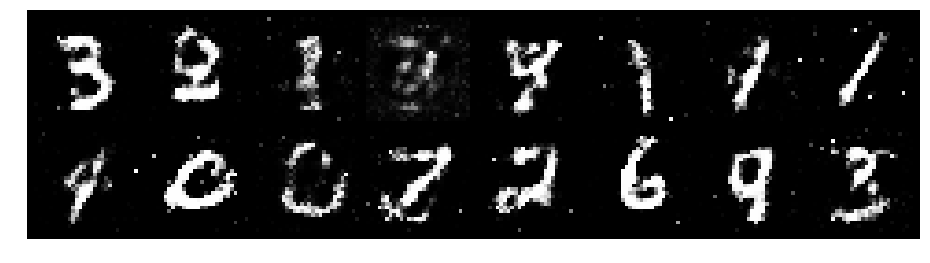

Epoch: [36/200], Batch Num: [0/600]
Discriminator Loss: 1.0550, Generator Loss: 1.3507
D(x): 0.6212, D(G(z)): 0.3649


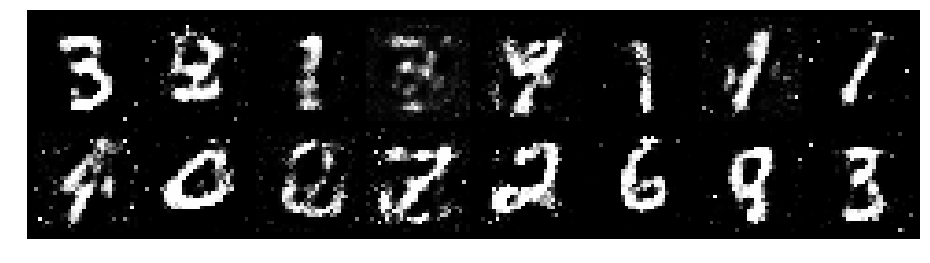

Epoch: [36/200], Batch Num: [100/600]
Discriminator Loss: 1.1853, Generator Loss: 0.9226
D(x): 0.6760, D(G(z)): 0.4378


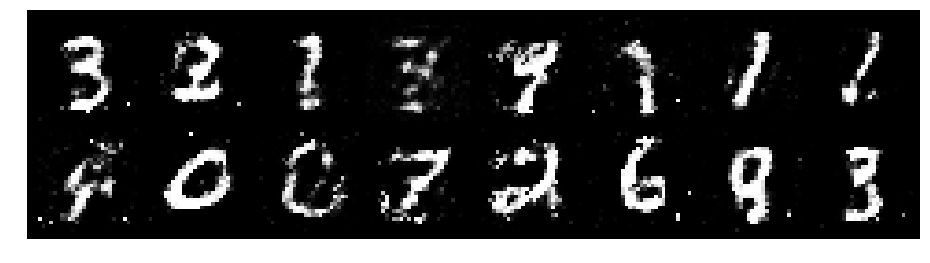

Epoch: [36/200], Batch Num: [200/600]
Discriminator Loss: 1.0646, Generator Loss: 1.0397
D(x): 0.6630, D(G(z)): 0.4083


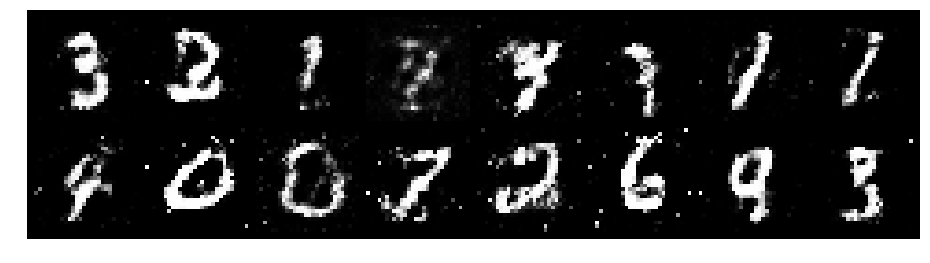

Epoch: [36/200], Batch Num: [300/600]
Discriminator Loss: 1.1182, Generator Loss: 1.3392
D(x): 0.6028, D(G(z)): 0.3625


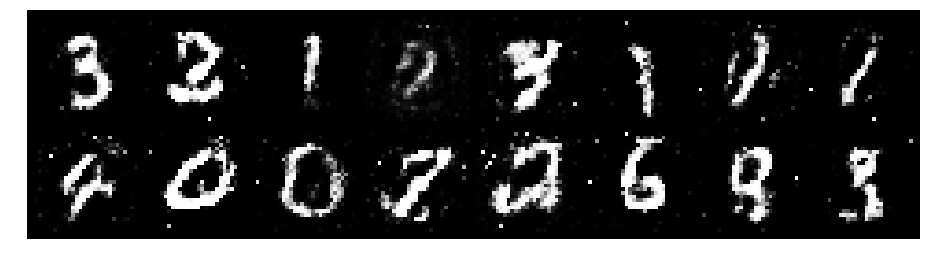

Epoch: [36/200], Batch Num: [400/600]
Discriminator Loss: 1.1927, Generator Loss: 0.9801
D(x): 0.5452, D(G(z)): 0.3695


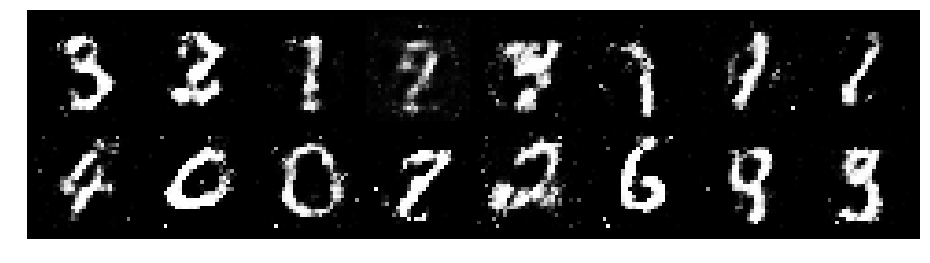

Epoch: [36/200], Batch Num: [500/600]
Discriminator Loss: 1.0270, Generator Loss: 1.0057
D(x): 0.6803, D(G(z)): 0.4046


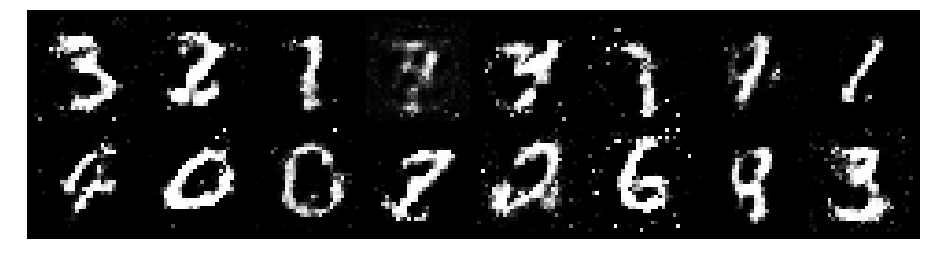

Epoch: [37/200], Batch Num: [0/600]
Discriminator Loss: 1.0136, Generator Loss: 1.1190
D(x): 0.6094, D(G(z)): 0.3410


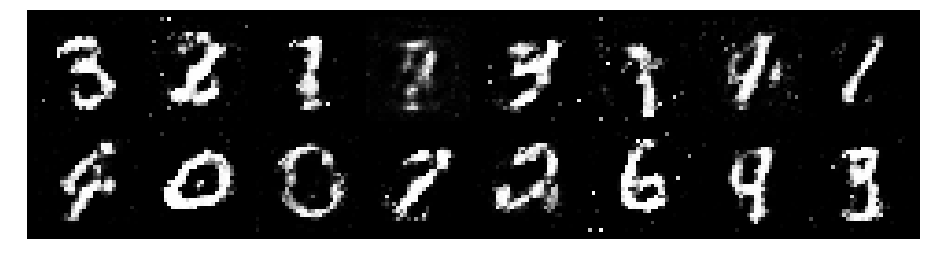

Epoch: [37/200], Batch Num: [100/600]
Discriminator Loss: 0.9952, Generator Loss: 1.2687
D(x): 0.6256, D(G(z)): 0.3342


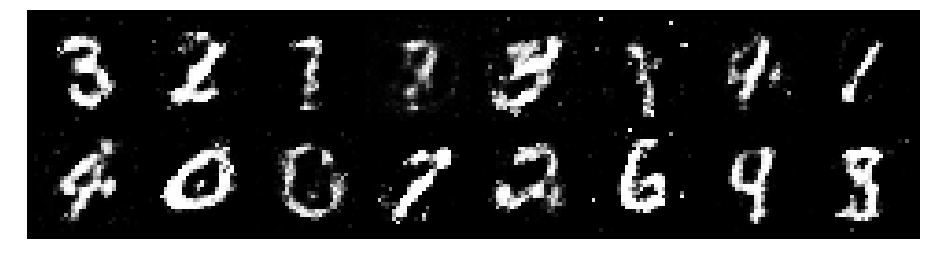

Epoch: [37/200], Batch Num: [200/600]
Discriminator Loss: 0.9057, Generator Loss: 1.2818
D(x): 0.6857, D(G(z)): 0.3114


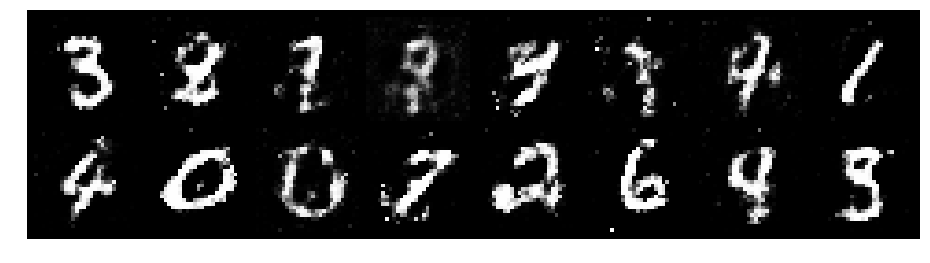

Epoch: [37/200], Batch Num: [300/600]
Discriminator Loss: 0.9896, Generator Loss: 1.3460
D(x): 0.6910, D(G(z)): 0.3385


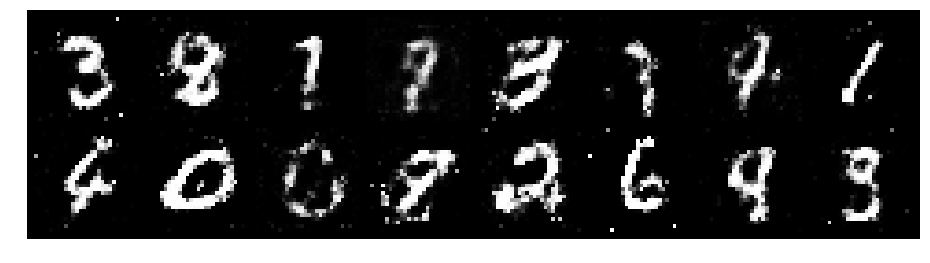

Epoch: [37/200], Batch Num: [400/600]
Discriminator Loss: 1.0451, Generator Loss: 1.2338
D(x): 0.6426, D(G(z)): 0.3756


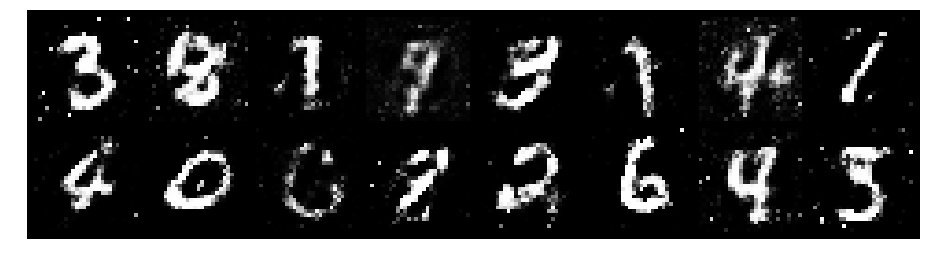

Epoch: [37/200], Batch Num: [500/600]
Discriminator Loss: 0.9674, Generator Loss: 1.2323
D(x): 0.6709, D(G(z)): 0.3624


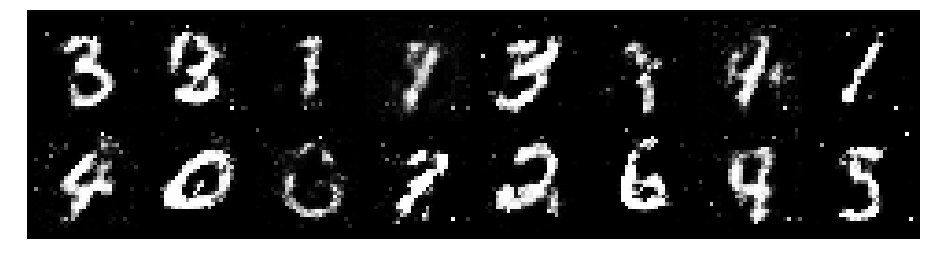

Epoch: [38/200], Batch Num: [0/600]
Discriminator Loss: 1.0794, Generator Loss: 1.2921
D(x): 0.5843, D(G(z)): 0.3395


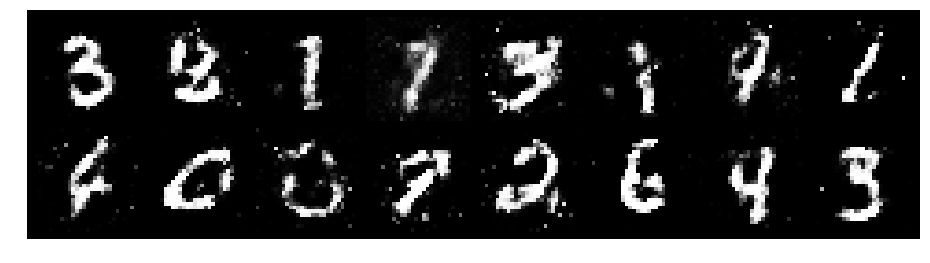

Epoch: [38/200], Batch Num: [100/600]
Discriminator Loss: 1.0923, Generator Loss: 1.2566
D(x): 0.6444, D(G(z)): 0.3587


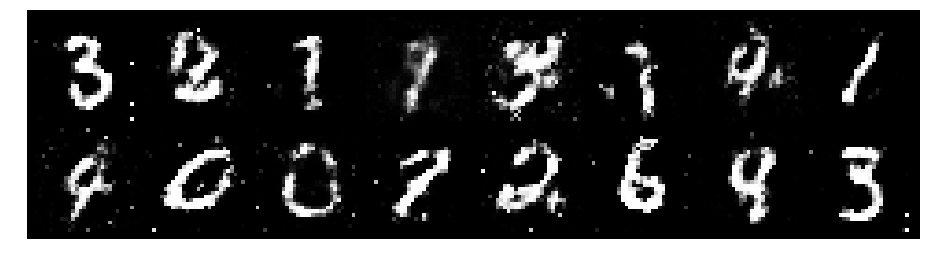

Epoch: [38/200], Batch Num: [200/600]
Discriminator Loss: 0.9998, Generator Loss: 1.2448
D(x): 0.6858, D(G(z)): 0.3710


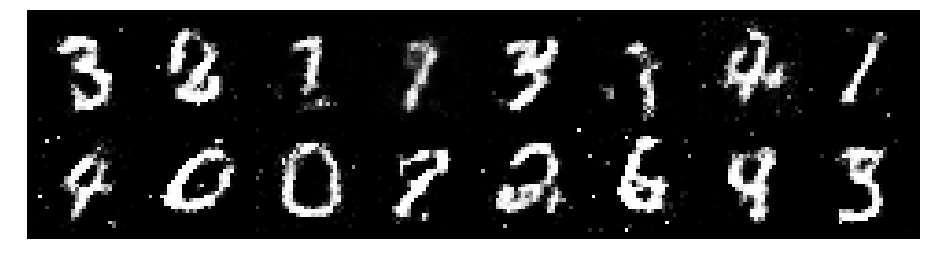

Epoch: [38/200], Batch Num: [300/600]
Discriminator Loss: 1.0861, Generator Loss: 1.2153
D(x): 0.6431, D(G(z)): 0.3449


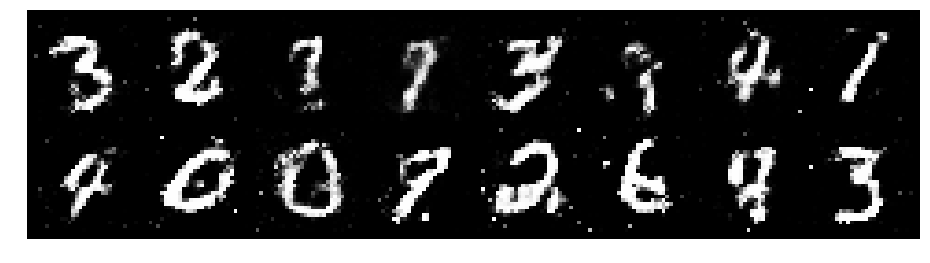

Epoch: [38/200], Batch Num: [400/600]
Discriminator Loss: 1.0638, Generator Loss: 1.2083
D(x): 0.6532, D(G(z)): 0.3727


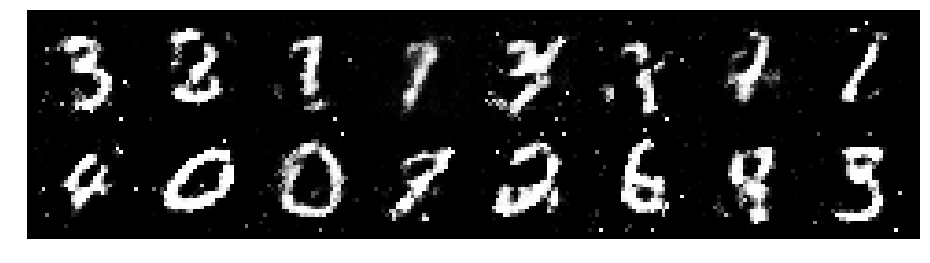

Epoch: [38/200], Batch Num: [500/600]
Discriminator Loss: 1.2086, Generator Loss: 1.3139
D(x): 0.6457, D(G(z)): 0.3815


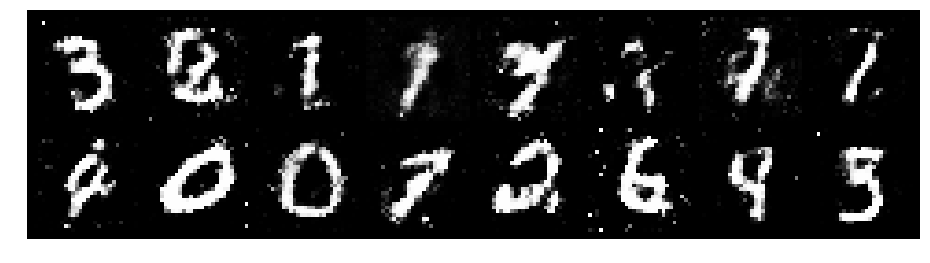

Epoch: [39/200], Batch Num: [0/600]
Discriminator Loss: 1.1896, Generator Loss: 0.9632
D(x): 0.5823, D(G(z)): 0.4076


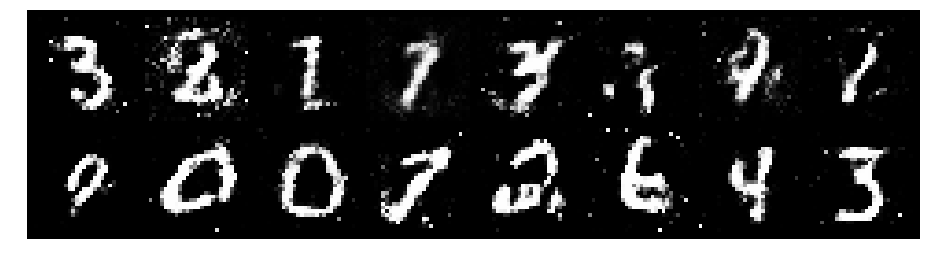

Epoch: [39/200], Batch Num: [100/600]
Discriminator Loss: 1.3209, Generator Loss: 1.0352
D(x): 0.6567, D(G(z)): 0.4823


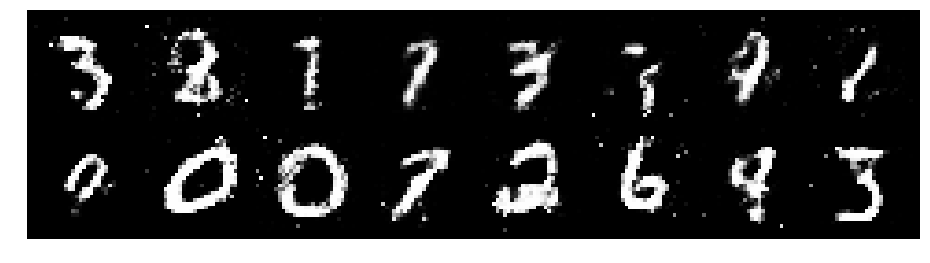

Epoch: [39/200], Batch Num: [200/600]
Discriminator Loss: 1.1370, Generator Loss: 1.1502
D(x): 0.6226, D(G(z)): 0.3918


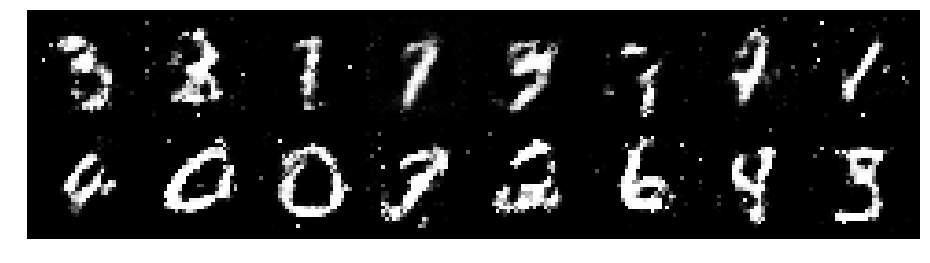

Epoch: [39/200], Batch Num: [300/600]
Discriminator Loss: 1.1479, Generator Loss: 1.2947
D(x): 0.6227, D(G(z)): 0.3776


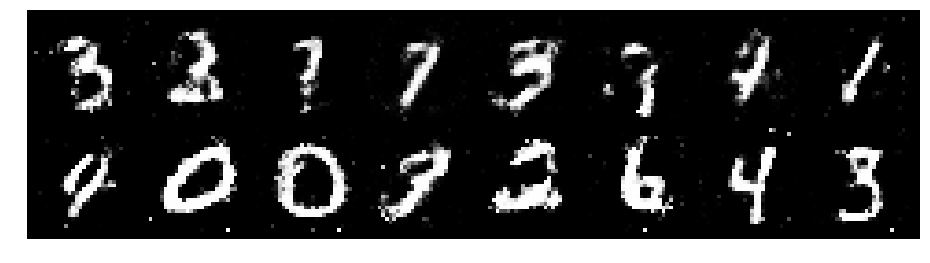

Epoch: [39/200], Batch Num: [400/600]
Discriminator Loss: 1.1668, Generator Loss: 1.1893
D(x): 0.6377, D(G(z)): 0.4033


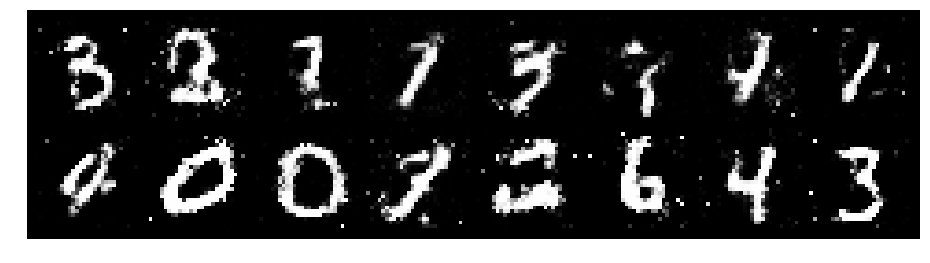

Epoch: [39/200], Batch Num: [500/600]
Discriminator Loss: 1.0178, Generator Loss: 1.4031
D(x): 0.6388, D(G(z)): 0.3404


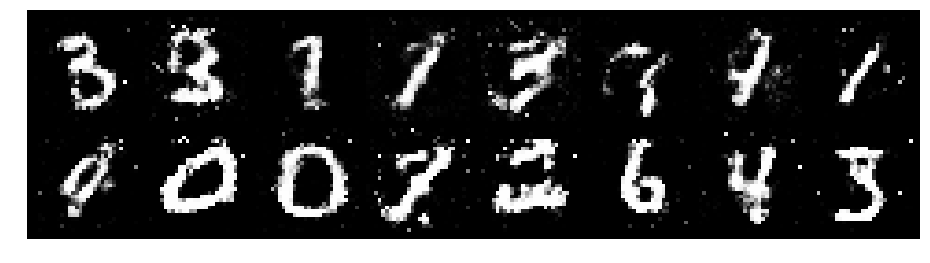

Epoch: [40/200], Batch Num: [0/600]
Discriminator Loss: 1.0827, Generator Loss: 1.2673
D(x): 0.6843, D(G(z)): 0.3903


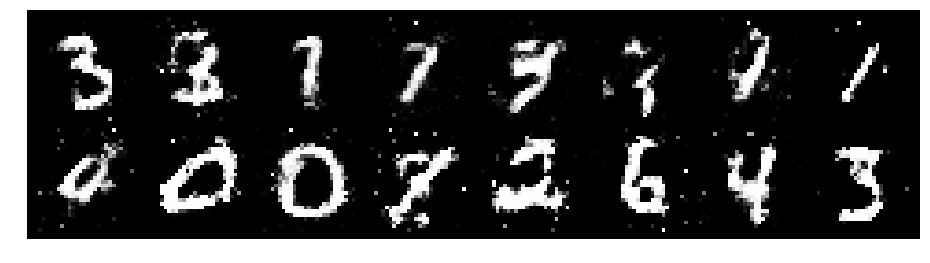

Epoch: [40/200], Batch Num: [100/600]
Discriminator Loss: 1.2041, Generator Loss: 1.0297
D(x): 0.6271, D(G(z)): 0.4337


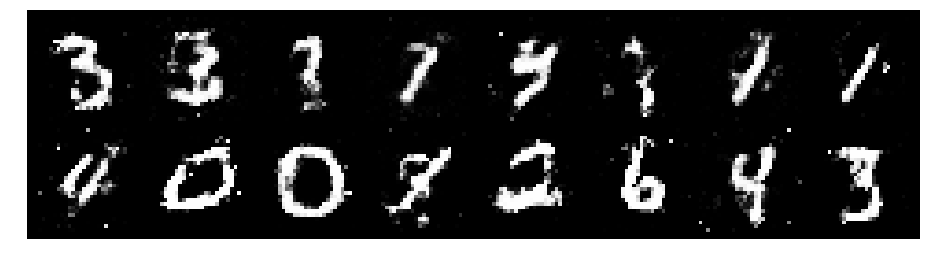

Epoch: [40/200], Batch Num: [200/600]
Discriminator Loss: 1.1356, Generator Loss: 1.0270
D(x): 0.6425, D(G(z)): 0.4068


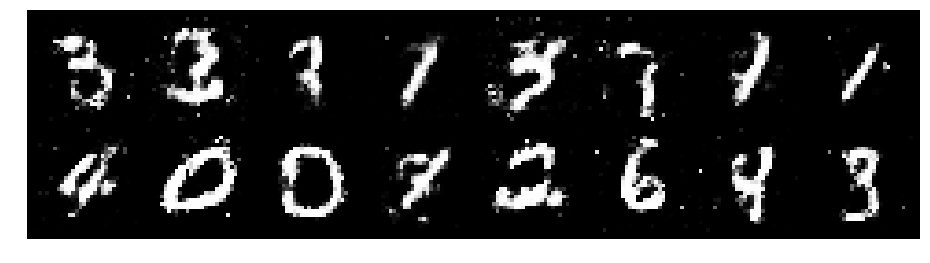

Epoch: [40/200], Batch Num: [300/600]
Discriminator Loss: 1.1707, Generator Loss: 1.0767
D(x): 0.5481, D(G(z)): 0.3627


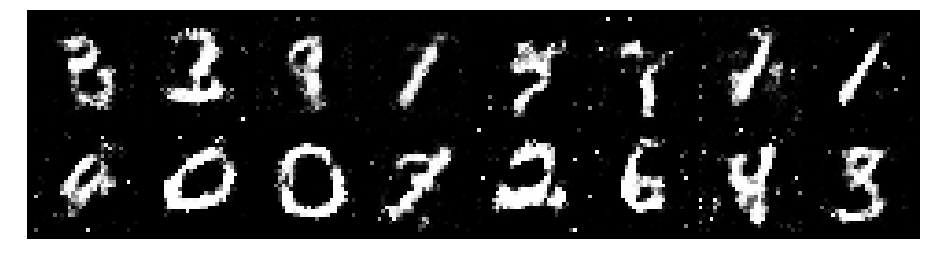

Epoch: [40/200], Batch Num: [400/600]
Discriminator Loss: 1.0347, Generator Loss: 0.9749
D(x): 0.6530, D(G(z)): 0.4114


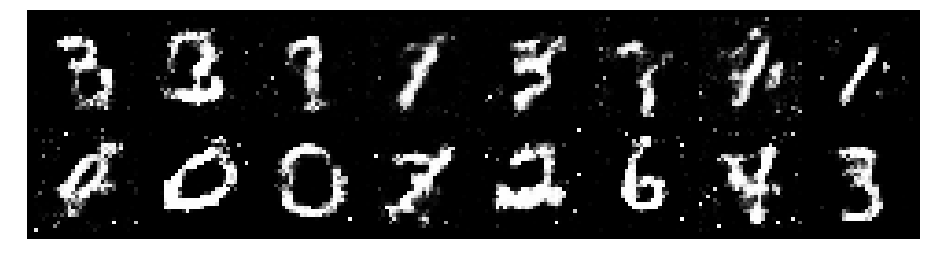

Epoch: [40/200], Batch Num: [500/600]
Discriminator Loss: 0.9661, Generator Loss: 1.2505
D(x): 0.6728, D(G(z)): 0.3609


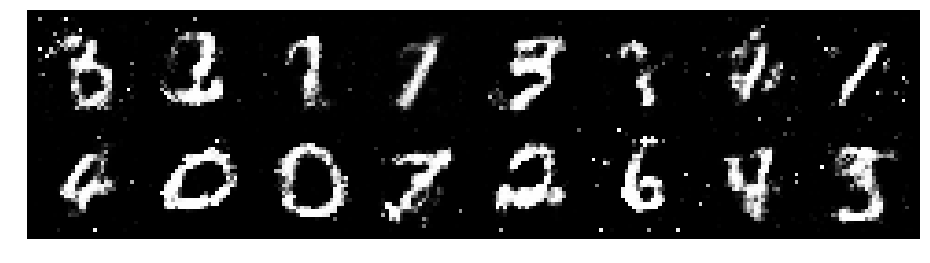

Epoch: [41/200], Batch Num: [0/600]
Discriminator Loss: 0.9229, Generator Loss: 1.2755
D(x): 0.6634, D(G(z)): 0.3114


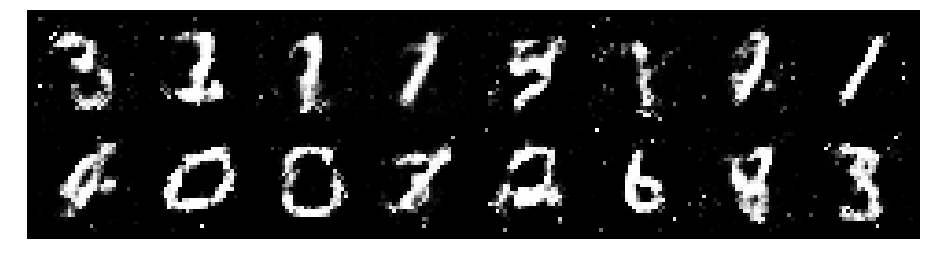

Epoch: [41/200], Batch Num: [100/600]
Discriminator Loss: 1.0811, Generator Loss: 1.1638
D(x): 0.6330, D(G(z)): 0.3831


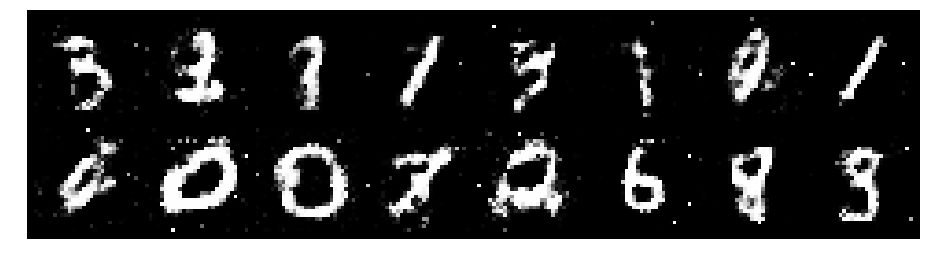

Epoch: [41/200], Batch Num: [200/600]
Discriminator Loss: 1.1223, Generator Loss: 1.1576
D(x): 0.6092, D(G(z)): 0.3939


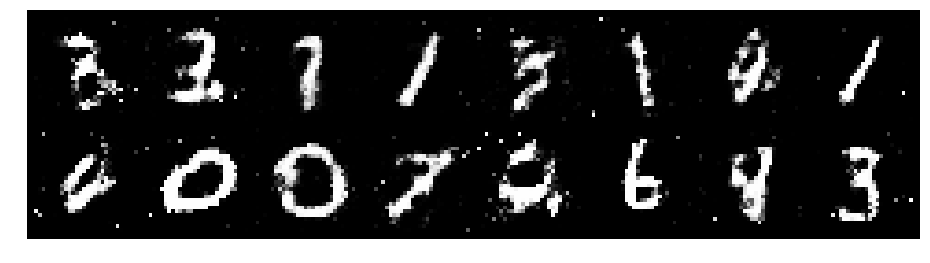

Epoch: [41/200], Batch Num: [300/600]
Discriminator Loss: 0.9938, Generator Loss: 1.2128
D(x): 0.6523, D(G(z)): 0.3332


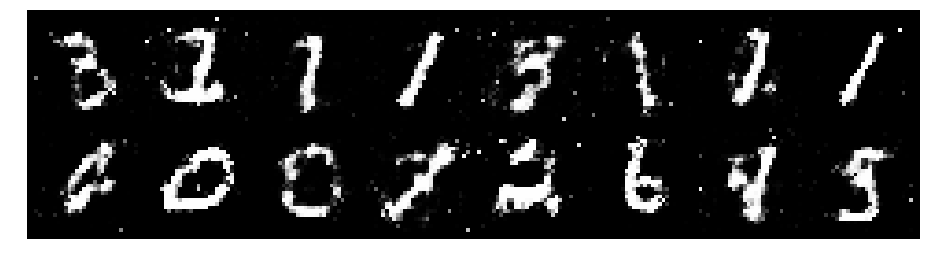

Epoch: [41/200], Batch Num: [400/600]
Discriminator Loss: 1.0609, Generator Loss: 1.3235
D(x): 0.6152, D(G(z)): 0.3464


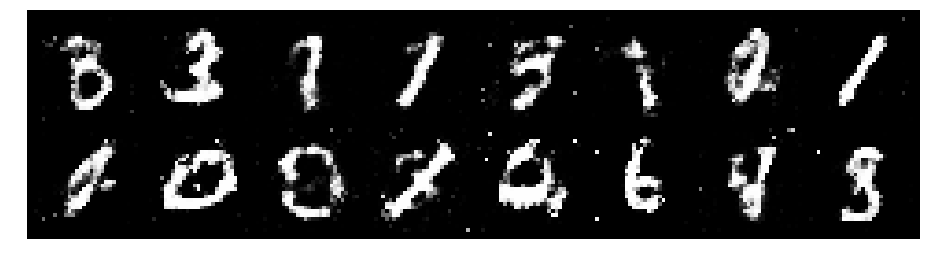

Epoch: [41/200], Batch Num: [500/600]
Discriminator Loss: 1.0115, Generator Loss: 1.3387
D(x): 0.6648, D(G(z)): 0.3566


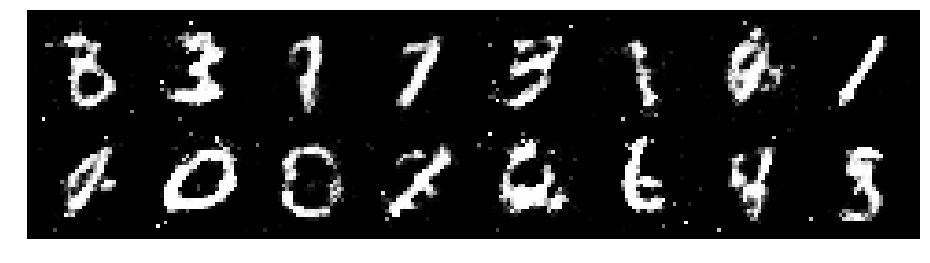

Epoch: [42/200], Batch Num: [0/600]
Discriminator Loss: 1.1796, Generator Loss: 1.3302
D(x): 0.6934, D(G(z)): 0.4397


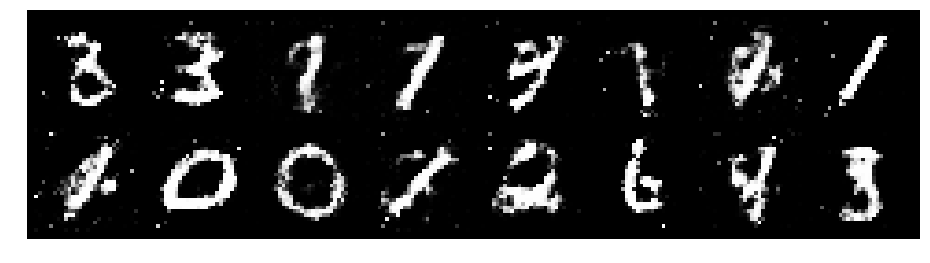

Epoch: [42/200], Batch Num: [100/600]
Discriminator Loss: 1.1284, Generator Loss: 1.6125
D(x): 0.6806, D(G(z)): 0.4079


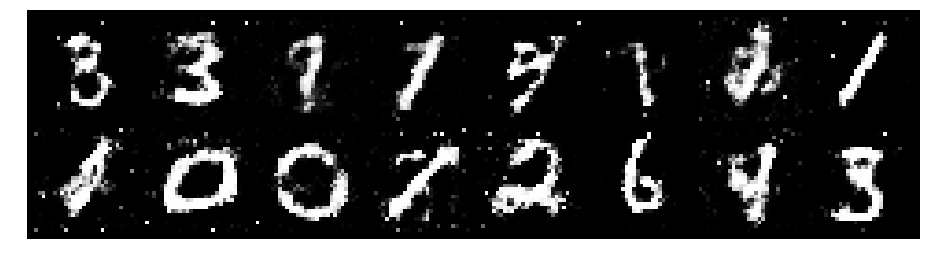

Epoch: [42/200], Batch Num: [200/600]
Discriminator Loss: 1.0219, Generator Loss: 1.5326
D(x): 0.6116, D(G(z)): 0.2779


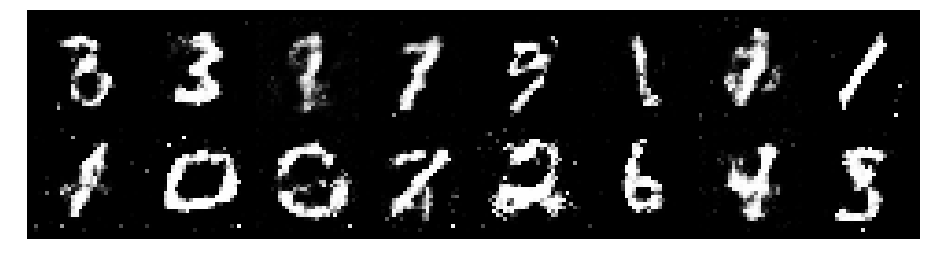

Epoch: [42/200], Batch Num: [300/600]
Discriminator Loss: 1.0528, Generator Loss: 1.3481
D(x): 0.6090, D(G(z)): 0.3023


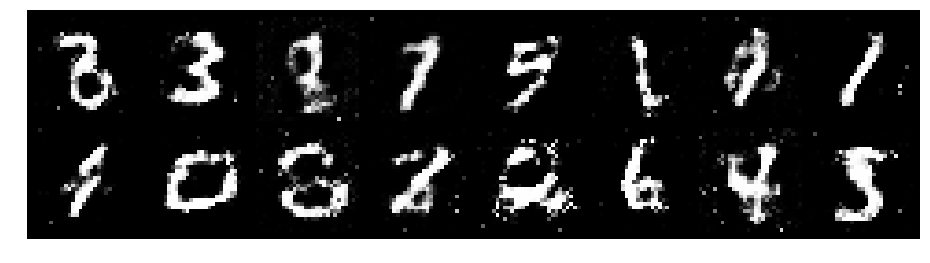

Epoch: [42/200], Batch Num: [400/600]
Discriminator Loss: 1.1195, Generator Loss: 1.2492
D(x): 0.6380, D(G(z)): 0.3663


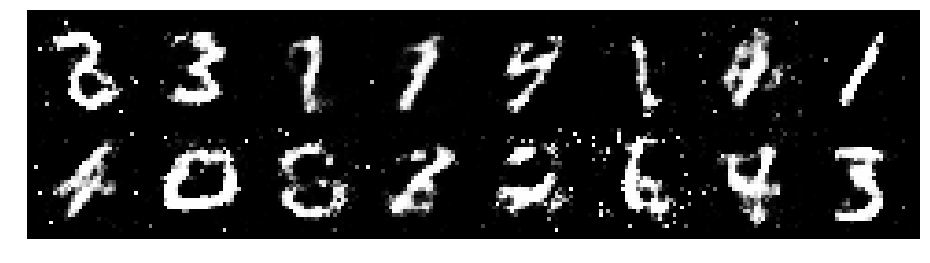

Epoch: [42/200], Batch Num: [500/600]
Discriminator Loss: 1.0208, Generator Loss: 1.2679
D(x): 0.6271, D(G(z)): 0.3324


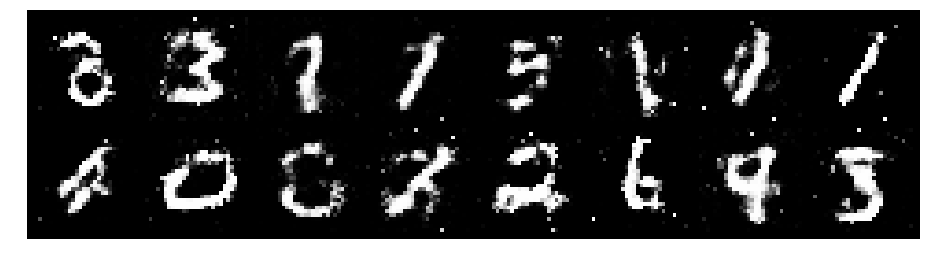

Epoch: [43/200], Batch Num: [0/600]
Discriminator Loss: 1.1176, Generator Loss: 1.0954
D(x): 0.6241, D(G(z)): 0.3754


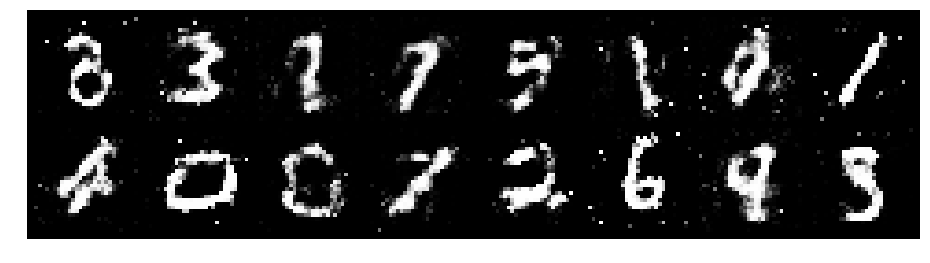

Epoch: [43/200], Batch Num: [100/600]
Discriminator Loss: 1.1736, Generator Loss: 1.0865
D(x): 0.6580, D(G(z)): 0.4330


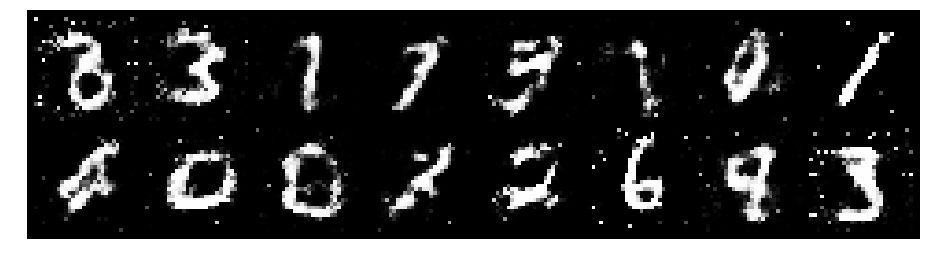

Epoch: [43/200], Batch Num: [200/600]
Discriminator Loss: 1.2143, Generator Loss: 1.0188
D(x): 0.6586, D(G(z)): 0.4696


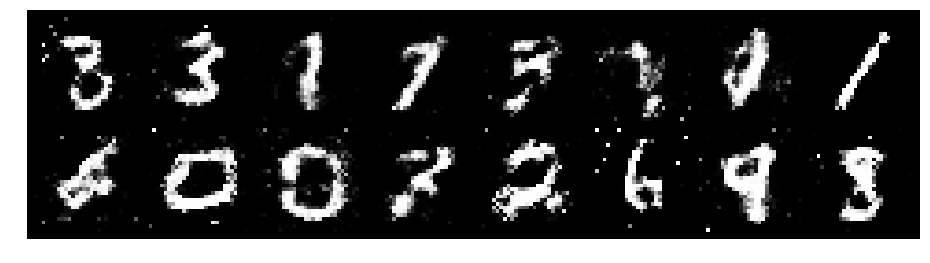

Epoch: [43/200], Batch Num: [300/600]
Discriminator Loss: 1.1404, Generator Loss: 1.0538
D(x): 0.6436, D(G(z)): 0.4227


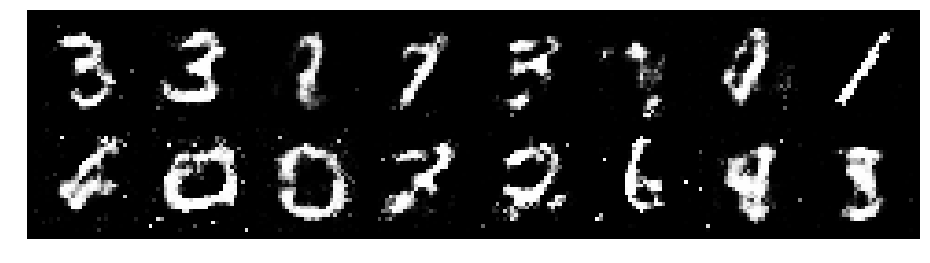

Epoch: [43/200], Batch Num: [400/600]
Discriminator Loss: 1.0880, Generator Loss: 1.1713
D(x): 0.6115, D(G(z)): 0.3662


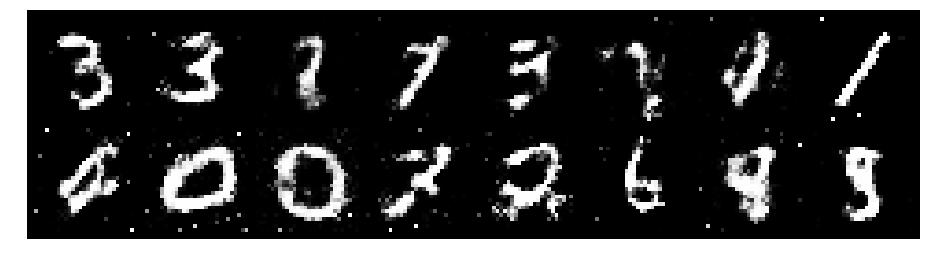

Epoch: [43/200], Batch Num: [500/600]
Discriminator Loss: 1.1766, Generator Loss: 1.1389
D(x): 0.6519, D(G(z)): 0.4366


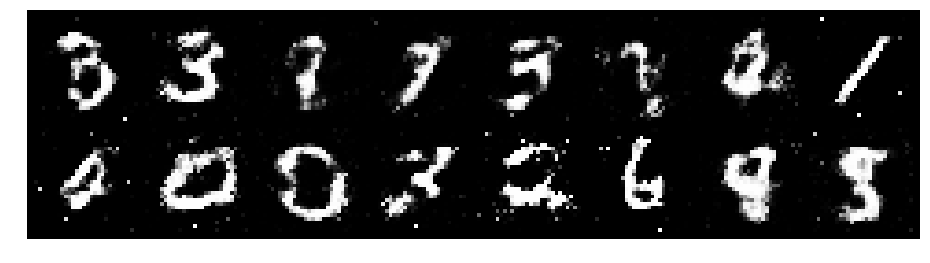

Epoch: [44/200], Batch Num: [0/600]
Discriminator Loss: 1.0437, Generator Loss: 1.2203
D(x): 0.6718, D(G(z)): 0.3754


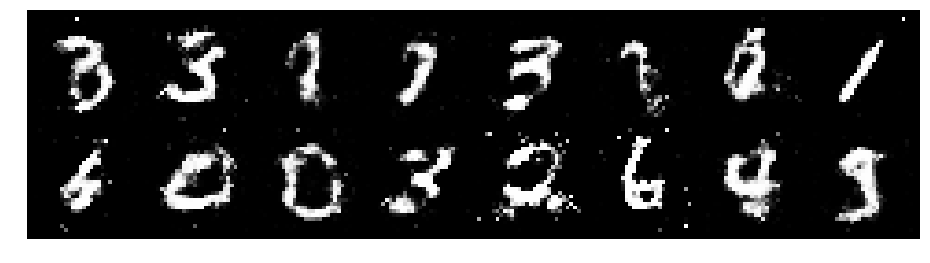

Epoch: [44/200], Batch Num: [100/600]
Discriminator Loss: 1.2599, Generator Loss: 0.9798
D(x): 0.6087, D(G(z)): 0.4484


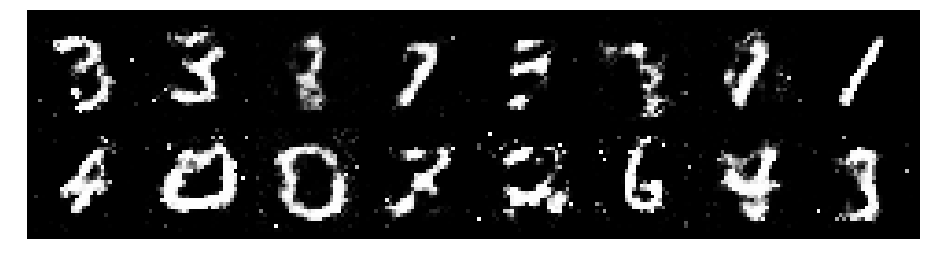

Epoch: [44/200], Batch Num: [200/600]
Discriminator Loss: 1.1847, Generator Loss: 0.9952
D(x): 0.6096, D(G(z)): 0.4291


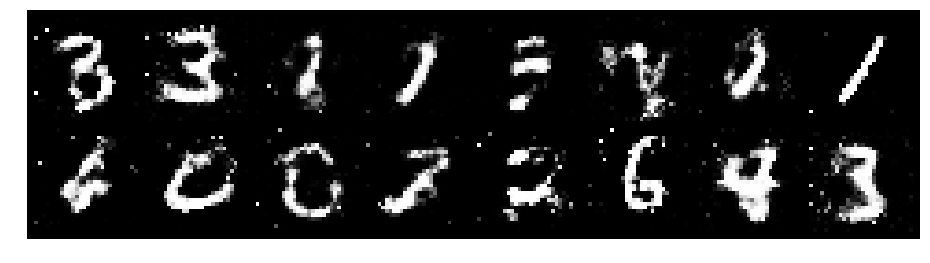

Epoch: [44/200], Batch Num: [300/600]
Discriminator Loss: 1.1982, Generator Loss: 1.0994
D(x): 0.6713, D(G(z)): 0.4539


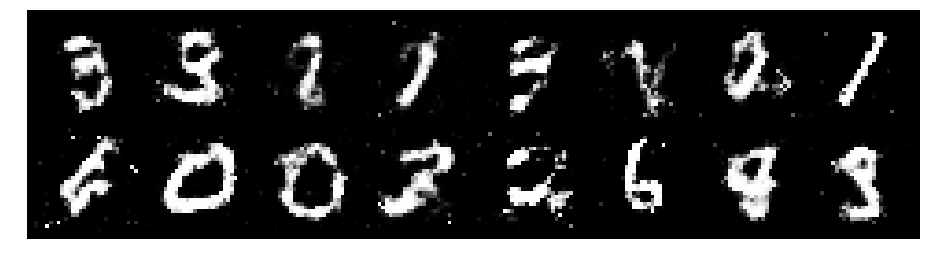

Epoch: [44/200], Batch Num: [400/600]
Discriminator Loss: 1.0812, Generator Loss: 1.2138
D(x): 0.5932, D(G(z)): 0.3529


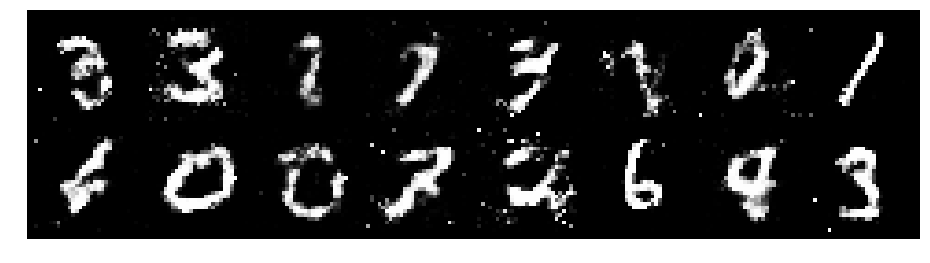

Epoch: [44/200], Batch Num: [500/600]
Discriminator Loss: 1.1744, Generator Loss: 1.0659
D(x): 0.5800, D(G(z)): 0.3685


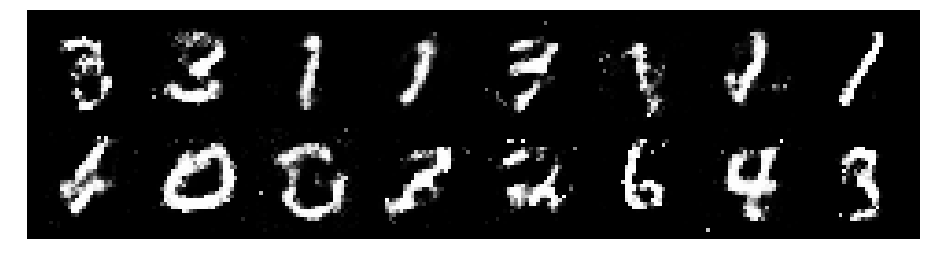

Epoch: [45/200], Batch Num: [0/600]
Discriminator Loss: 1.0595, Generator Loss: 1.2340
D(x): 0.6117, D(G(z)): 0.3563


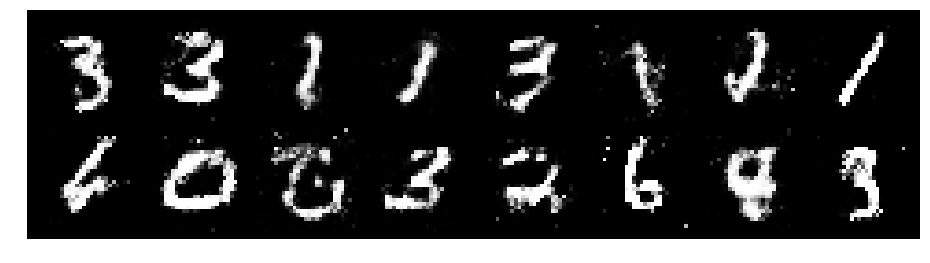

Epoch: [45/200], Batch Num: [100/600]
Discriminator Loss: 1.1324, Generator Loss: 0.9660
D(x): 0.6377, D(G(z)): 0.4350


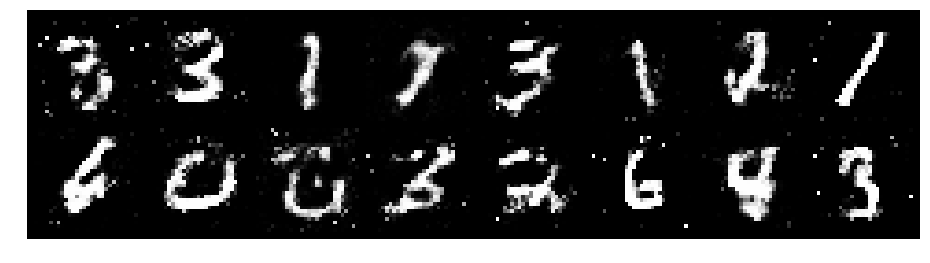

Epoch: [45/200], Batch Num: [200/600]
Discriminator Loss: 1.2517, Generator Loss: 1.0196
D(x): 0.5462, D(G(z)): 0.3984


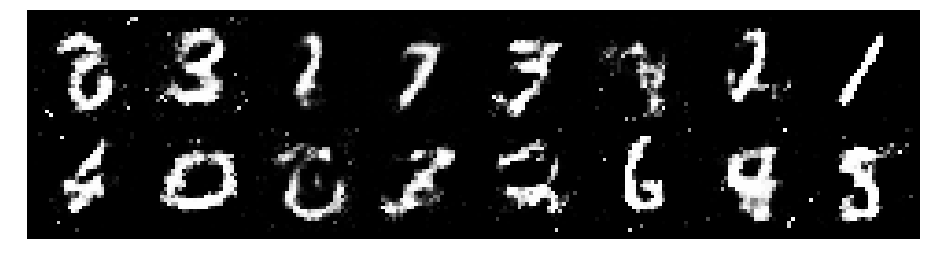

Epoch: [45/200], Batch Num: [300/600]
Discriminator Loss: 1.3037, Generator Loss: 0.8423
D(x): 0.6555, D(G(z)): 0.4884


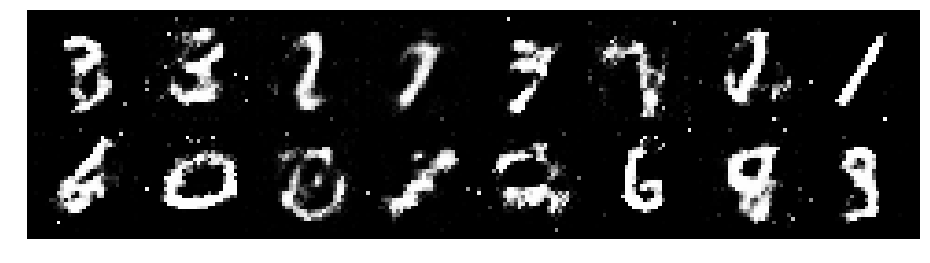

Epoch: [45/200], Batch Num: [400/600]
Discriminator Loss: 1.2005, Generator Loss: 1.2119
D(x): 0.5941, D(G(z)): 0.3807


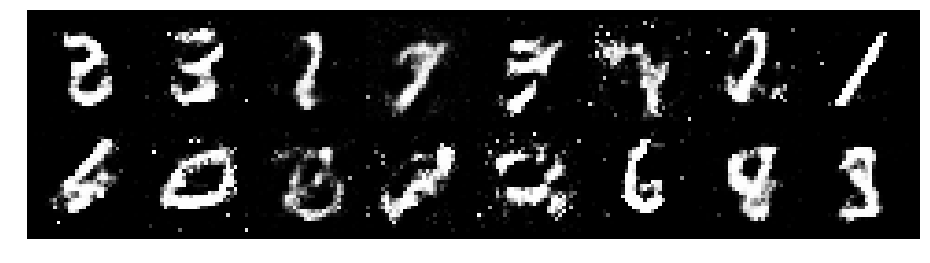

Epoch: [45/200], Batch Num: [500/600]
Discriminator Loss: 1.4039, Generator Loss: 1.1382
D(x): 0.5306, D(G(z)): 0.4147


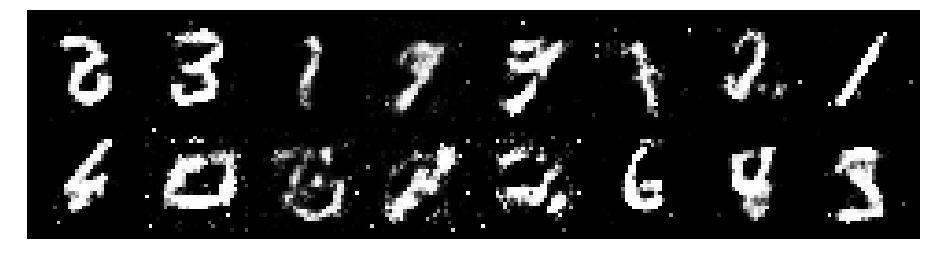

Epoch: [46/200], Batch Num: [0/600]
Discriminator Loss: 1.3688, Generator Loss: 1.0458
D(x): 0.5423, D(G(z)): 0.4332


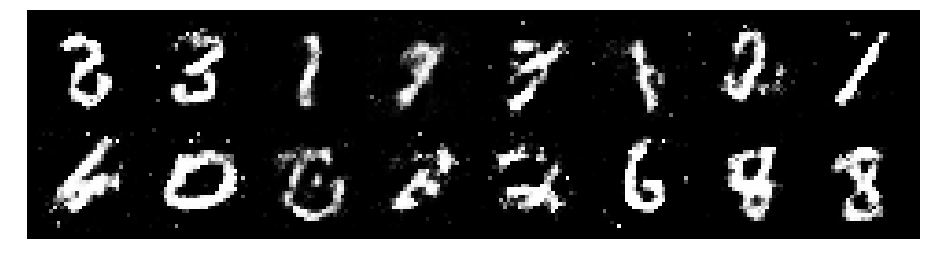

Epoch: [46/200], Batch Num: [100/600]
Discriminator Loss: 1.1765, Generator Loss: 1.0108
D(x): 0.5760, D(G(z)): 0.3857


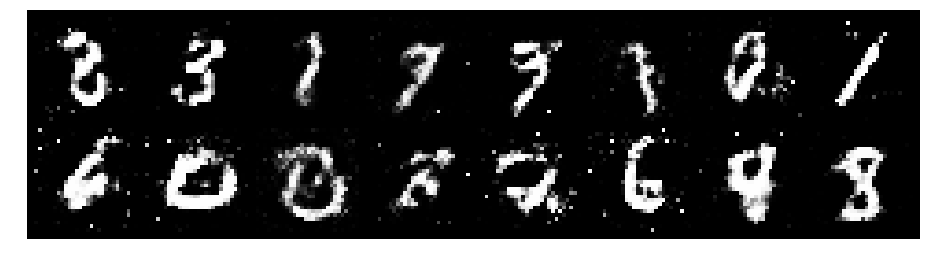

Epoch: [46/200], Batch Num: [200/600]
Discriminator Loss: 1.2557, Generator Loss: 0.9313
D(x): 0.5318, D(G(z)): 0.3964


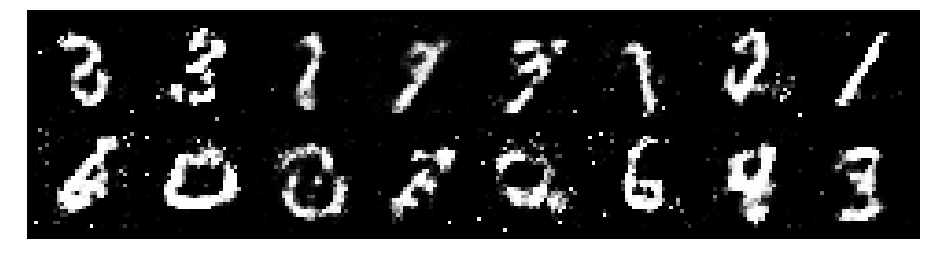

Epoch: [46/200], Batch Num: [300/600]
Discriminator Loss: 1.2836, Generator Loss: 0.8680
D(x): 0.5643, D(G(z)): 0.4137


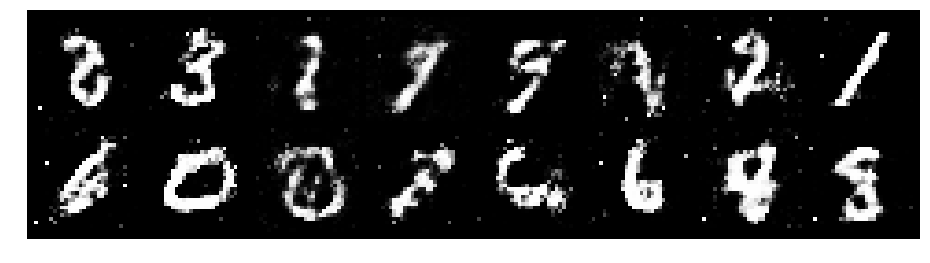

Epoch: [46/200], Batch Num: [400/600]
Discriminator Loss: 1.1601, Generator Loss: 1.1722
D(x): 0.5693, D(G(z)): 0.3550


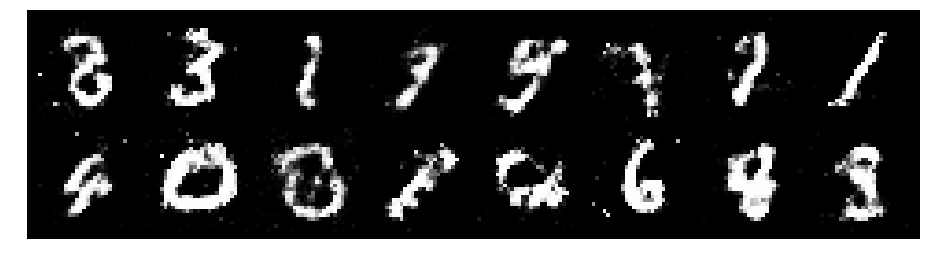

Epoch: [46/200], Batch Num: [500/600]
Discriminator Loss: 1.0632, Generator Loss: 1.0917
D(x): 0.6422, D(G(z)): 0.3824


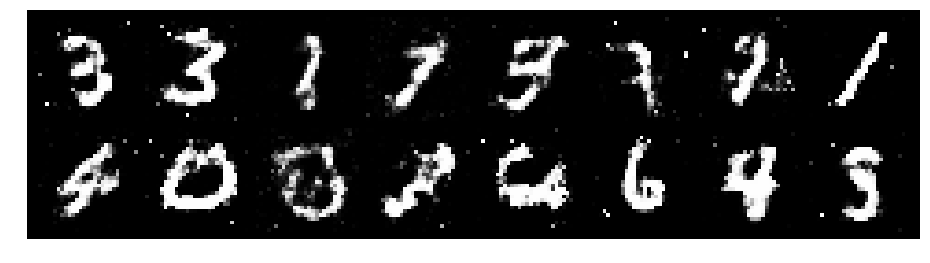

Epoch: [47/200], Batch Num: [0/600]
Discriminator Loss: 1.2690, Generator Loss: 1.1203
D(x): 0.6350, D(G(z)): 0.4547


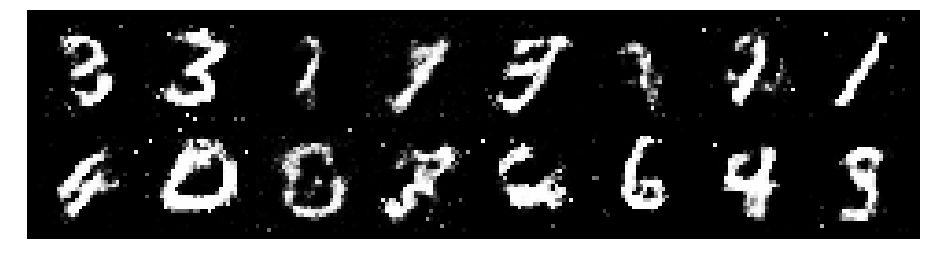

Epoch: [47/200], Batch Num: [100/600]
Discriminator Loss: 1.2613, Generator Loss: 1.2896
D(x): 0.5696, D(G(z)): 0.3879


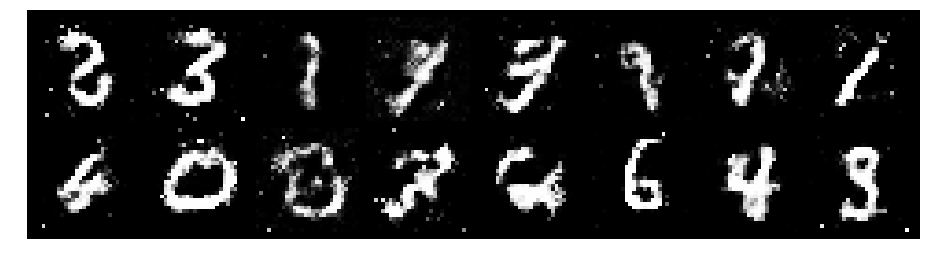

Epoch: [47/200], Batch Num: [200/600]
Discriminator Loss: 1.1125, Generator Loss: 1.1857
D(x): 0.5931, D(G(z)): 0.3637


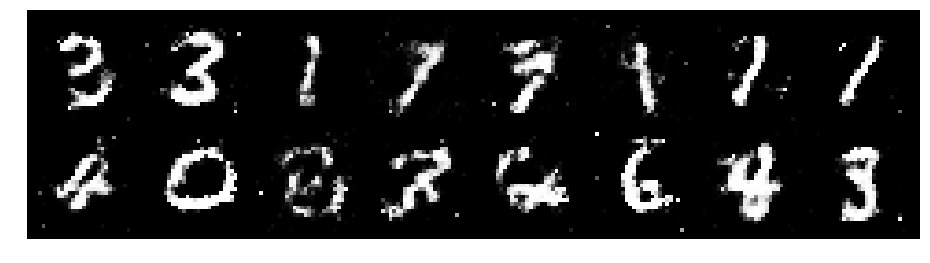

Epoch: [47/200], Batch Num: [300/600]
Discriminator Loss: 1.1794, Generator Loss: 1.2544
D(x): 0.5798, D(G(z)): 0.3980


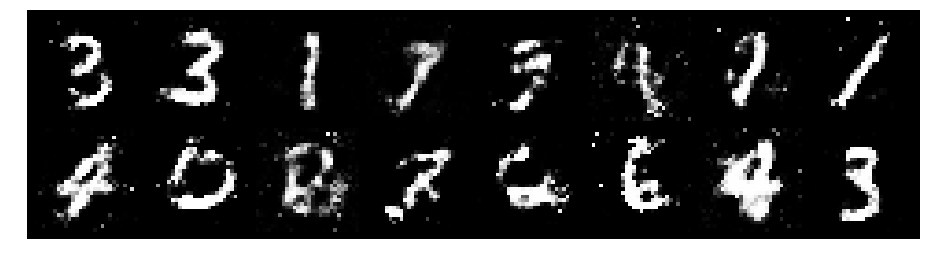

Epoch: [47/200], Batch Num: [400/600]
Discriminator Loss: 1.2331, Generator Loss: 1.2100
D(x): 0.5557, D(G(z)): 0.3651


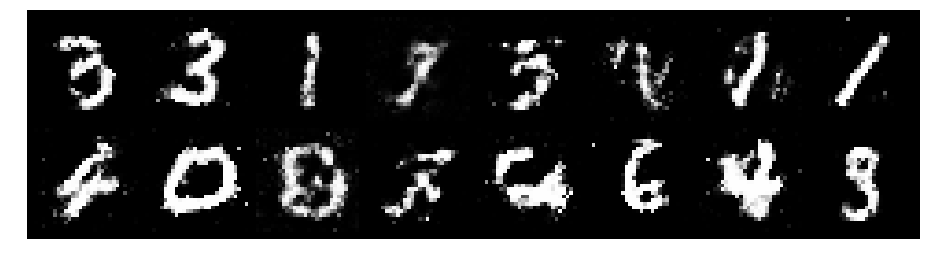

Epoch: [47/200], Batch Num: [500/600]
Discriminator Loss: 1.1080, Generator Loss: 1.1078
D(x): 0.6547, D(G(z)): 0.4284


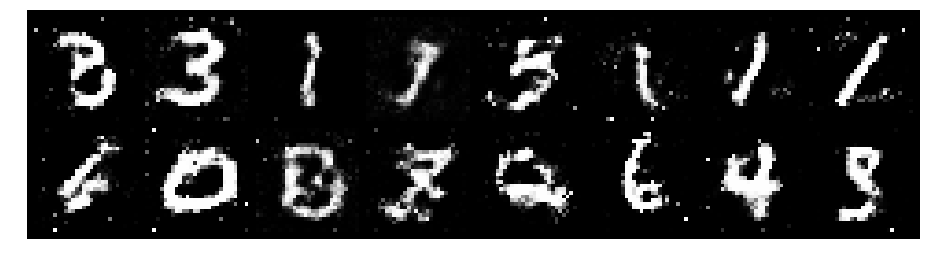

Epoch: [48/200], Batch Num: [0/600]
Discriminator Loss: 1.2801, Generator Loss: 0.9236
D(x): 0.5387, D(G(z)): 0.4172


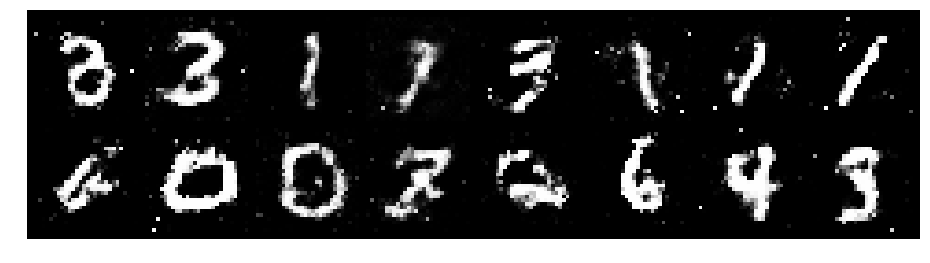

Epoch: [48/200], Batch Num: [100/600]
Discriminator Loss: 1.1933, Generator Loss: 0.8418
D(x): 0.5836, D(G(z)): 0.4130


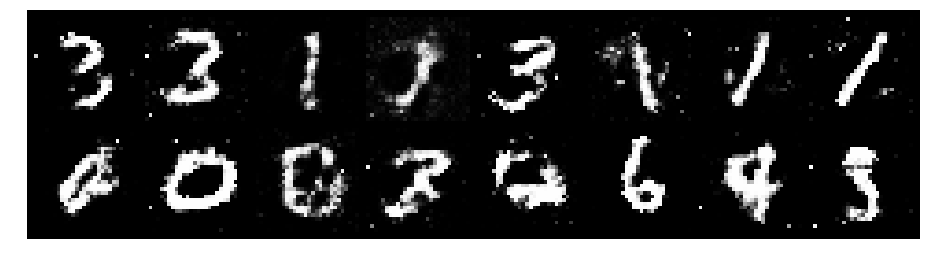

Epoch: [48/200], Batch Num: [200/600]
Discriminator Loss: 1.2253, Generator Loss: 1.0257
D(x): 0.5664, D(G(z)): 0.4165


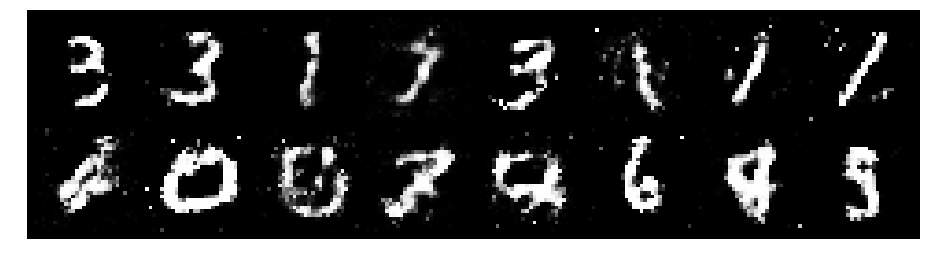

Epoch: [48/200], Batch Num: [300/600]
Discriminator Loss: 1.0980, Generator Loss: 1.0944
D(x): 0.6273, D(G(z)): 0.3881


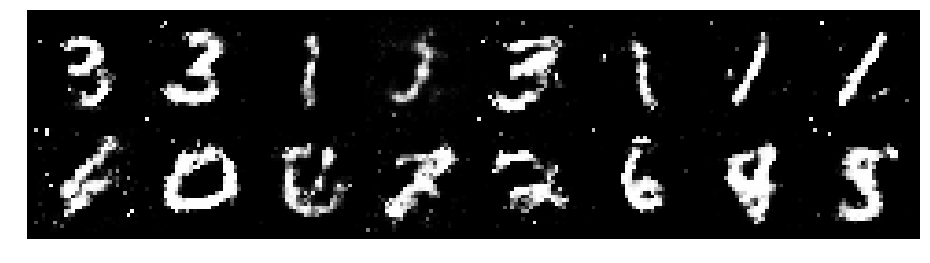

Epoch: [48/200], Batch Num: [400/600]
Discriminator Loss: 1.3645, Generator Loss: 1.0258
D(x): 0.5625, D(G(z)): 0.4296


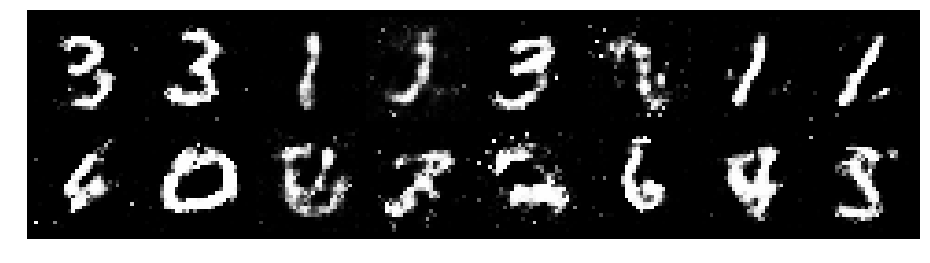

Epoch: [48/200], Batch Num: [500/600]
Discriminator Loss: 1.2792, Generator Loss: 1.0272
D(x): 0.5469, D(G(z)): 0.4264


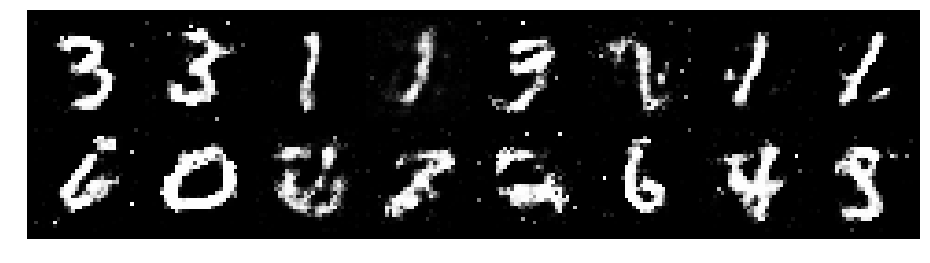

Epoch: [49/200], Batch Num: [0/600]
Discriminator Loss: 1.1282, Generator Loss: 1.3358
D(x): 0.6212, D(G(z)): 0.3880


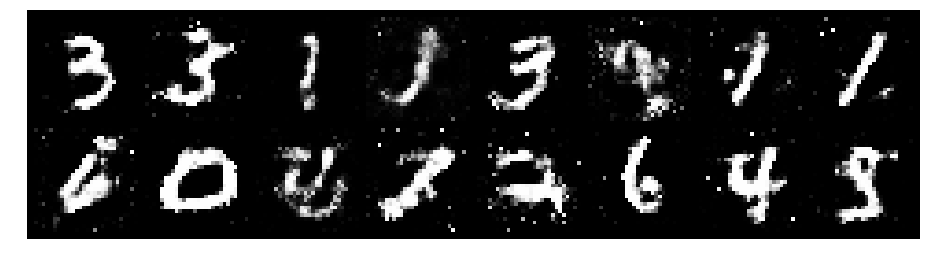

Epoch: [49/200], Batch Num: [100/600]
Discriminator Loss: 1.1540, Generator Loss: 0.9475
D(x): 0.6241, D(G(z)): 0.4141


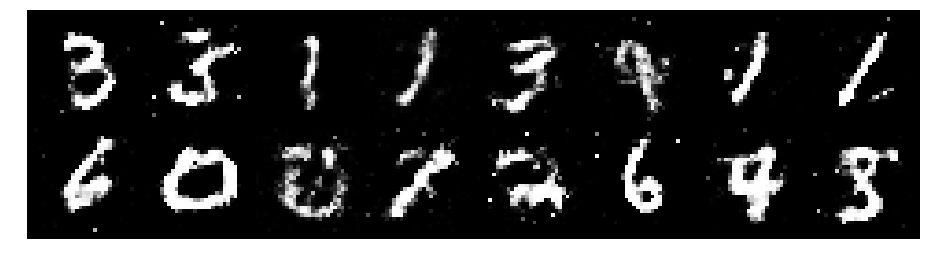

Epoch: [49/200], Batch Num: [200/600]
Discriminator Loss: 1.1050, Generator Loss: 1.1506
D(x): 0.5559, D(G(z)): 0.3064


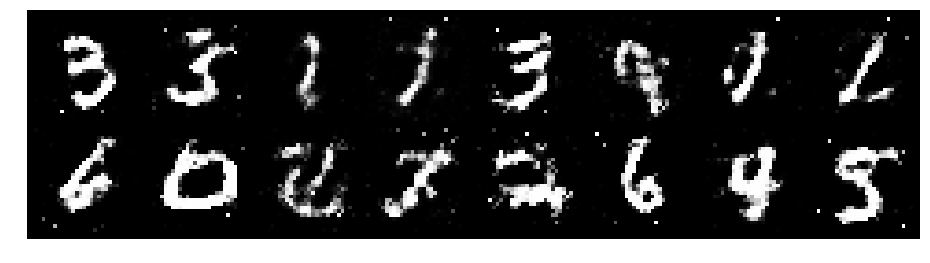

Epoch: [49/200], Batch Num: [300/600]
Discriminator Loss: 1.0010, Generator Loss: 1.2131
D(x): 0.6388, D(G(z)): 0.3537


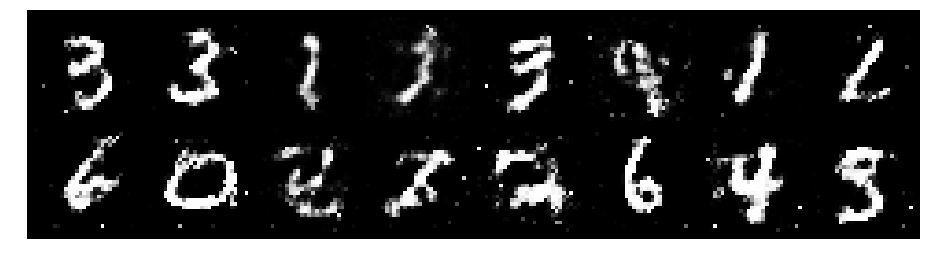

Epoch: [49/200], Batch Num: [400/600]
Discriminator Loss: 1.1913, Generator Loss: 1.1795
D(x): 0.5634, D(G(z)): 0.3842


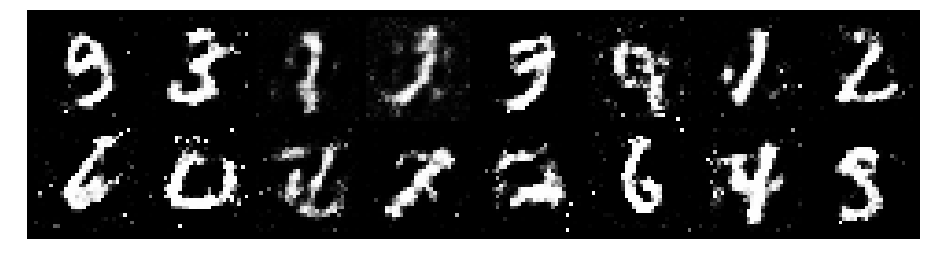

Epoch: [49/200], Batch Num: [500/600]
Discriminator Loss: 1.1188, Generator Loss: 1.0639
D(x): 0.6092, D(G(z)): 0.4065


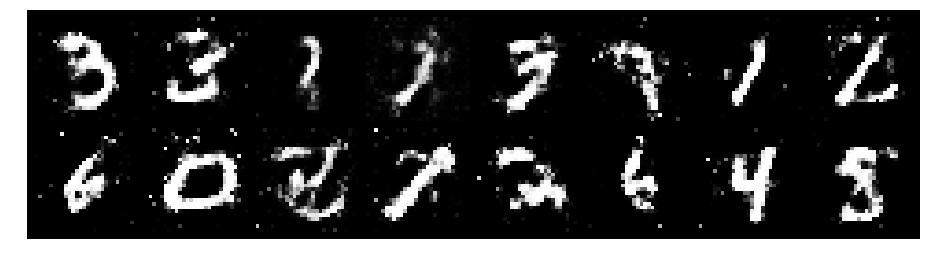

Epoch: [50/200], Batch Num: [0/600]
Discriminator Loss: 1.0896, Generator Loss: 0.9429
D(x): 0.6345, D(G(z)): 0.4244


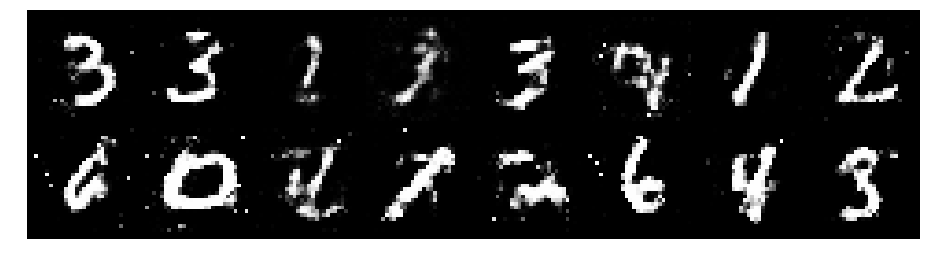

Epoch: [50/200], Batch Num: [100/600]
Discriminator Loss: 1.0420, Generator Loss: 1.0419
D(x): 0.6457, D(G(z)): 0.3755


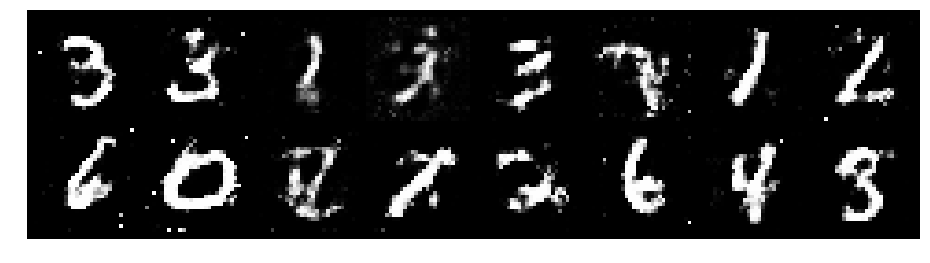

Epoch: [50/200], Batch Num: [200/600]
Discriminator Loss: 1.2700, Generator Loss: 0.8764
D(x): 0.5898, D(G(z)): 0.4613


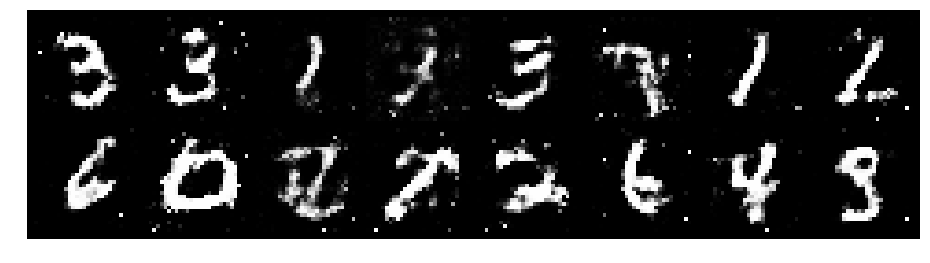

Epoch: [50/200], Batch Num: [300/600]
Discriminator Loss: 1.3681, Generator Loss: 1.0706
D(x): 0.5804, D(G(z)): 0.4770


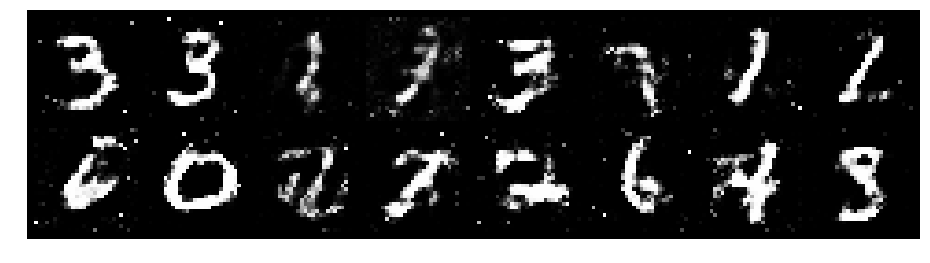

Epoch: [50/200], Batch Num: [400/600]
Discriminator Loss: 1.3103, Generator Loss: 0.8363
D(x): 0.5944, D(G(z)): 0.4884


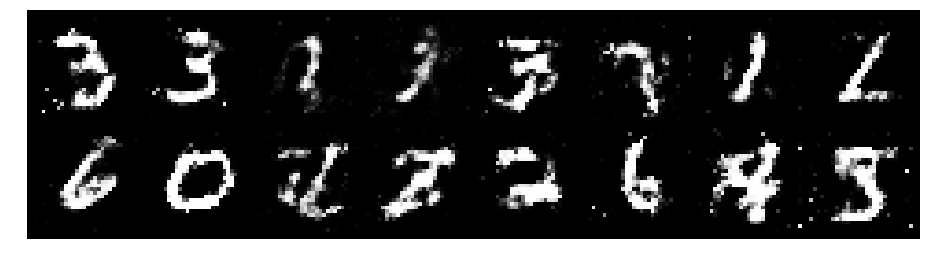

Epoch: [50/200], Batch Num: [500/600]
Discriminator Loss: 1.1136, Generator Loss: 1.1615
D(x): 0.6095, D(G(z)): 0.3535


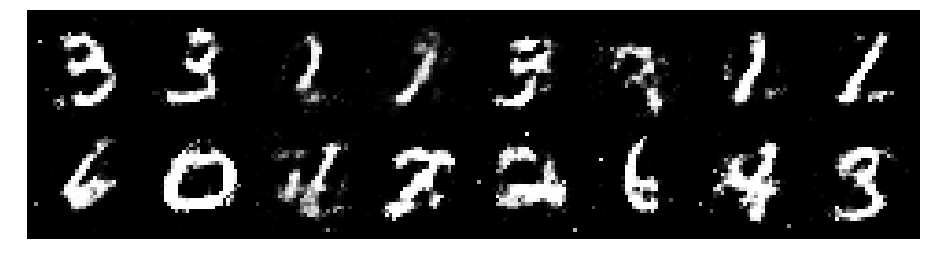

Epoch: [51/200], Batch Num: [0/600]
Discriminator Loss: 1.2566, Generator Loss: 0.6729
D(x): 0.6477, D(G(z)): 0.5109


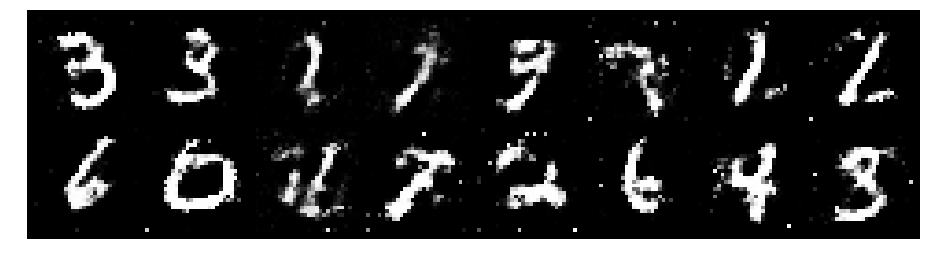

Epoch: [51/200], Batch Num: [100/600]
Discriminator Loss: 1.2053, Generator Loss: 1.0416
D(x): 0.6420, D(G(z)): 0.4504


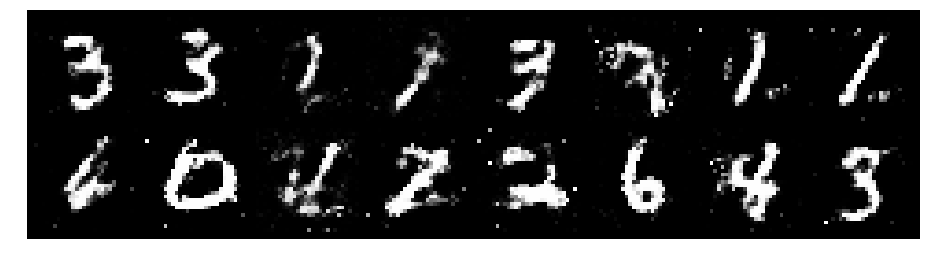

Epoch: [51/200], Batch Num: [200/600]
Discriminator Loss: 1.2017, Generator Loss: 1.0019
D(x): 0.5989, D(G(z)): 0.4108


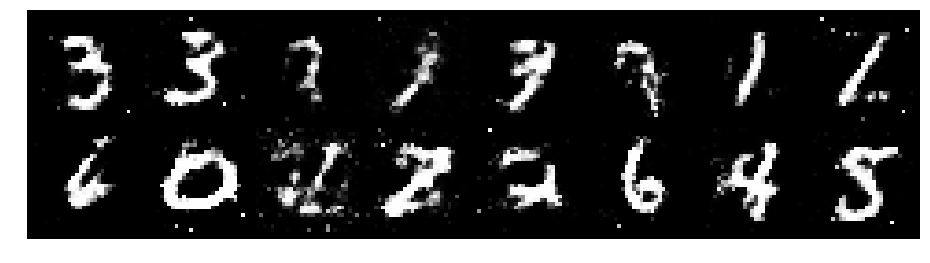

Epoch: [51/200], Batch Num: [300/600]
Discriminator Loss: 1.1495, Generator Loss: 1.1365
D(x): 0.6654, D(G(z)): 0.4394


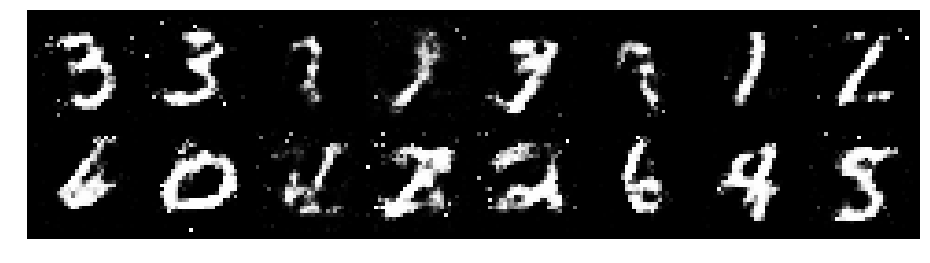

Epoch: [51/200], Batch Num: [400/600]
Discriminator Loss: 1.1879, Generator Loss: 0.9342
D(x): 0.6276, D(G(z)): 0.4226


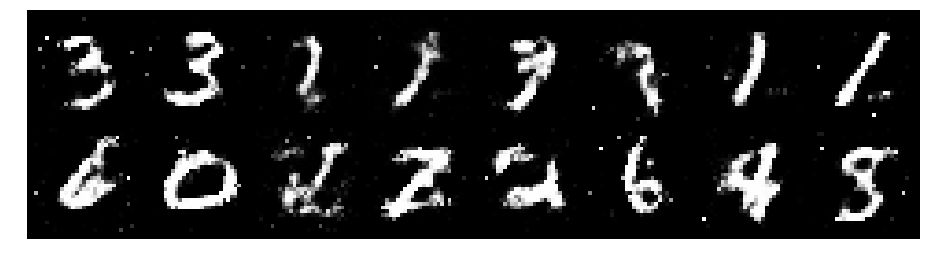

Epoch: [51/200], Batch Num: [500/600]
Discriminator Loss: 1.2937, Generator Loss: 0.9157
D(x): 0.6045, D(G(z)): 0.4568


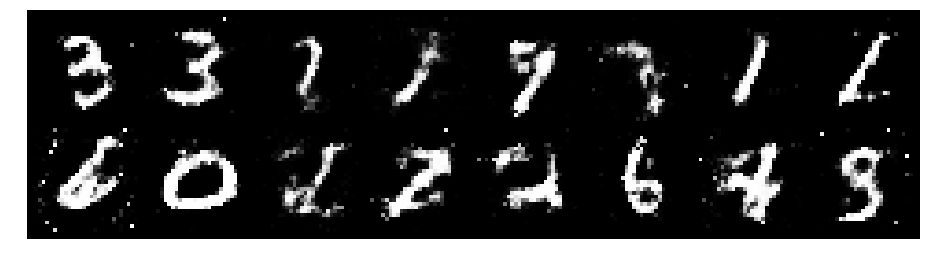

Epoch: [52/200], Batch Num: [0/600]
Discriminator Loss: 1.3251, Generator Loss: 0.8936
D(x): 0.6126, D(G(z)): 0.5050


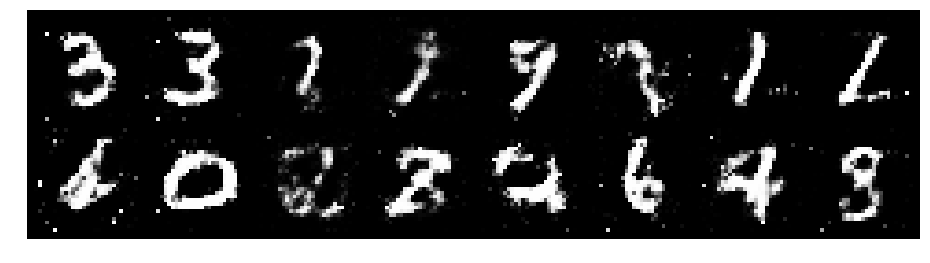

Epoch: [52/200], Batch Num: [100/600]
Discriminator Loss: 1.2870, Generator Loss: 0.8986
D(x): 0.6177, D(G(z)): 0.4519


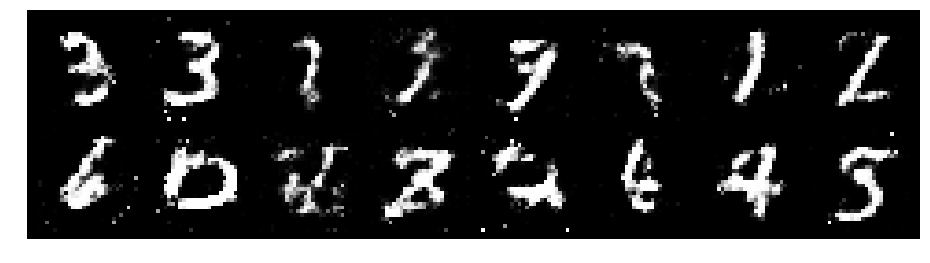

Epoch: [52/200], Batch Num: [200/600]
Discriminator Loss: 1.3169, Generator Loss: 1.0584
D(x): 0.5099, D(G(z)): 0.4045


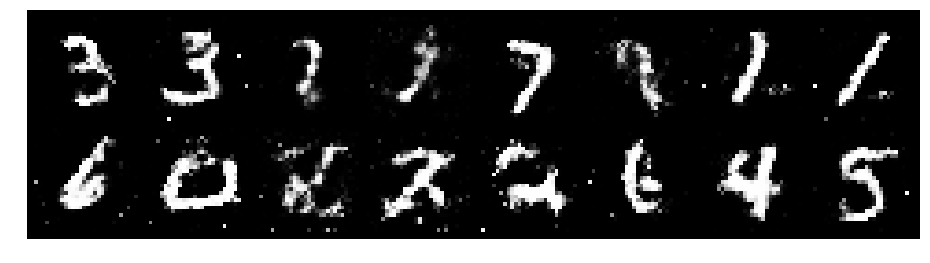

Epoch: [52/200], Batch Num: [300/600]
Discriminator Loss: 1.2514, Generator Loss: 0.7520
D(x): 0.5711, D(G(z)): 0.4695


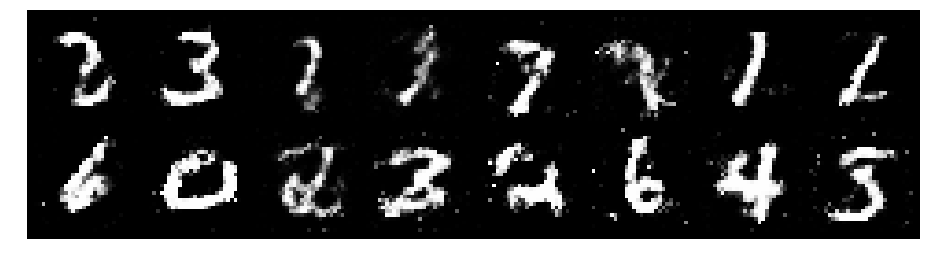

Epoch: [52/200], Batch Num: [400/600]
Discriminator Loss: 1.2324, Generator Loss: 0.8955
D(x): 0.5667, D(G(z)): 0.4076


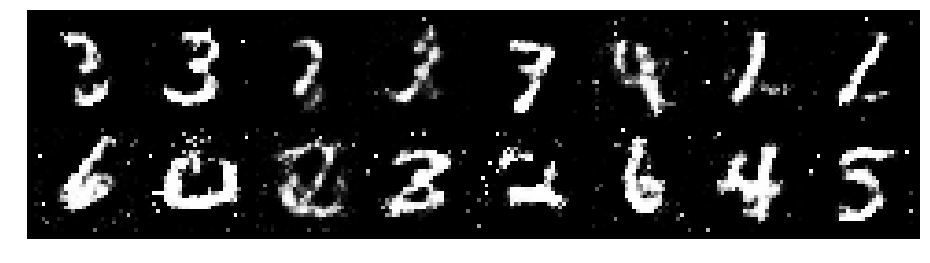

Epoch: [52/200], Batch Num: [500/600]
Discriminator Loss: 1.2373, Generator Loss: 1.1912
D(x): 0.5759, D(G(z)): 0.4043


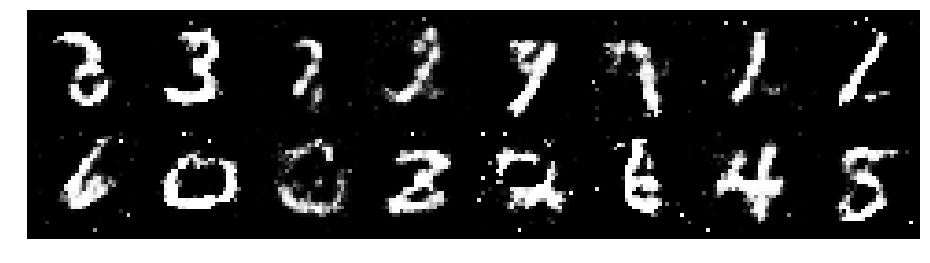

Epoch: [53/200], Batch Num: [0/600]
Discriminator Loss: 1.2427, Generator Loss: 0.9350
D(x): 0.5548, D(G(z)): 0.4150


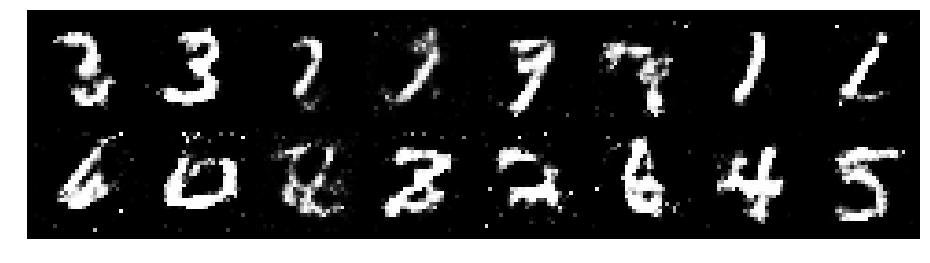

Epoch: [53/200], Batch Num: [100/600]
Discriminator Loss: 1.2795, Generator Loss: 1.0054
D(x): 0.5982, D(G(z)): 0.4462


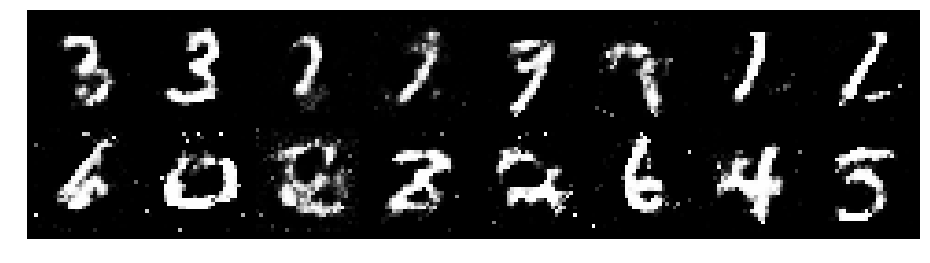

Epoch: [53/200], Batch Num: [200/600]
Discriminator Loss: 1.1937, Generator Loss: 1.0422
D(x): 0.5907, D(G(z)): 0.4185


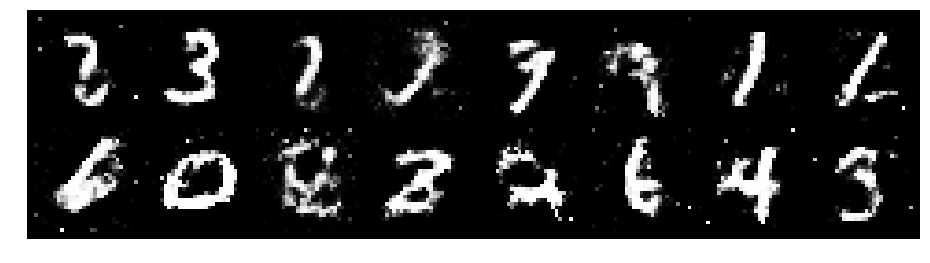

Epoch: [53/200], Batch Num: [300/600]
Discriminator Loss: 1.3248, Generator Loss: 0.8679
D(x): 0.5609, D(G(z)): 0.4551


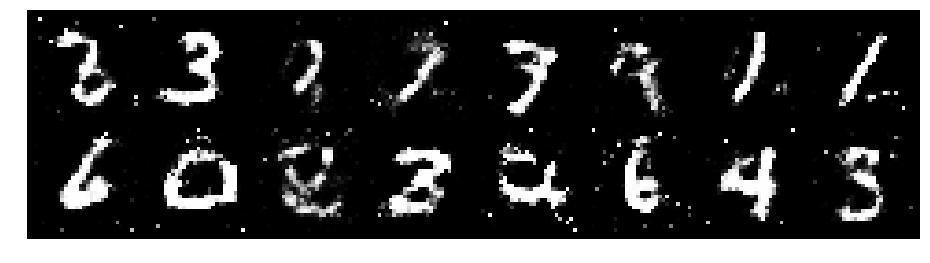

Epoch: [53/200], Batch Num: [400/600]
Discriminator Loss: 1.3376, Generator Loss: 1.2295
D(x): 0.5356, D(G(z)): 0.3892


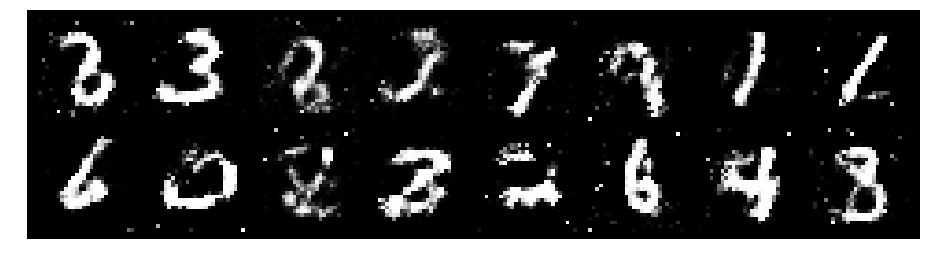

Epoch: [53/200], Batch Num: [500/600]
Discriminator Loss: 1.2150, Generator Loss: 1.1827
D(x): 0.6113, D(G(z)): 0.4096


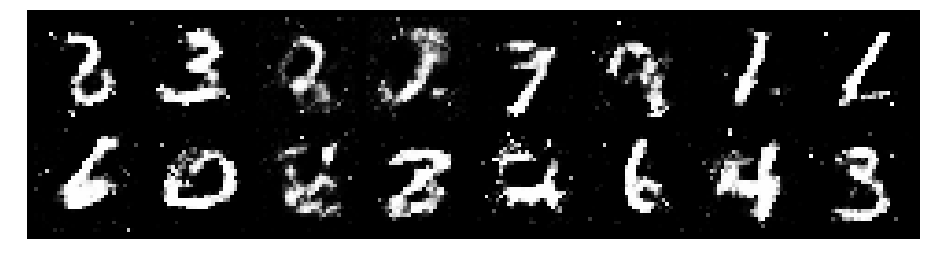

Epoch: [54/200], Batch Num: [0/600]
Discriminator Loss: 1.0521, Generator Loss: 1.0379
D(x): 0.6572, D(G(z)): 0.4046


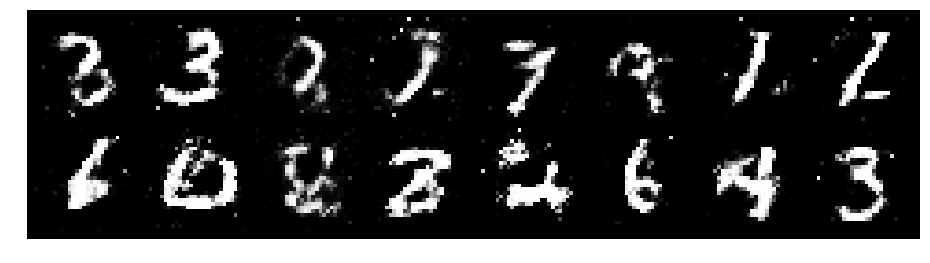

Epoch: [54/200], Batch Num: [100/600]
Discriminator Loss: 1.1999, Generator Loss: 1.1802
D(x): 0.6080, D(G(z)): 0.4211


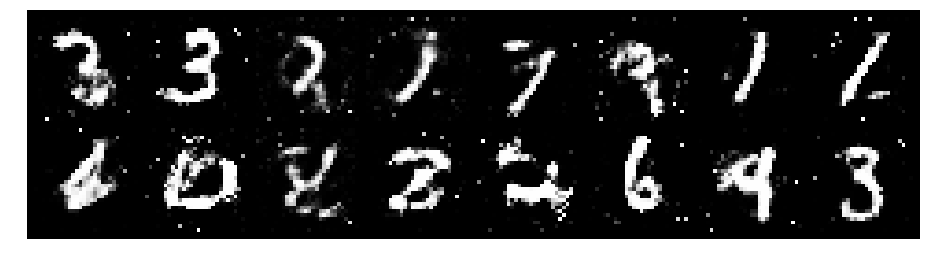

Epoch: [54/200], Batch Num: [200/600]
Discriminator Loss: 1.1674, Generator Loss: 1.3094
D(x): 0.5502, D(G(z)): 0.3437


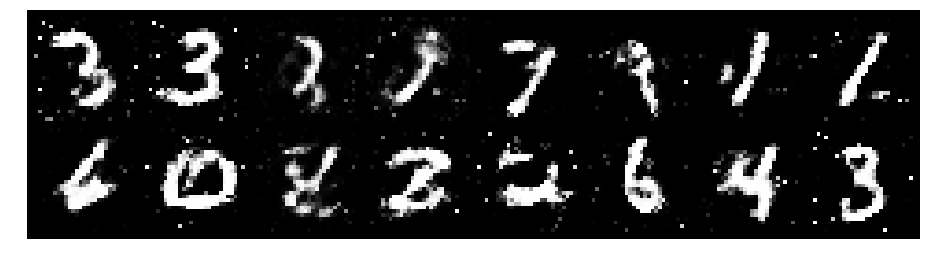

Epoch: [54/200], Batch Num: [300/600]
Discriminator Loss: 1.1033, Generator Loss: 0.9886
D(x): 0.6942, D(G(z)): 0.4295


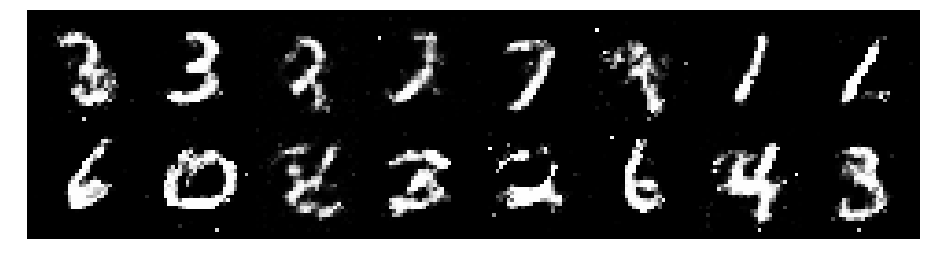

Epoch: [54/200], Batch Num: [400/600]
Discriminator Loss: 0.9672, Generator Loss: 1.1298
D(x): 0.6361, D(G(z)): 0.3381


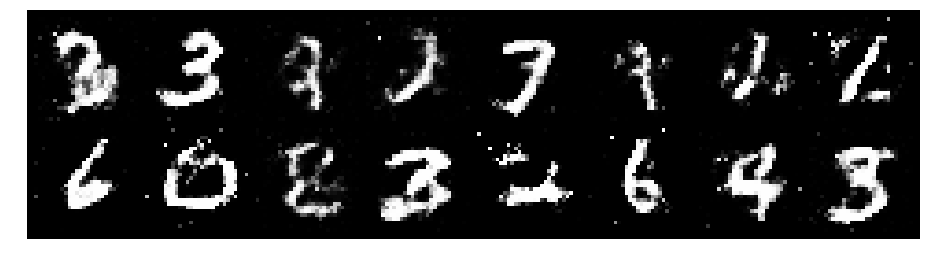

Epoch: [54/200], Batch Num: [500/600]
Discriminator Loss: 1.1347, Generator Loss: 1.2104
D(x): 0.6584, D(G(z)): 0.4429


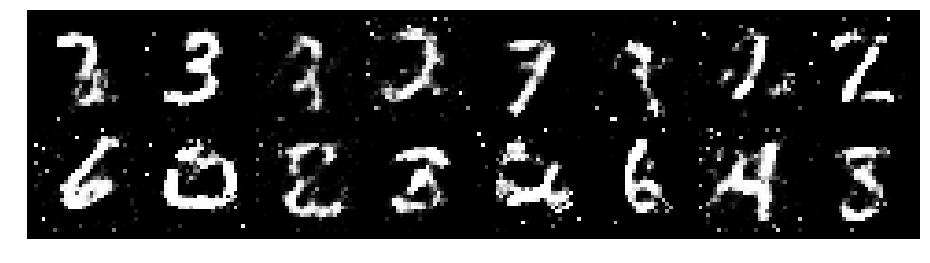

Epoch: [55/200], Batch Num: [0/600]
Discriminator Loss: 1.1498, Generator Loss: 1.1040
D(x): 0.6041, D(G(z)): 0.3828


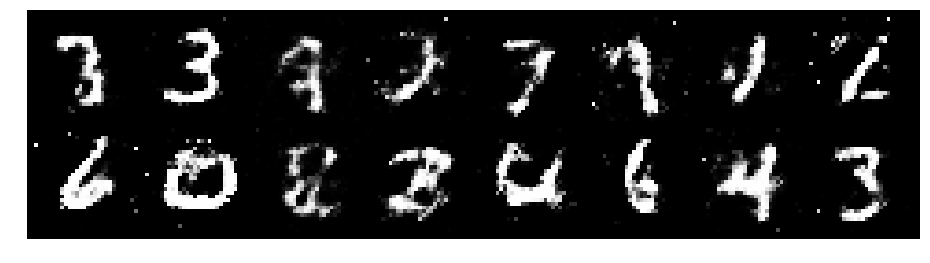

Epoch: [55/200], Batch Num: [100/600]
Discriminator Loss: 1.2323, Generator Loss: 1.2931
D(x): 0.6084, D(G(z)): 0.4090


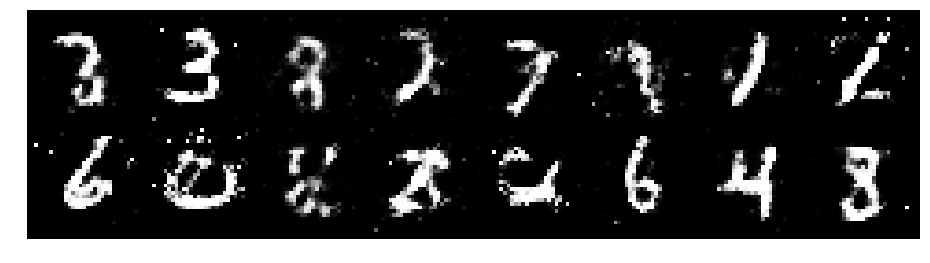

Epoch: [55/200], Batch Num: [200/600]
Discriminator Loss: 1.1200, Generator Loss: 1.2933
D(x): 0.6716, D(G(z)): 0.4149


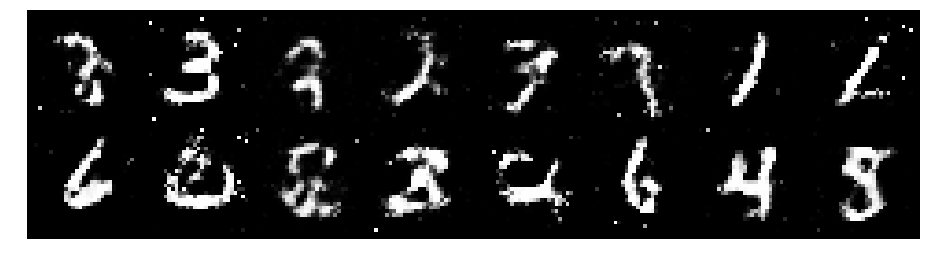

Epoch: [55/200], Batch Num: [300/600]
Discriminator Loss: 1.0521, Generator Loss: 1.1256
D(x): 0.6465, D(G(z)): 0.3780


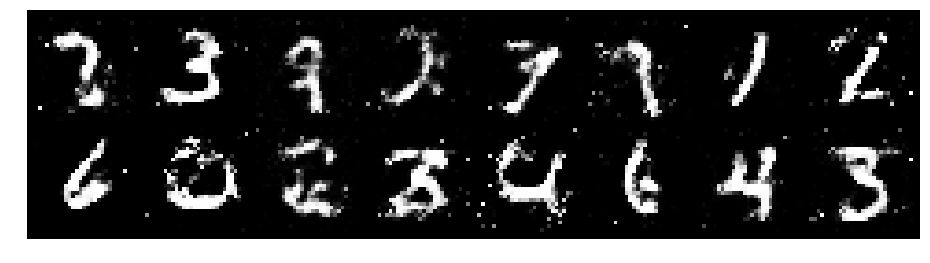

Epoch: [55/200], Batch Num: [400/600]
Discriminator Loss: 1.2402, Generator Loss: 1.2055
D(x): 0.5903, D(G(z)): 0.4168


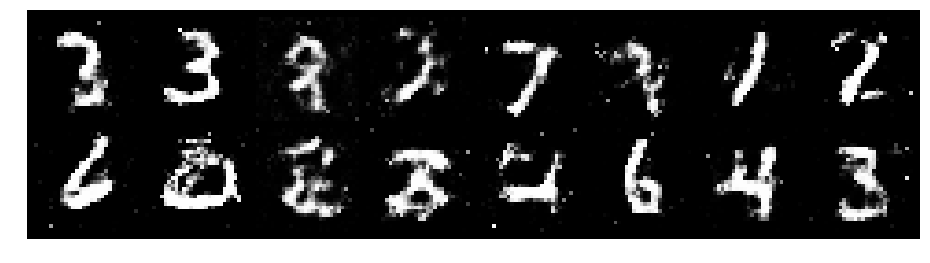

Epoch: [55/200], Batch Num: [500/600]
Discriminator Loss: 1.1269, Generator Loss: 1.3275
D(x): 0.6352, D(G(z)): 0.4013


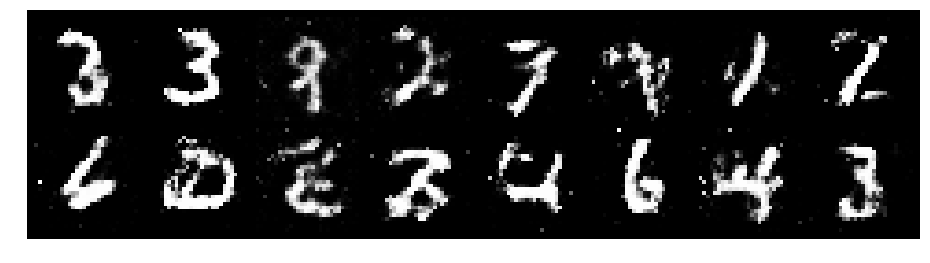

Epoch: [56/200], Batch Num: [0/600]
Discriminator Loss: 1.2194, Generator Loss: 1.0570
D(x): 0.6266, D(G(z)): 0.4224


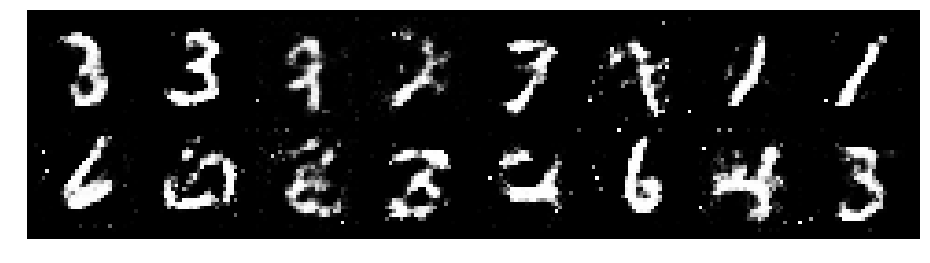

Epoch: [56/200], Batch Num: [100/600]
Discriminator Loss: 1.1321, Generator Loss: 1.2048
D(x): 0.5696, D(G(z)): 0.3349


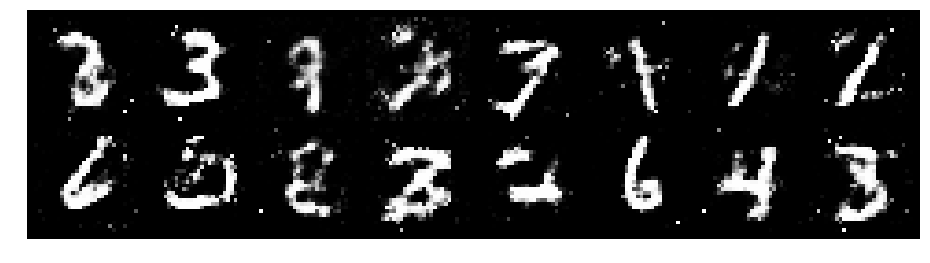

Epoch: [56/200], Batch Num: [200/600]
Discriminator Loss: 1.2211, Generator Loss: 1.2399
D(x): 0.5908, D(G(z)): 0.4097


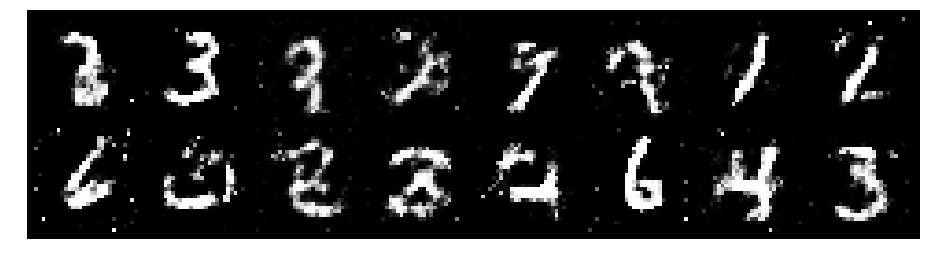

Epoch: [56/200], Batch Num: [300/600]
Discriminator Loss: 1.1700, Generator Loss: 1.0743
D(x): 0.6051, D(G(z)): 0.4241


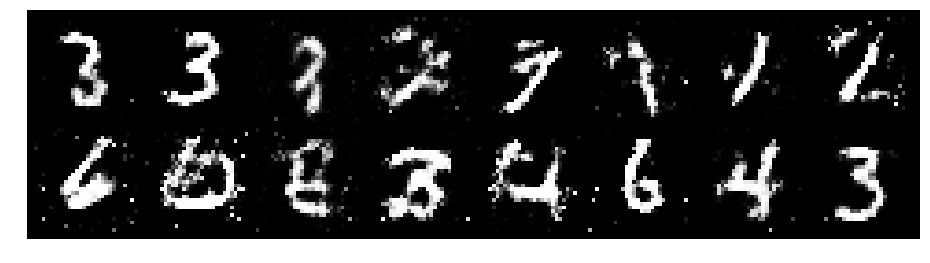

Epoch: [56/200], Batch Num: [400/600]
Discriminator Loss: 1.2674, Generator Loss: 1.0180
D(x): 0.5754, D(G(z)): 0.4387


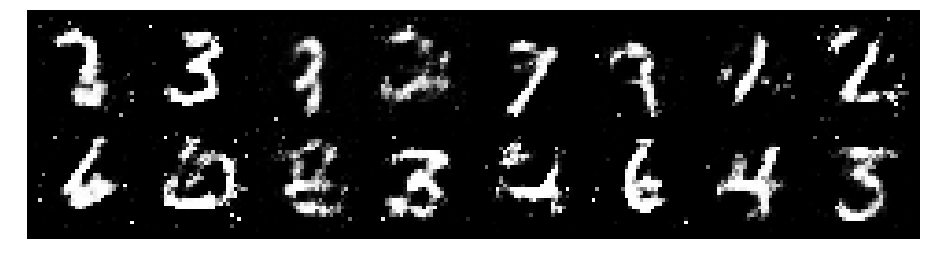

Epoch: [56/200], Batch Num: [500/600]
Discriminator Loss: 1.0895, Generator Loss: 1.2652
D(x): 0.6247, D(G(z)): 0.3752


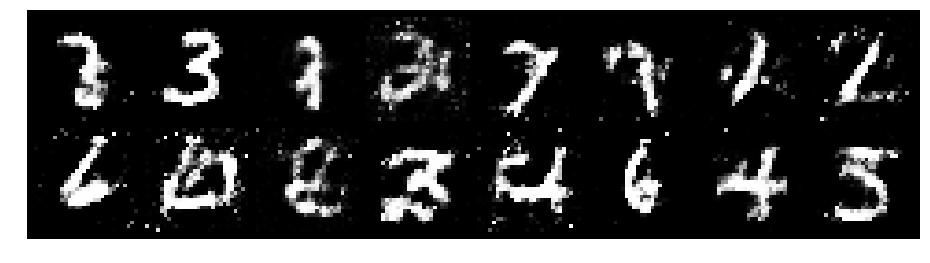

Epoch: [57/200], Batch Num: [0/600]
Discriminator Loss: 1.2274, Generator Loss: 1.1113
D(x): 0.5977, D(G(z)): 0.4036


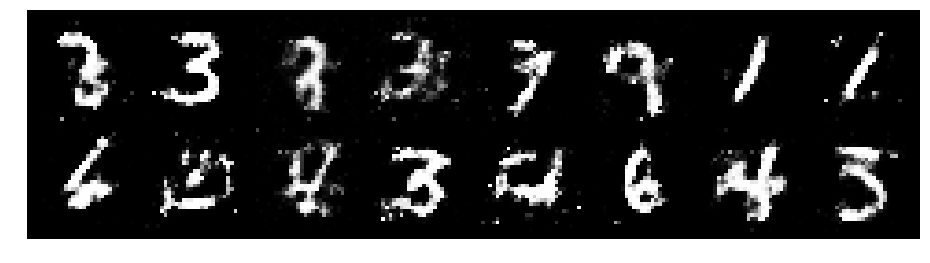

Epoch: [57/200], Batch Num: [100/600]
Discriminator Loss: 1.2008, Generator Loss: 1.0633
D(x): 0.5736, D(G(z)): 0.3979


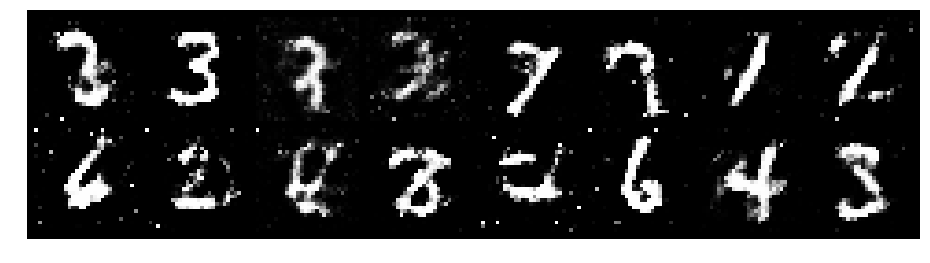

Epoch: [57/200], Batch Num: [200/600]
Discriminator Loss: 1.3072, Generator Loss: 0.8284
D(x): 0.5473, D(G(z)): 0.4433


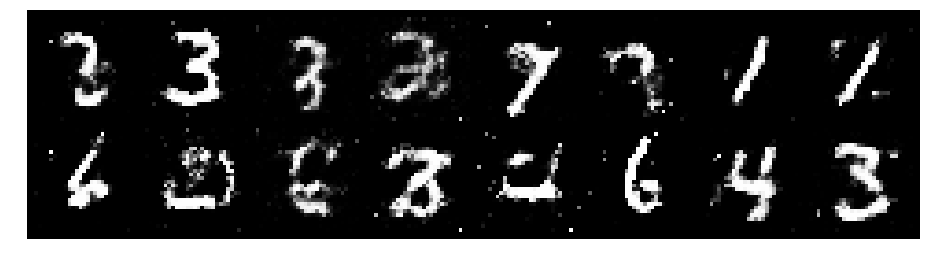

Epoch: [57/200], Batch Num: [300/600]
Discriminator Loss: 1.2453, Generator Loss: 0.8276
D(x): 0.5037, D(G(z)): 0.3875


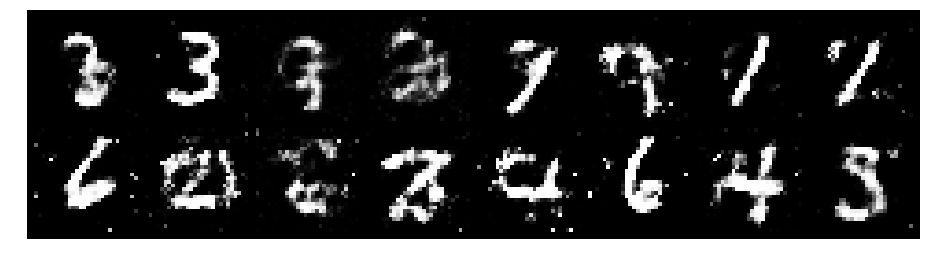

Epoch: [57/200], Batch Num: [400/600]
Discriminator Loss: 1.2262, Generator Loss: 0.9835
D(x): 0.5772, D(G(z)): 0.4187


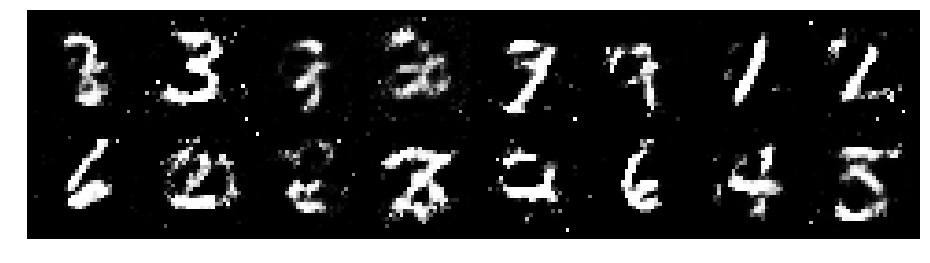

Epoch: [57/200], Batch Num: [500/600]
Discriminator Loss: 1.2479, Generator Loss: 0.7850
D(x): 0.5961, D(G(z)): 0.4642


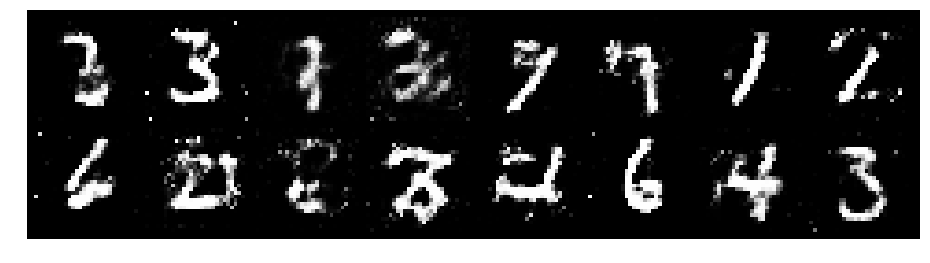

Epoch: [58/200], Batch Num: [0/600]
Discriminator Loss: 1.2179, Generator Loss: 0.9207
D(x): 0.5937, D(G(z)): 0.4390


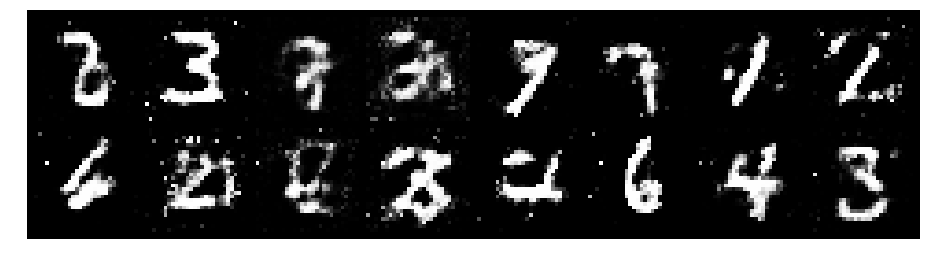

Epoch: [58/200], Batch Num: [100/600]
Discriminator Loss: 1.3449, Generator Loss: 0.9305
D(x): 0.6348, D(G(z)): 0.5075


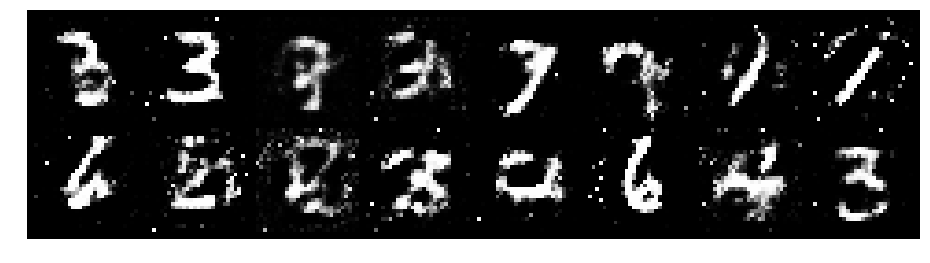

Epoch: [58/200], Batch Num: [200/600]
Discriminator Loss: 1.2152, Generator Loss: 1.0548
D(x): 0.5925, D(G(z)): 0.4316


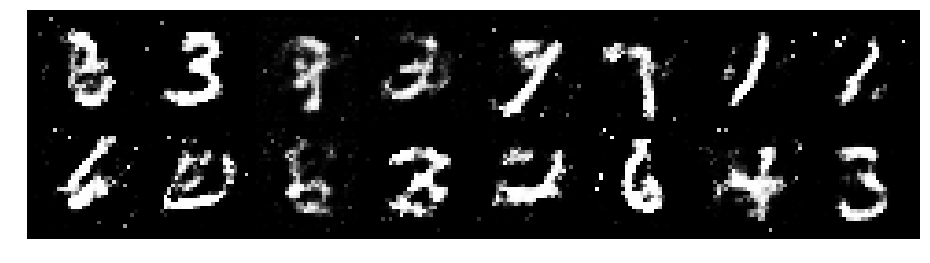

Epoch: [58/200], Batch Num: [300/600]
Discriminator Loss: 1.0111, Generator Loss: 1.2758
D(x): 0.6111, D(G(z)): 0.3377


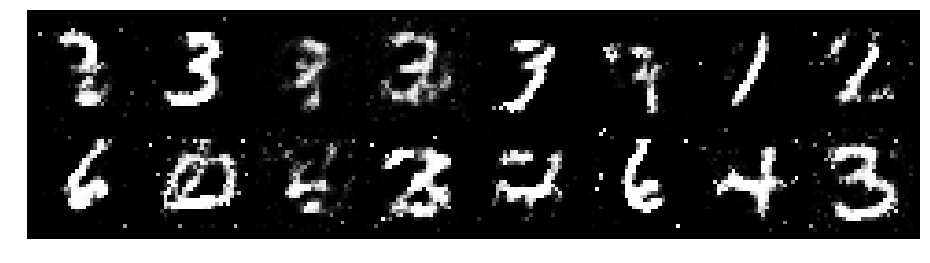

Epoch: [58/200], Batch Num: [400/600]
Discriminator Loss: 1.2180, Generator Loss: 0.9970
D(x): 0.5874, D(G(z)): 0.4231


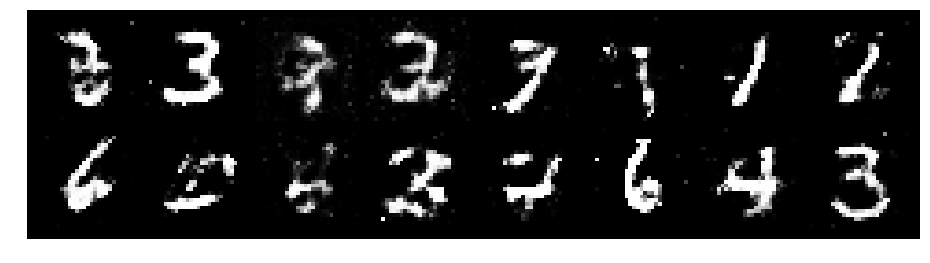

Epoch: [58/200], Batch Num: [500/600]
Discriminator Loss: 1.1931, Generator Loss: 0.7752
D(x): 0.5961, D(G(z)): 0.4444


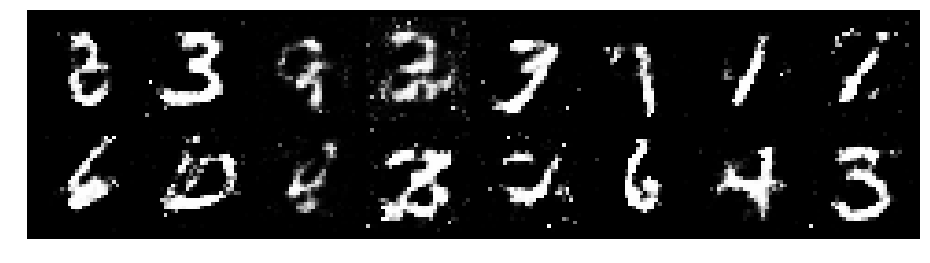

Epoch: [59/200], Batch Num: [0/600]
Discriminator Loss: 1.3041, Generator Loss: 1.0415
D(x): 0.5306, D(G(z)): 0.3891


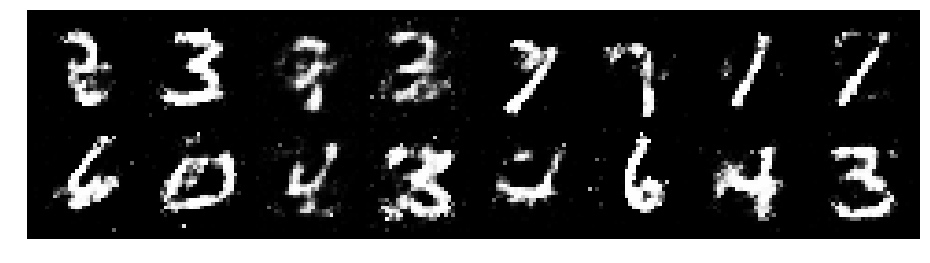

Epoch: [59/200], Batch Num: [100/600]
Discriminator Loss: 1.2155, Generator Loss: 0.7909
D(x): 0.5946, D(G(z)): 0.4425


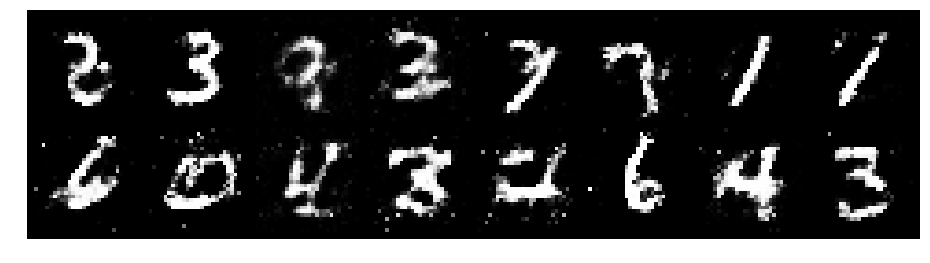

Epoch: [59/200], Batch Num: [200/600]
Discriminator Loss: 1.1517, Generator Loss: 0.9178
D(x): 0.6045, D(G(z)): 0.4288


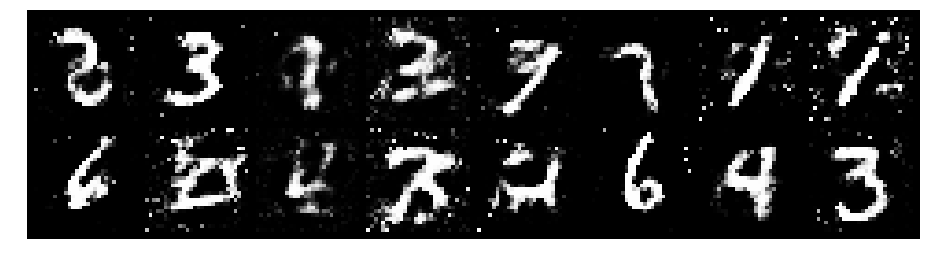

Epoch: [59/200], Batch Num: [300/600]
Discriminator Loss: 1.2265, Generator Loss: 1.0203
D(x): 0.5990, D(G(z)): 0.4407


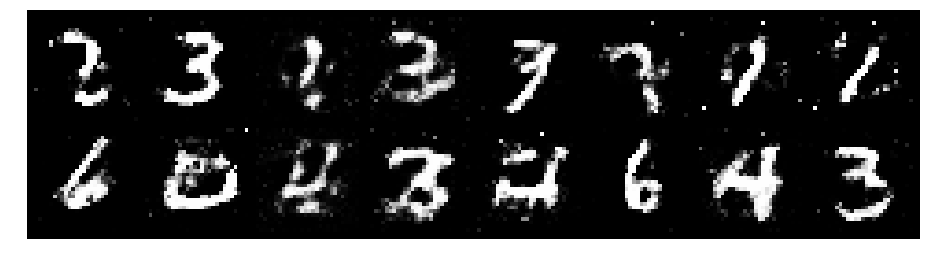

Epoch: [59/200], Batch Num: [400/600]
Discriminator Loss: 1.2015, Generator Loss: 0.8916
D(x): 0.5899, D(G(z)): 0.4357


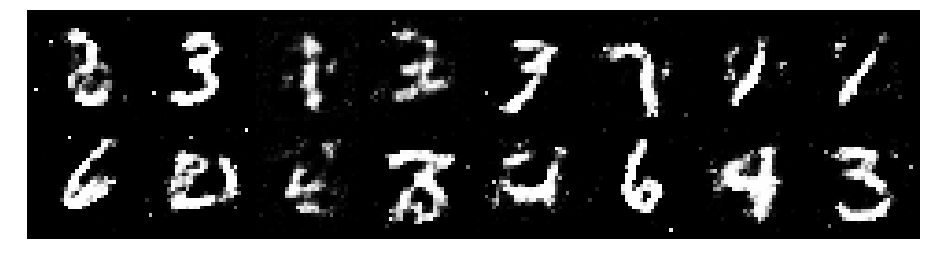

Epoch: [59/200], Batch Num: [500/600]
Discriminator Loss: 1.1252, Generator Loss: 1.1043
D(x): 0.6175, D(G(z)): 0.4075


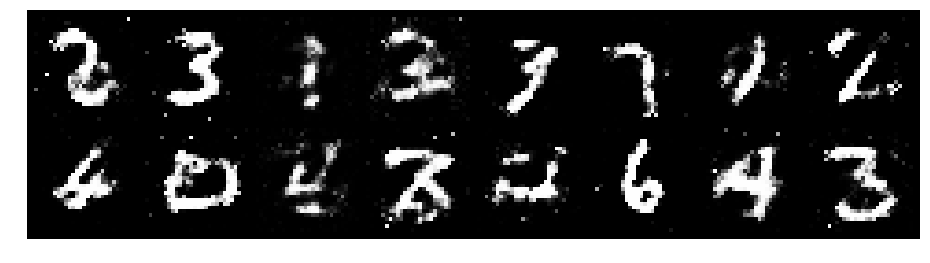

Epoch: [60/200], Batch Num: [0/600]
Discriminator Loss: 1.3389, Generator Loss: 0.9727
D(x): 0.5037, D(G(z)): 0.4162


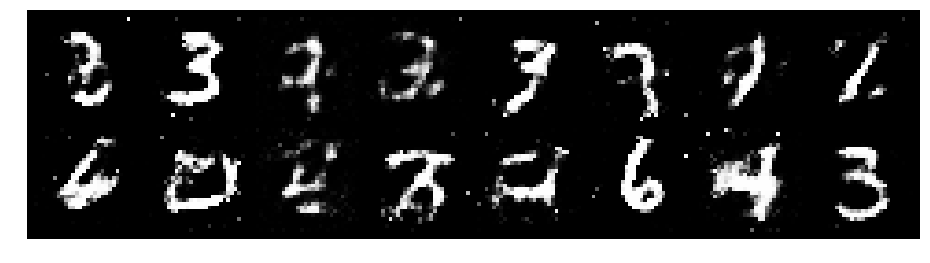

Epoch: [60/200], Batch Num: [100/600]
Discriminator Loss: 1.2961, Generator Loss: 0.8041
D(x): 0.5799, D(G(z)): 0.4677


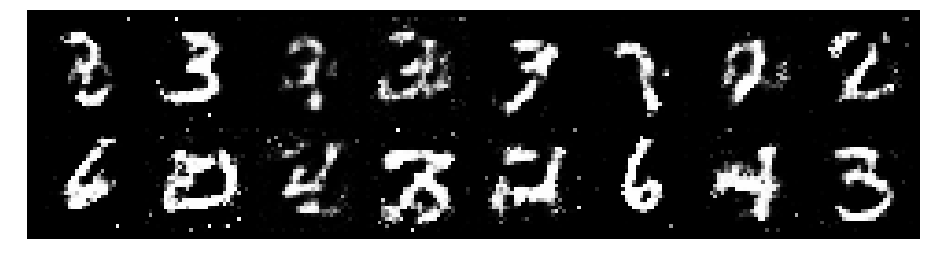

Epoch: [60/200], Batch Num: [200/600]
Discriminator Loss: 1.2560, Generator Loss: 0.8761
D(x): 0.5620, D(G(z)): 0.4208


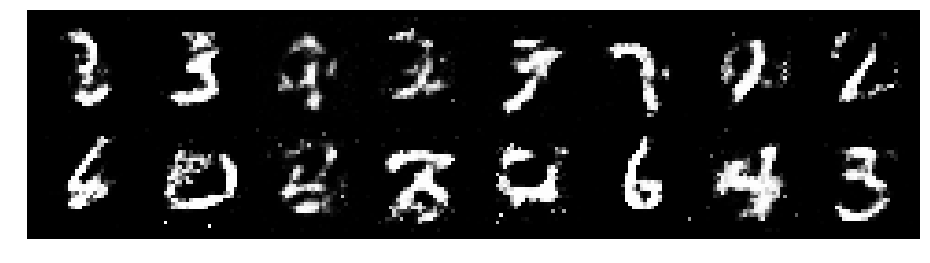

Epoch: [60/200], Batch Num: [300/600]
Discriminator Loss: 1.2891, Generator Loss: 0.8501
D(x): 0.5411, D(G(z)): 0.4407


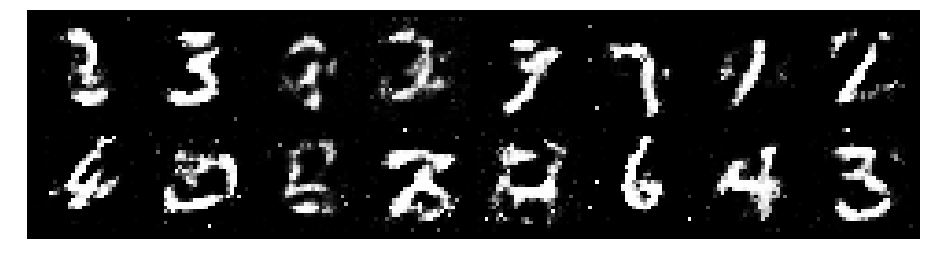

Epoch: [60/200], Batch Num: [400/600]
Discriminator Loss: 1.1876, Generator Loss: 0.9906
D(x): 0.6149, D(G(z)): 0.4293


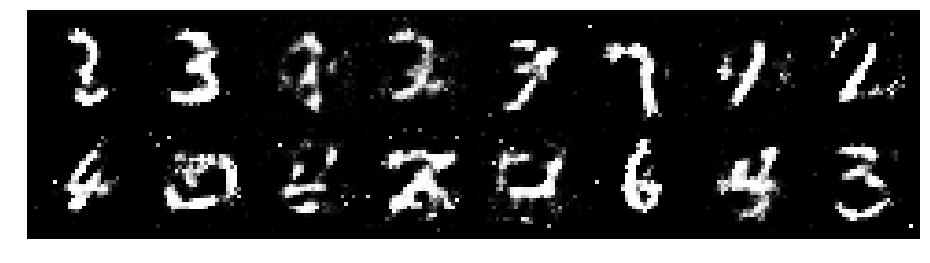

Epoch: [60/200], Batch Num: [500/600]
Discriminator Loss: 1.1241, Generator Loss: 1.0088
D(x): 0.6125, D(G(z)): 0.3922


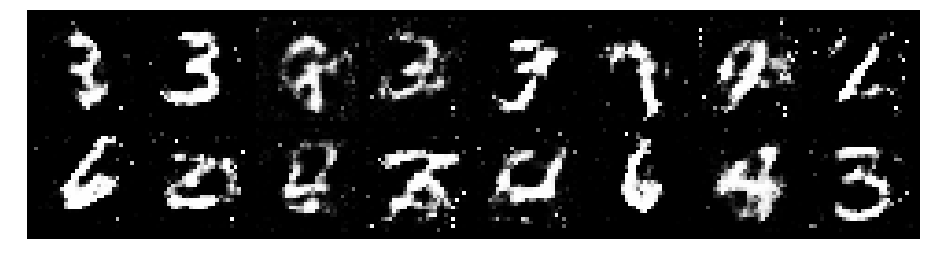

Epoch: [61/200], Batch Num: [0/600]
Discriminator Loss: 1.1970, Generator Loss: 0.8311
D(x): 0.6071, D(G(z)): 0.4417


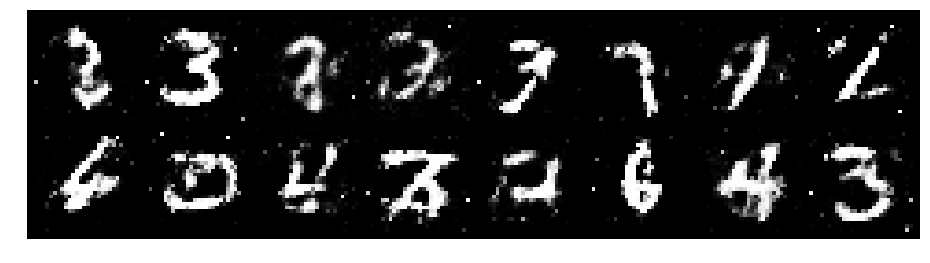

Epoch: [61/200], Batch Num: [100/600]
Discriminator Loss: 1.1076, Generator Loss: 1.0214
D(x): 0.5895, D(G(z)): 0.3758


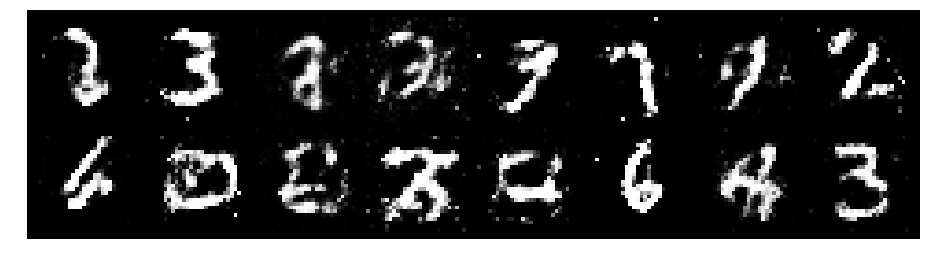

Epoch: [61/200], Batch Num: [200/600]
Discriminator Loss: 1.2289, Generator Loss: 1.0905
D(x): 0.6373, D(G(z)): 0.4714


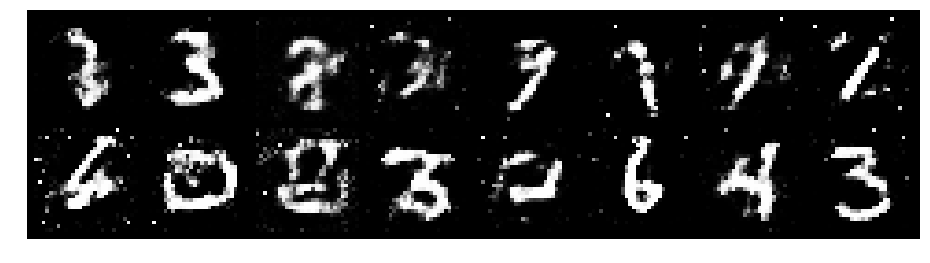

Epoch: [61/200], Batch Num: [300/600]
Discriminator Loss: 1.1892, Generator Loss: 0.9503
D(x): 0.5965, D(G(z)): 0.4235


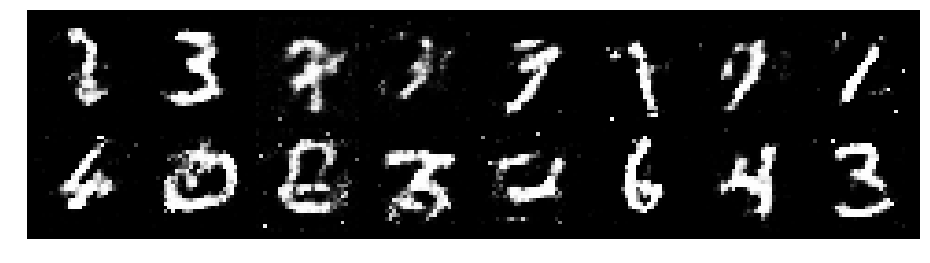

Epoch: [61/200], Batch Num: [400/600]
Discriminator Loss: 1.2170, Generator Loss: 0.8731
D(x): 0.5793, D(G(z)): 0.4353


KeyboardInterrupt: 

In [31]:
# Create logger instance
logger = Logger(model_name='VGAN', data_name='MNIST')
# Total number of epochs to train
num_epochs = 200
for epoch in range(num_epochs):
    for n_batch, (real_batch,_) in enumerate(data_loader):
        N = real_batch.size(0)
        # 1. Train Discriminator
        real_data = Variable(images_to_vectors(real_batch))
        # Generate fake data and detach 
        # (so gradients are not calculated for generator)
        fake_data = generator(noise(N)).detach()
        # Train D
        d_error, d_pred_real, d_pred_fake = \
              train_discriminator(d_optimizer, real_data, fake_data)

        # 2. Train Generator
        # Generate fake data
        fake_data = generator(noise(N))
        # Train G
        g_error = train_generator(g_optimizer, fake_data)
        # Log batch error
        logger.log(d_error, g_error, epoch, n_batch, num_batches)
        # Display Progress every few batches
        if (n_batch) % 100 == 0: 
            test_images = vectors_to_images(generator(test_noise))
            test_images = test_images.data
            logger.log_images(
                test_images, num_test_samples, 
                epoch, n_batch, num_batches
            );
            # Display status Logs
            logger.display_status(
                epoch, num_epochs, n_batch, num_batches,
                d_error, g_error, d_pred_real, d_pred_fake
            )